Use virtual environment's python interpreter to run the notebook


In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.float_format', lambda x: f'{x:.128f}')


In [2]:
df32 = pd.read_csv("data32.csv").astype(np.float128, errors='ignore')
df64 = pd.read_csv("data64.csv").astype(np.float128, errors='ignore')
dataNone = pd.read_csv("dataNone.csv").astype(np.float128, errors='ignore')

In [3]:
df32.shot.nunique()

212

In [4]:
nan_columns = df32.columns[df32.isna().all()]
print("Columns with NaNs:", nan_columns.tolist())

Columns with NaNs: ['time_until_disrupt']


In [5]:
# Drop time_until_disrupt from df32, df64, and dataNone
df32 = df32.drop(columns=['time_until_disrupt'])
df64 = df64.drop(columns=['time_until_disrupt'])
dataNone = dataNone.drop(columns=['time_until_disrupt'])

In [6]:
# Drop te_width_ece and te_width
df32 = df32.drop(columns=['te_width_ece', 'te_width'])
df64 = df64.drop(columns=['te_width_ece', 'te_width'])
dataNone = dataNone.drop(columns=['te_width_ece', 'te_width'])

In [7]:
# Estimate confinement time
# tau = wmhd / (p_input - dwmhd_dt)

df32['tau'] = df32['wmhd'] / (df32['p_input'] - df32['dwmhd_dt'])
df64['tau'] = df64['wmhd'] / (df64['p_input'] - df64['dwmhd_dt'])
dataNone['tau'] = dataNone['wmhd'] / (dataNone['p_input'] - dataNone['dwmhd_dt'])

### Differences between 64 and 32 casting precision

In [8]:
# Compute absolute differences
diff_abs = (df32.abs() - df64.abs()).abs()

# Get the maximum difference for each column
max_differences = diff_abs.max()

# Divide by the maximum value of each column in shot_data64
# max_differences = max_differences  

# Sort the differences in descending order and get the top 10
top_10_differences = max_differences.sort_values(ascending=False).head(10)

# Display the column names and their corresponding max differences
top_10_differences
# covert to  pd.DataFrame
top_10_differences_df = top_10_differences.reset_index()
top_10_differences_df.columns = ['column_name', 'max_difference']
top_10_differences_df

,column_name,max_difference
0,dn_dt,5693538828036341760.000000000000000000000000000...
1,n_e,35308598394880.00000000000000000000000000000000...
2,dprad_dt,3643.477287292480468750000000000000000000000000...
3,dip_dt,289.9192507266998291015625000000000000000000000...
4,dip_smoothed,179.9643965778523124754428863525390625000000000...
5,p_input,100.9918901151977479457855224609375000000000000...
6,p_oh,100.9918872395064681768417358398437500000000000...
7,dipprog_dt,7.265183150768280029296875000000000000000000000...
8,p_rad,1.878856986761093139648437500000000000000000000...
9,dwmhd_dt,0.892521372996270656585693359375000000000000000...


In [9]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()


# Get the corresponding values from df32 and df64 
for i in range(len(max_positions)):
    print(f"Column: {max_positions.index[i]}")
    print(f"Shot: {df32.loc[max_positions.iloc[i], 'shot']}")
    print(f"Max difference in row: {max_positions.iloc[i]}")
    print(f"Value in df32: {df32.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"Value in df64: {df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
    # print(f"Value in dataNone: {dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")

    print(f"Absolute difference: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 64 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df32.loc[max_positions.iloc[i], max_positions.index[i]]}")

    # print(f"relative difference None: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print() 

Column: idx
Shot: 950112023.0
Max difference in row: 0
Value in df32: 0.0
Value in df64: 0.0
Absolute difference: 0.0
relative difference 64 %: nan
relative difference 32 %: nan

Column: shot
Shot: 950112023.0
Max difference in row: 0
Value in df32: 950112023.0
Value in df64: 950112023.0
Absolute difference: 0.0
relative difference 64 %: 0.0
relative difference 32 %: 0.0

Column: time
Shot: 950112023.0
Max difference in row: 0
Value in df32: 0.1000000014901161
Value in df64: 0.1000000014901161
Absolute difference: 0.0
relative difference 64 %: 0.0
relative difference 32 %: 0.0

Column: a_minor
Shot: 1000511006.0
Max difference in row: 3426
Value in df32: 0.2174199
Value in df64: 0.2174198925495147
Absolute difference: 7.45048531203274e-09
relative difference 64 %: 3.426772603309968e-06
relative difference 32 %: 3.4267724858822674e-06

Column: beta_n
Shot: 1120920017.0
Max difference in row: 15345
Value in df32: -71.32113832375035
Value in df64: -71.32112899835842
Absolute difference: 9

/tmp/ipykernel_833284/3318831767.py:15: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 64 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
/tmp/ipykernel_833284/3318831767.py:16: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df32.loc[max_positions.iloc[i], max_positions.index[i]]}")


In [10]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()

# Build a DataFrame with the relevant information
rows = []
for col in max_positions.index:
    shot = df32.loc[max_positions[col], 'shot']
    time = df32.loc[max_positions[col], 'time']
    row_idx = max_positions[col]
    val32 = df32.loc[row_idx, col]
    val64 = df64.loc[row_idx, col]
    abs_diff = diff_abs.loc[row_idx, col]
    rel_diff_64 = 100 * abs_diff / val64 if val64 != 0 else np.nan
    rel_diff_32 = 100 * abs_diff / val32 if val32 != 0 else np.nan
    rows.append({
        'column': col,
        'shot': shot,
        'time': time,
        'row_index': row_idx,
        'df32_value': val32,
        'df64_value': val64,
        'absolute_difference': abs_diff,
        'relative_difference_64_percent': rel_diff_64,
        'relative_difference_32_percent': rel_diff_32
    })

max_diff_df = pd.DataFrame(rows)
max_diff_df

,column,shot,time,row_index,df32_value,df64_value,absolute_difference,relative_difference_64_percent,relative_difference_32_percent
0,idx,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,NaN,NaN
1,shot,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,950112023.0000000000000000000000000000000000000...,950112023.0000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
2,time,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.100000001490116105506977817185543244704604148...,0.100000001490116105506977817185543244704604148...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
3,a_minor,1000511006.000000000000000000000000000000000000...,0.359999984502792302887286268742172978818416595...,3426,0.217419899999999999273825324053177610039710998...,0.217419892549514687241085653113259468227624893...,0.000000007450485312032739670939918141812086105...,0.000003426772603309968098978834094570089519038...,0.000003426772485882267387571073827268186562378...
4,beta_n,1120920017.000000000000000000000000000000000000...,1.699999928474426491575854925031308084726333618...,15345,-71.3211383237503468990325927734375000000000000...,-71.3211289983584180163234123028814792633056640...,0.000009325391928882709180470556020736694335937...,-0.00001307521636273782121768528841077028346262...,-0.00001307521465312521633276784949195814533595...
...,...,...,...,...,...,...,...,...,...
57,z_error,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,-0.45548505868738681234830778521427419036626815...,-0.45548507865867049471120253656408749520778656...,0.000000019971283682362894751349813304841518402...,-0.00000438461864462719125783802739948491478116...,-0.00000438461883687600618850687891892015102257...
58,z_prog,1110106023.000000000000000000000000000000000000...,0.879999995231628417968750000000000000000000000...,12090,0.015075014902862400589800273564833332784473896...,0.015075013974047200490669062844517611665651202...,0.000000000928815200099131210720315721118822693...,0.000006161289148375969771233382626940411341820...,0.000006161288768761153660934344611366242361327...
59,z_times_v_z,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,5.281936684722856156781745085027068853378295898...,5.281981962706120192763137310976162552833557128...,0.000045277983264035981392225949093699455261230...,0.000857215787250411058104115902267494675470516...,0.000857223135502460545191716345669874499435536...
60,zcur,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,-0.45544684983091621166551021815394051373004913...,-0.45544686980213738847211857319052796810865402...,0.000000019971221176806608355036587454378604888...,-0.00000438497275993637408405059763261135685752...,-0.00000438497295221624378366463356537785500677...


In [11]:
max_diff_df_sorted = max_diff_df.sort_values(by='relative_difference_64_percent', ascending=False)
max_diff_df_sorted[['column','relative_difference_64_percent']]

,column,relative_difference_64_percent
16,greenwald_fraction,99.99999999979034726038662483915686607360839843...
41,radiated_fraction,0.191327800653822488463617901288671419024467468...
10,dip_smoothed,0.138805720741711491328373995202127844095230102...
9,dip_dt,0.036723272713538604450356217512307921424508094...
34,p_oh,0.005716161095664645461211783583621581783518195...
...,...,...
55,v_z,-0.00085275785877103095228984885878276145376730...
28,n_equal_1_phase,-0.00243136276082638654733036887023445160593837...
13,dn_dt,-0.64046224578619015410652082209708169102668762...
61,tau,-0.76166783854930708574926256915205158293247222...


In [12]:
# import matplotlib.pyplot as plt
# # Filter df64 by the given shot number (for example, shot = 1160921011)
# shot_number = 1160826029#1160921011
# df64_shot = df64[df64['shot'] == shot_number]
# df32_shot = df32[df32['shot'] == shot_number]

# # Plot all signals (excluding 'shot' and 'time' columns)
# # df64_shot.set_index('time').drop(columns=['shot']).plot(subplots=True, figsize=(12, 30), layout=(-1, 2), legend=True)
# # df32_shot.set_index('time').drop(columns=['shot']).plot(subplots=True, figsize=(12, 30), layout=(-1, 2), legend=True)
# # Plot all signals from both dataframes for comparison
# signals = [col for col in df64_shot.columns if col not in ['shot', 'time']]
# fig, axes = plt.subplots(len(signals), 1, figsize=(12, 2 * len(signals)), sharex=True)
# if len(signals) == 1:
#     axes = [axes]
# for idx, signal in enumerate(signals):
#     axes[idx].plot(df64_shot['time'], df64_shot[signal], label='float64', color='b')
#     axes[idx].plot(df32_shot['time'], df32_shot[signal], label='float32', color='r', linestyle='--')
#     axes[idx].set_ylabel(signal)
#     axes[idx].legend()
# axes[-1].set_xlabel('time')
# plt.tight_layout()
# plt.show()

## Error Propagation in Numerical Derivatives

Let \( f(t) \) be a function of time with uncertainty \( \sigma_f \), sampled at discrete points \( t_i \). We aim to compute the first and second derivatives of \( f \) and propagate the measurement uncertainties.

### First Derivative

Using the **central difference** approximation for the first derivative:

$$
f'(t_i) \approx \frac{f(t_{i+1}) - f(t_{i-1})}{t_{i+1} - t_{i-1}} = \frac{f_{i+1} - f_{i-1}}{2h}
$$

Assuming \( h = t_{i+1} - t_i = t_i - t_{i-1} \) and uncorrelated errors:

$$
\sigma_{f'}(t_i) = \frac{1}{2h} \sqrt{ \sigma_{f_{i+1}}^2 + \sigma_{f_{i-1}}^2 }
$$

If all uncertainties are equal: \( \sigma_{f_{i}} = \sigma_f \), then:

$$
\sigma_{f'}(t_i) = \frac{\sqrt{2} \, \sigma_f}{2h}
$$

---

### Second Derivative

Using the **central difference** formula for the second derivative:

$$
f''(t_i) \approx \frac{f(t_{i+1}) - 2f(t_i) + f(t_{i-1})}{h^2}
$$

The corresponding uncertainty, assuming uncorrelated errors:

$$
\sigma_{f''}(t_i) = \frac{1}{h^2} \sqrt{ \sigma_{f_{i+1}}^2 + 4\sigma_{f_i}^2 + \sigma_{f_{i-1}}^2 }
$$

For constant uncertainty \( \sigma_f \), this simplifies to:

$$
\sigma_{f''}(t_i) = \frac{\sqrt{6} \, \sigma_f}{h^2}
$$

---

### Notes

- These formulas assume that errors in \( f \) at each time point are **independent**.
- If time steps are **non-uniform**, \( h \) must be computed individually at each step.
- For correlated data, covariance terms must be included in the uncertainty propagation.



In [13]:
import numpy as np

def first_derivative_with_error(t, f, sigma_f):
    """
    Compute first derivative and its uncertainty using central differences.

    Parameters:
    t : numpy array
        Time values (assumed to be evenly spaced or nearly so)
    f : numpy array
        Function values
    sigma_f : numpy array
        Uncertainties in f

    Returns:
    df_dt : numpy array
        First derivative values
    sigma_df_dt : numpy array
        Uncertainty in first derivative
    """
    df_dt = np.zeros_like(f)
    sigma_df_dt = np.zeros_like(f)

    for i in range(1, len(f) - 1):
        h = t[i+1] - t[i-1]
        df_dt[i] = (f[i+1] - f[i-1]) / h
        sigma_df_dt[i] = np.sqrt(sigma_f[i+1]**2 + sigma_f[i-1]**2) / h

    # Fill boundaries with NaNs or forward/backward differences if needed
    df_dt[0] = df_dt[-1] = np.nan
    sigma_df_dt[0] = sigma_df_dt[-1] = np.nan

    return df_dt, sigma_df_dt

def second_derivative_with_error(t, f, sigma_f):
    """
    Compute second derivative and its uncertainty using central differences.

    Parameters:
    t : numpy array
        Time values (assumed to be evenly spaced or nearly so)
    f : numpy array
        Function values
    sigma_f : numpy array
        Uncertainties in f

    Returns:
    d2f_dt2 : numpy array
        Second derivative values
    sigma_d2f_dt2 : numpy array
        Uncertainty in second derivative
    """
    d2f_dt2 = np.zeros_like(f)
    sigma_d2f_dt2 = np.zeros_like(f)

    for i in range(1, len(f) - 1):
        h = t[i+1] - t[i]
        d2f_dt2[i] = (f[i+1] - 2*f[i] + f[i-1]) / (h**2)
        sigma_d2f_dt2[i] = np.sqrt(sigma_f[i+1]**2 + 4*sigma_f[i]**2 + sigma_f[i-1]**2) / (h**2)

    # Fill boundaries with NaNs or forward/backward differences if needed
    d2f_dt2[0] = d2f_dt2[-1] = np.nan
    sigma_d2f_dt2[0] = sigma_d2f_dt2[-1] = np.nan

    return d2f_dt2, sigma_d2f_dt2



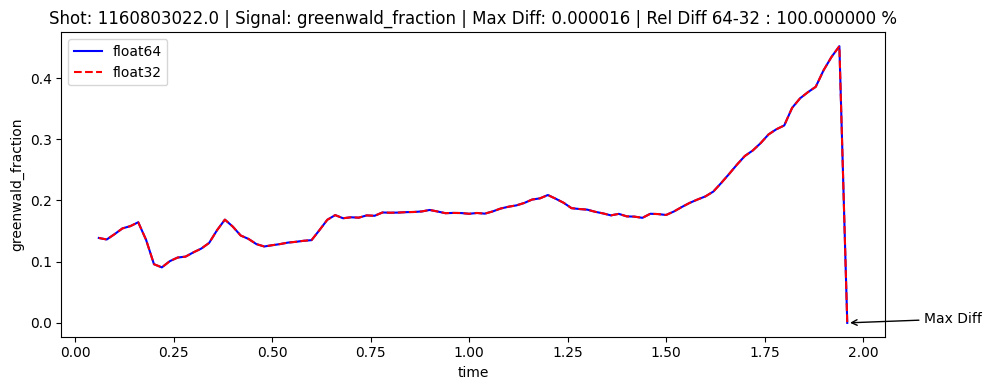

Max Uncertainty at time 1.9399999380111692 for shot 1160803022.0 with values: float32=0.00040100521294135244, float64=0.0, relative=0.003692 %


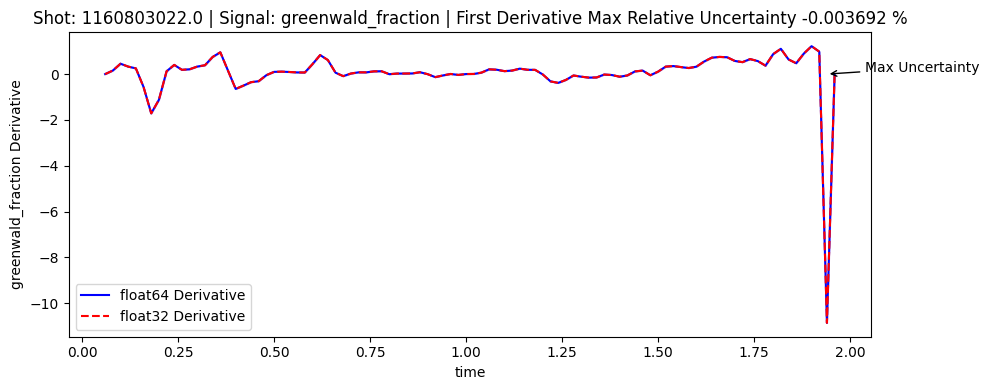

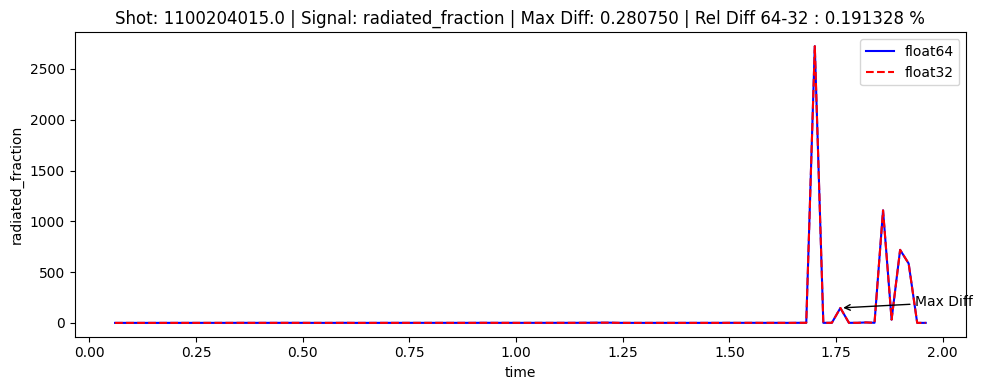

Max Uncertainty at time 1.7399998903274536 for shot 1100204015.0 with values: float32=7.018754381669347, float64=0.0, relative=-0.192055 %


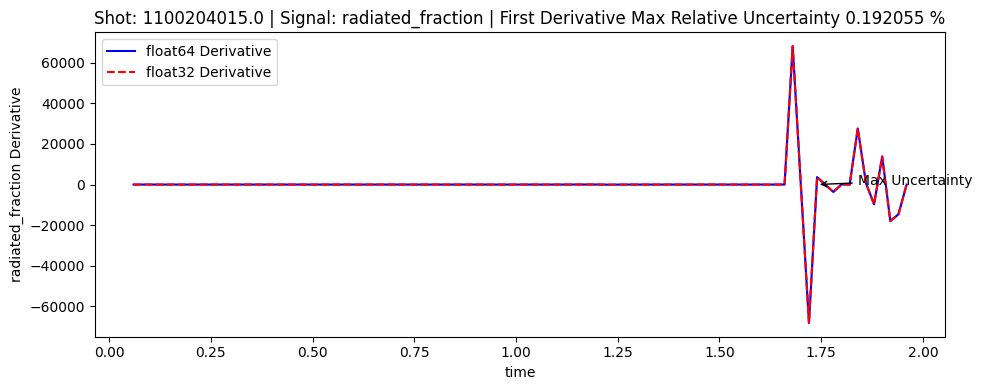

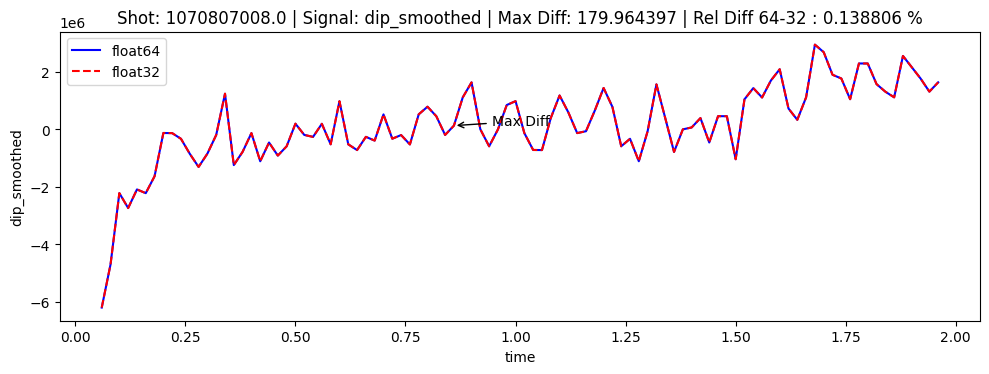

Max Uncertainty at time 0.8399999737739563 for shot 1070807008.0 with values: float32=4663.248350612246, float64=0.0, relative=0.056988 %


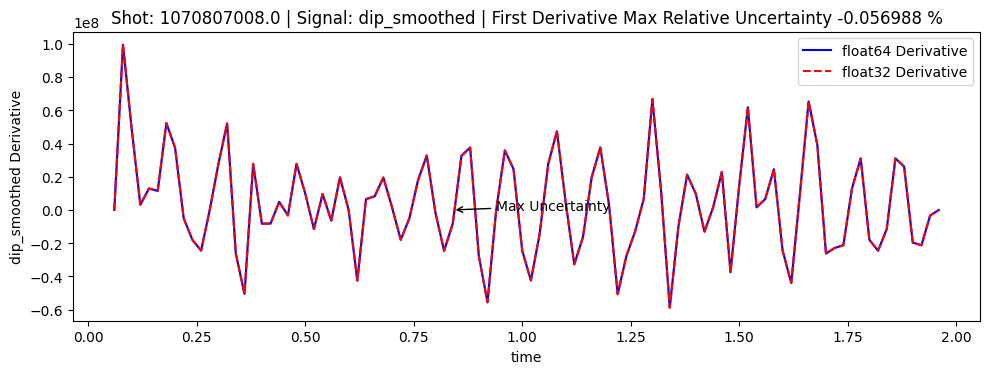

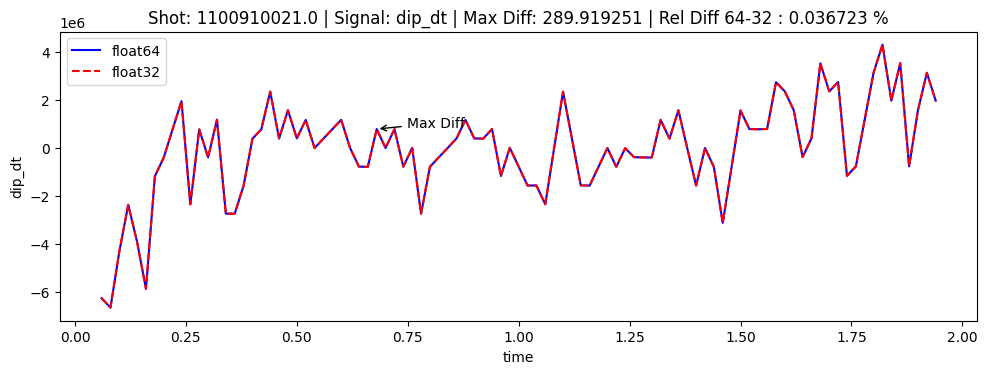

Max Uncertainty at time 0.699999988079071 for shot 1100910021.0 with values: float32=8257.449876147642, float64=0.0, relative=14.361079 %


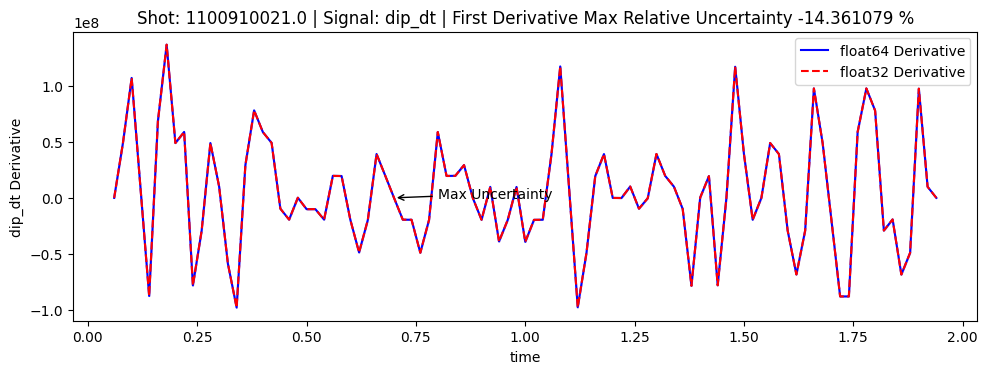

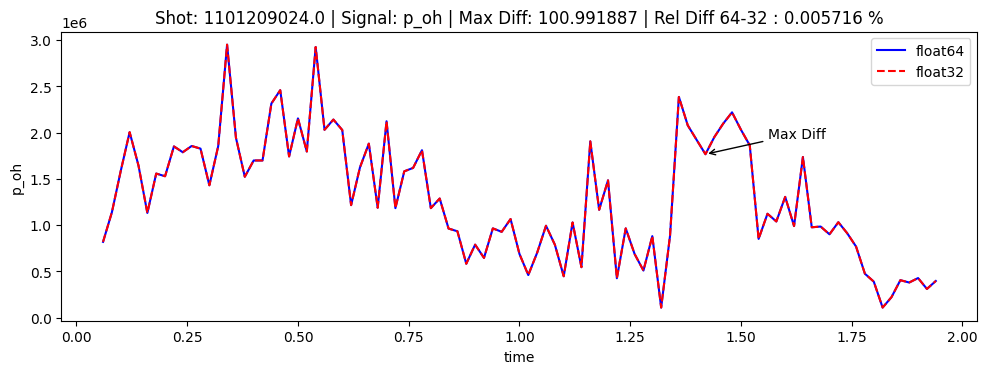

Max Uncertainty at time 1.3999998569488523 for shot 1101209024.0 with values: float32=2524.966190652125, float64=0.0, relative=0.032338 %


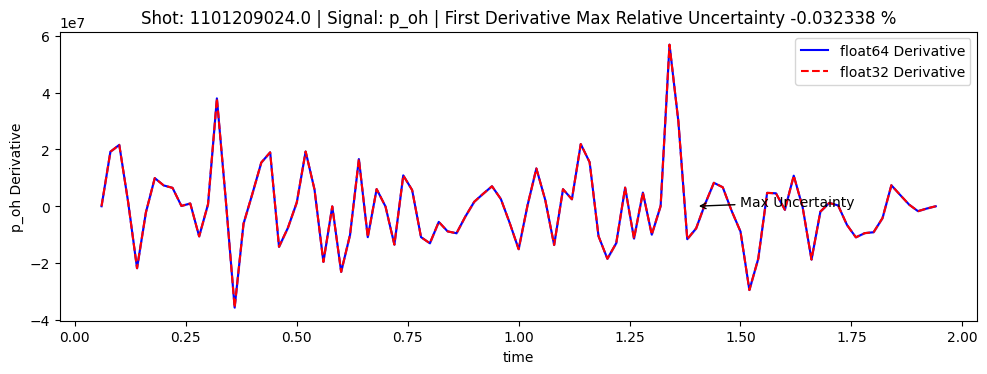

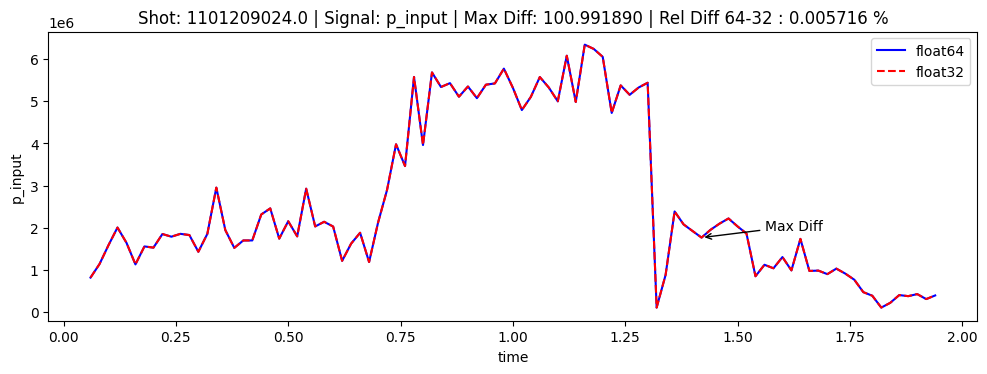

Max Uncertainty at time 1.3999998569488523 for shot 1101209024.0 with values: float32=2524.966261762959, float64=0.0, relative=0.032338 %


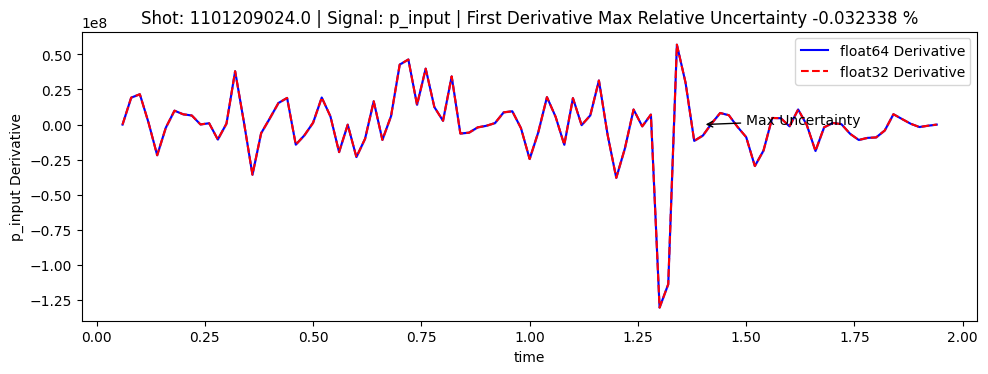

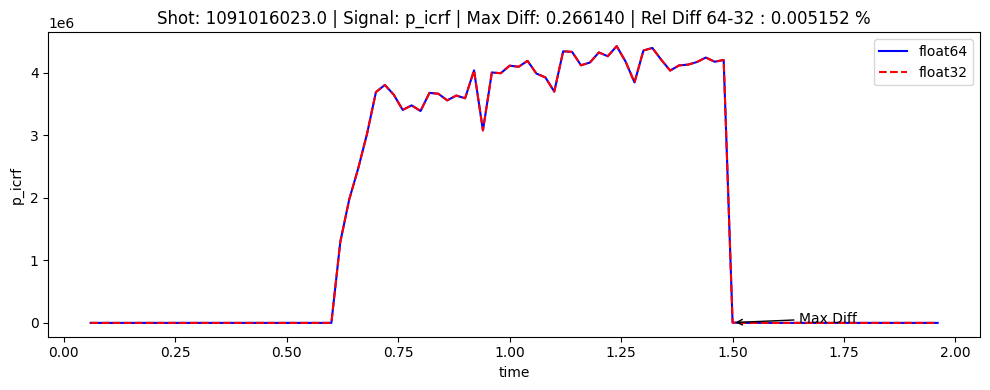

Max Uncertainty at time 1.4799998998641968 for shot 1091016023.0 with values: float32=7.107543136260096, float64=0.0, relative=0.000007 %


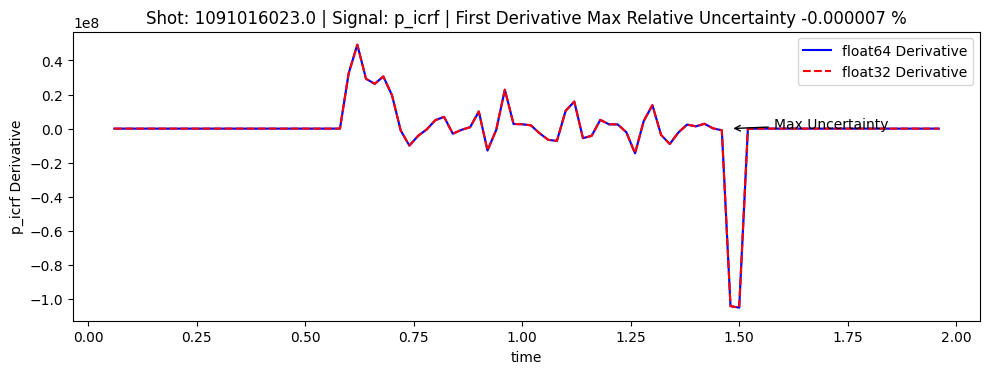

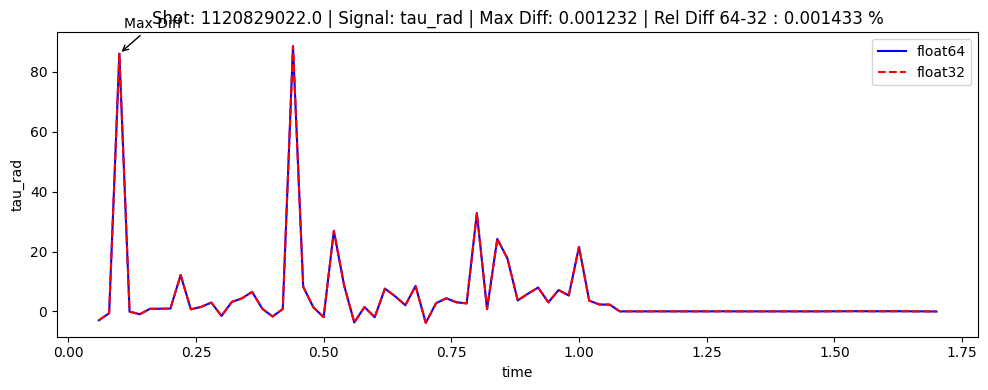

Max Uncertainty at time 0.0799999982118606 for shot 1120829022.0 with values: float32=0.030798324120468495, float64=0.0, relative=-0.001386 %


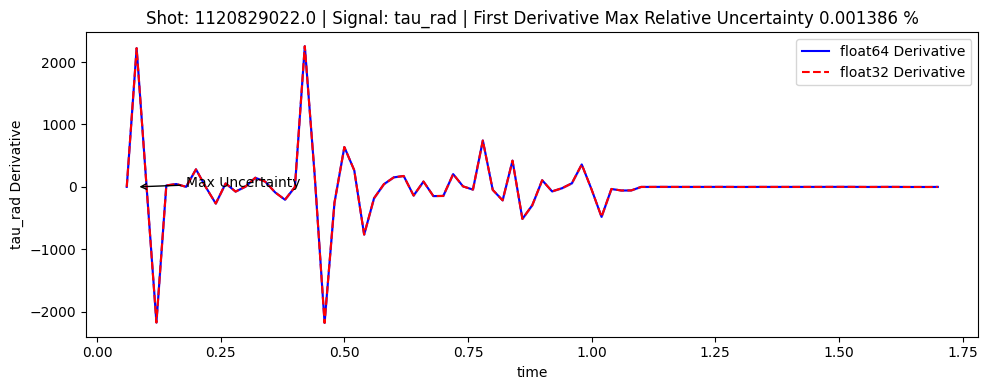

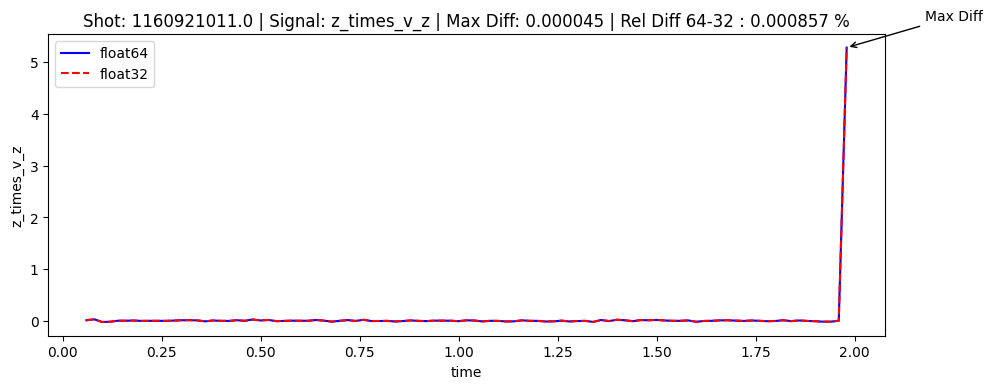

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=0.0011319506614784576, float64=0.0, relative=-0.000855 %


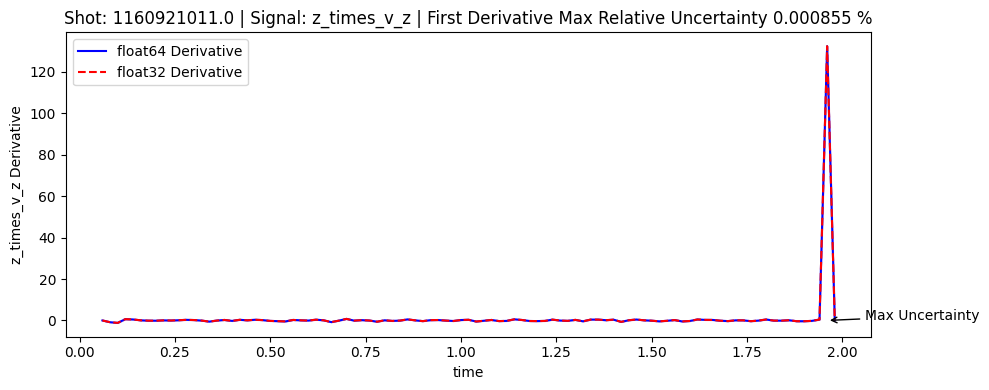

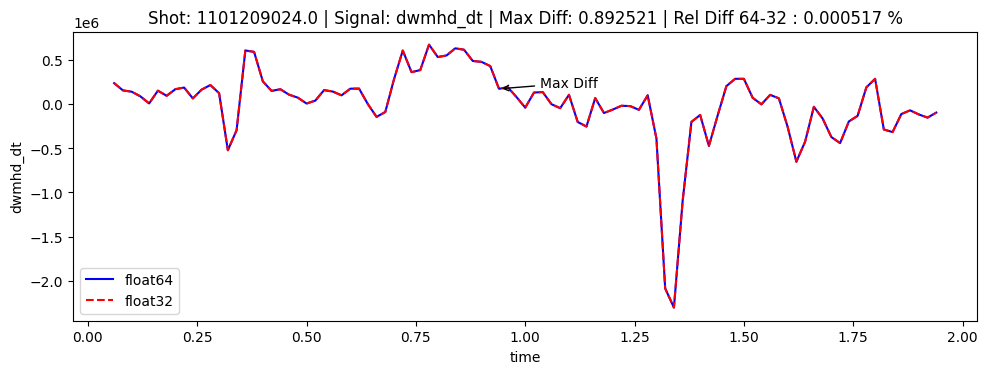

Max Uncertainty at time 0.959999978542328 for shot 1101209024.0 with values: float32=22.81593002719549, float64=0.0, relative=0.000980 %


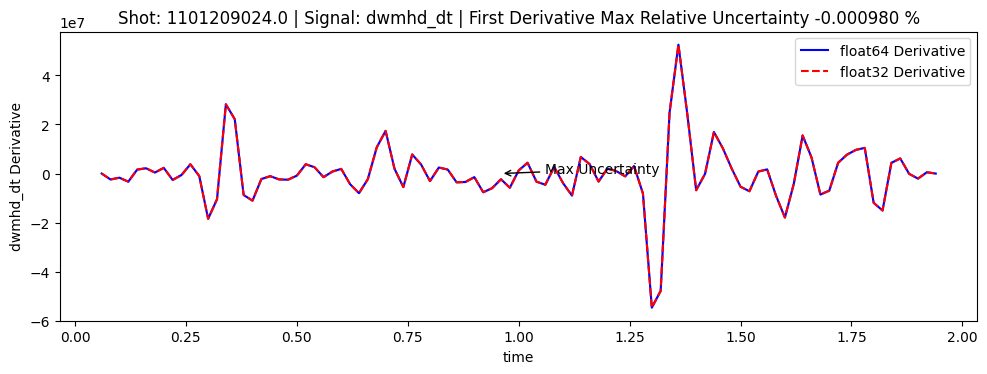

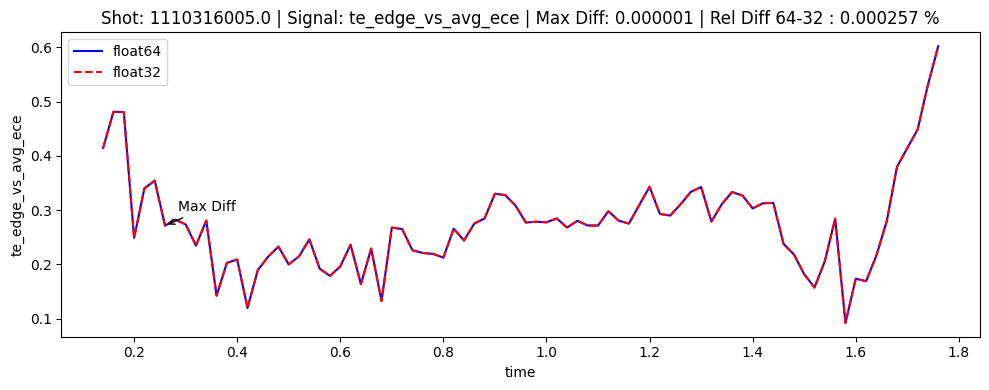

Max Uncertainty at time 0.2399999946355819 for shot 1110316005.0 with values: float32=1.7650283181729892e-05, float64=0.0, relative=0.001029 %


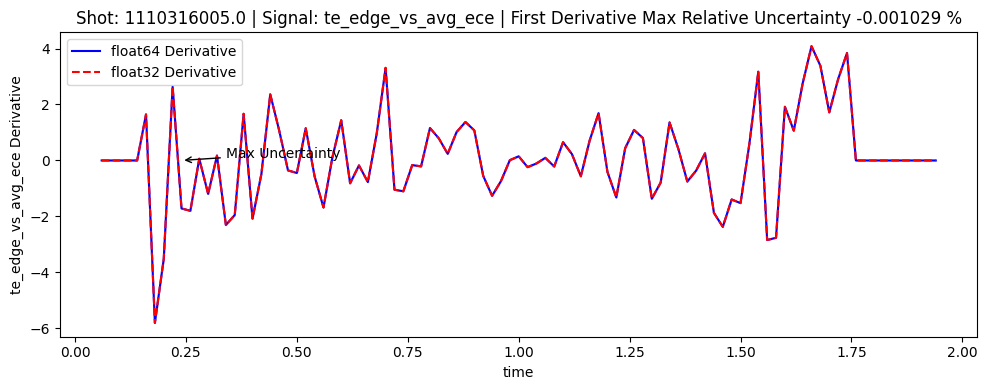

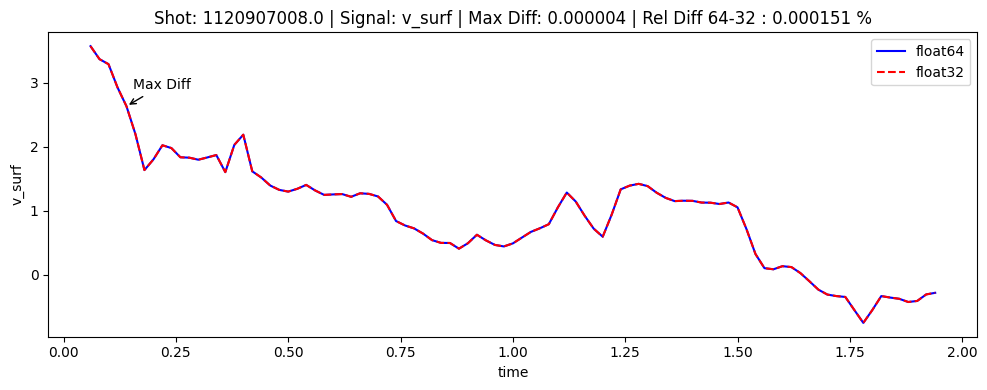

Max Uncertainty at time 0.1599999964237213 for shot 1120907008.0 with values: float32=0.00011224770667252698, float64=0.0, relative=0.000450 %


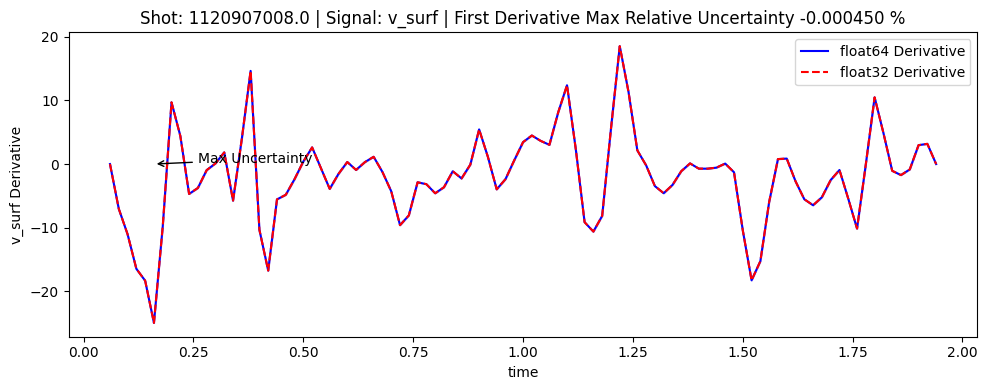

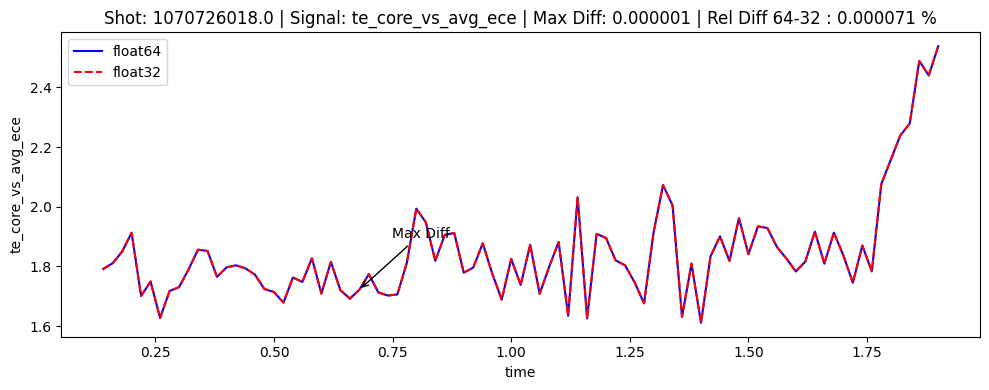

Max Uncertainty at time 0.699999988079071 for shot 1070726018.0 with values: float32=3.077769040111997e-05, float64=0.0, relative=0.013773 %


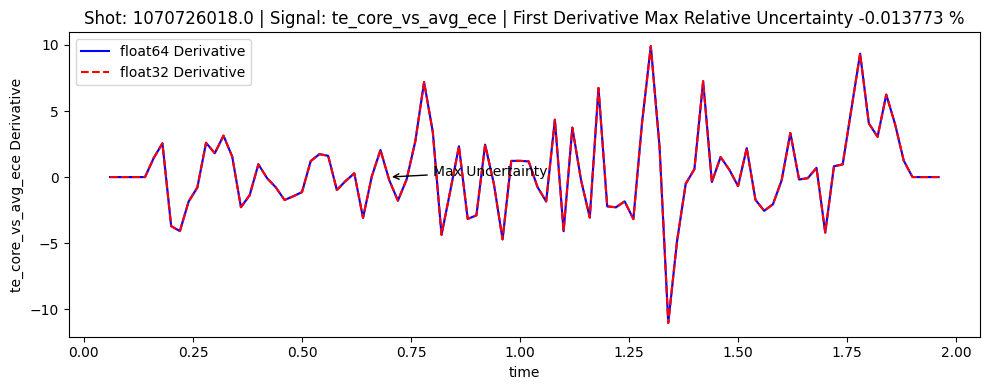

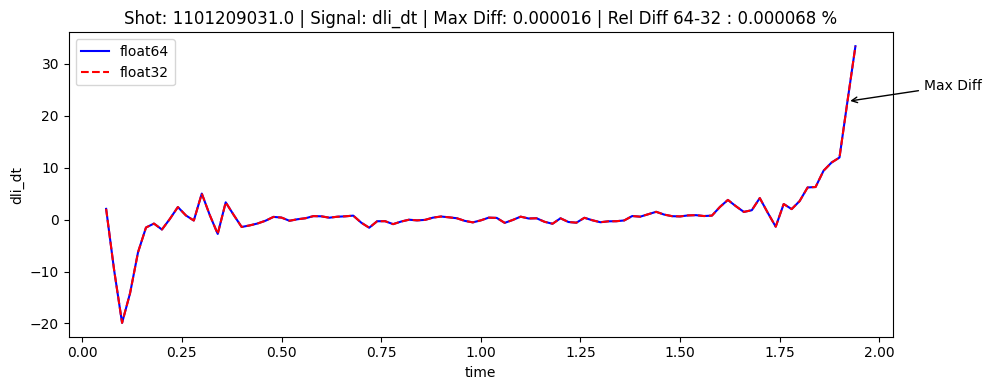

Max Uncertainty at time 1.8999998569488523 for shot 1101209031.0 with values: float32=0.0003902284902805426, float64=0.0, relative=-0.000132 %


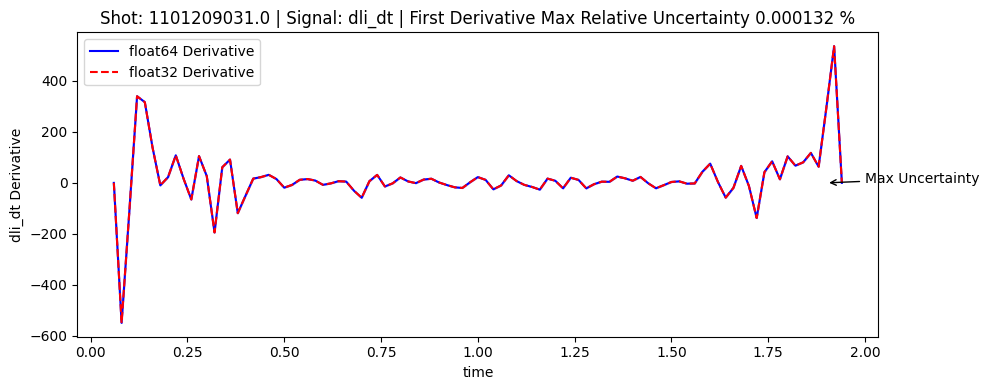

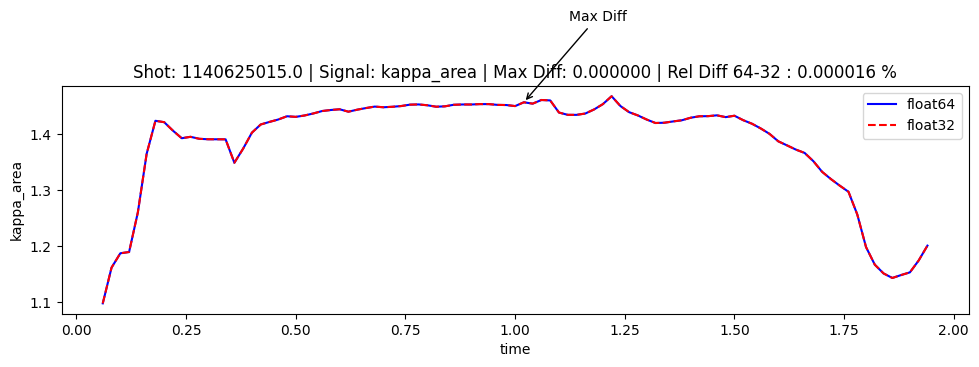

Max Uncertainty at time 1.0399999618530271 for shot 1140625015.0 with values: float32=5.987235275431183e-06, float64=0.0, relative=-0.005827 %


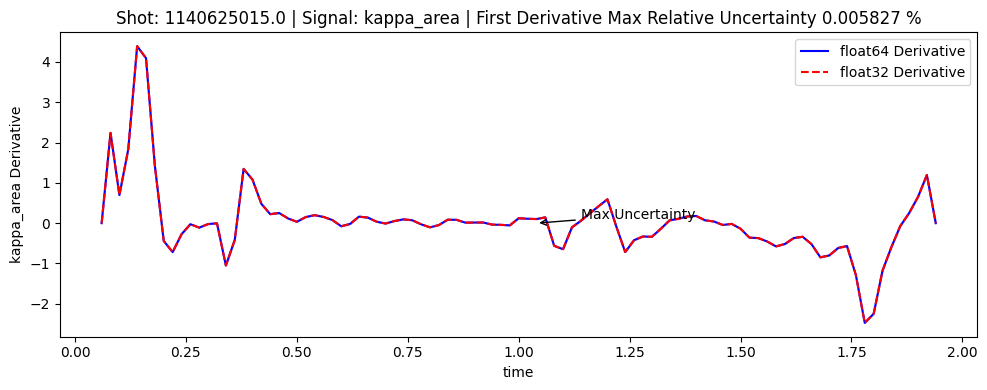

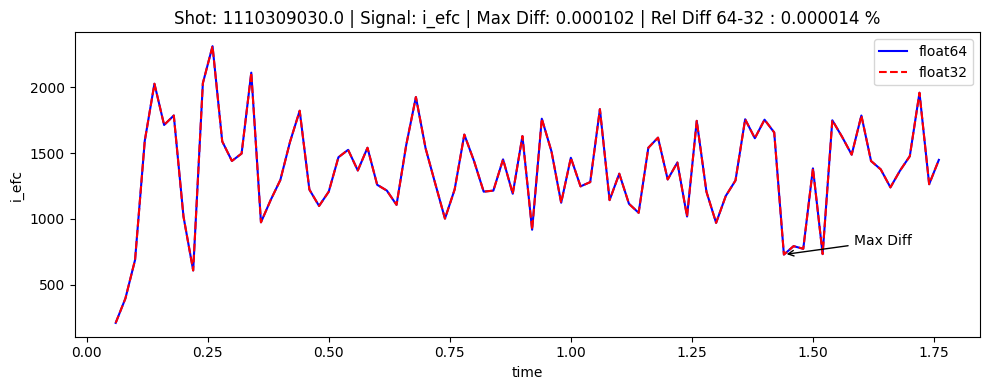

Max Uncertainty at time 1.459999918937683 for shot 1110309030.0 with values: float32=0.0025784871703914, float64=0.0, relative=-0.000236 %


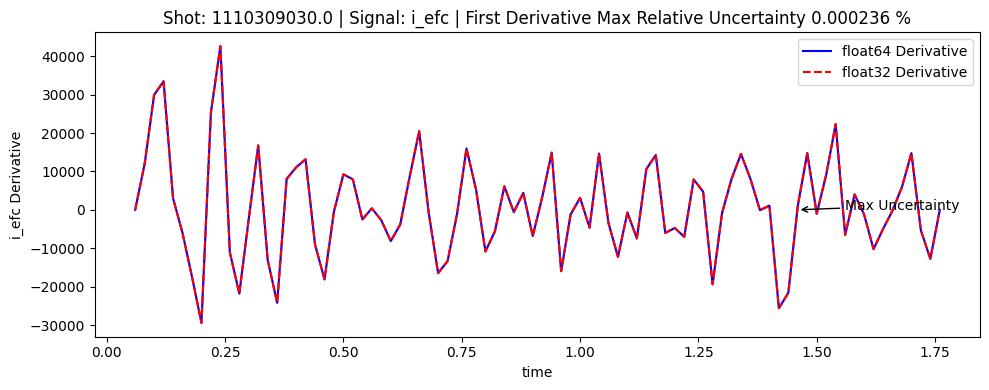

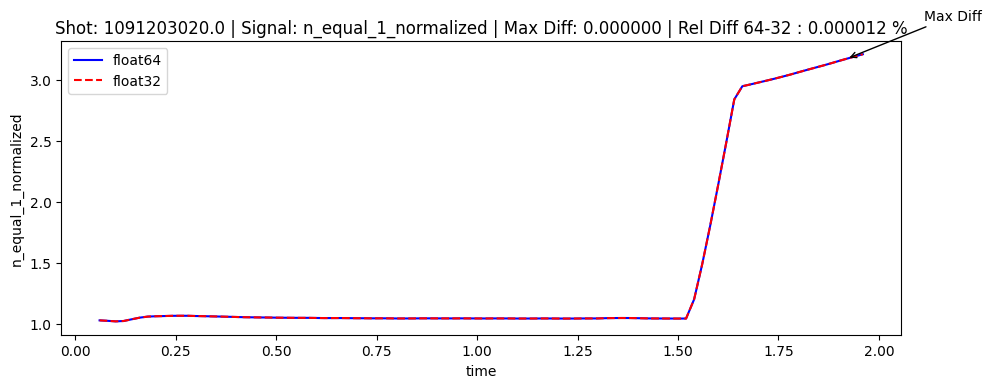

Max Uncertainty at time 1.9399999380111692 for shot 1091203020.0 with values: float32=1.1071173375332751e-05, float64=0.0, relative=-0.001205 %


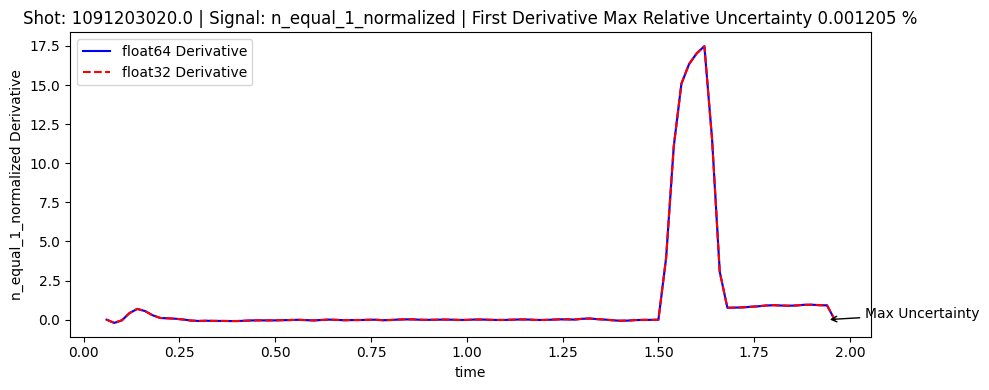

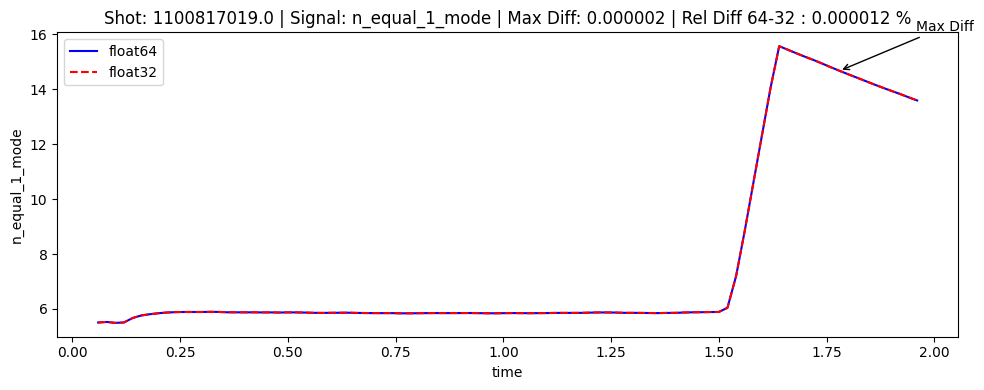

Max Uncertainty at time 1.7999999523162842 for shot 1100817019.0 with values: float32=5.527133709281524e-05, float64=0.0, relative=0.000892 %


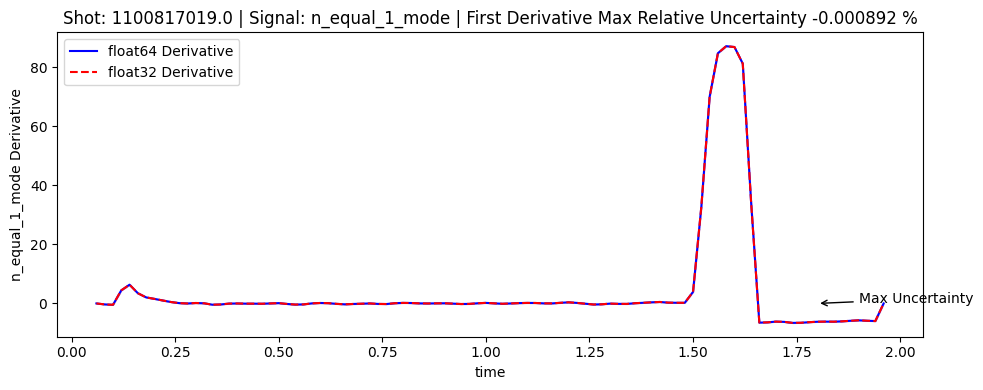

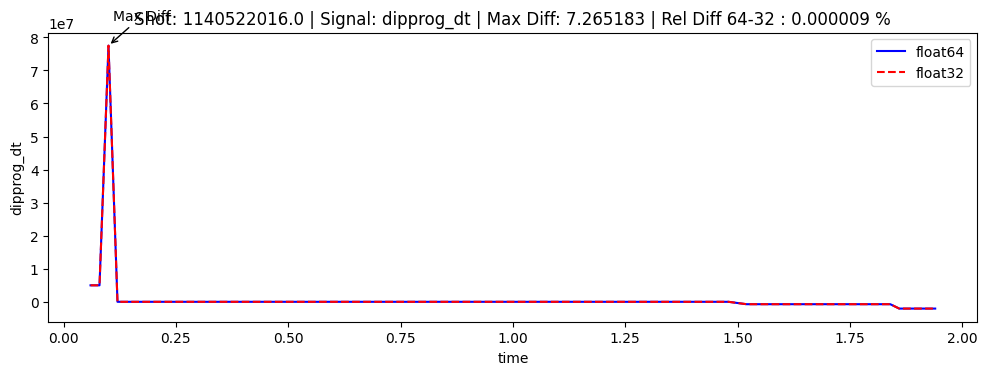

Max Uncertainty at time 0.0799999982118606 for shot 1140522016.0 with values: float32=181.71050481602146, float64=0.0, relative=-0.000010 %


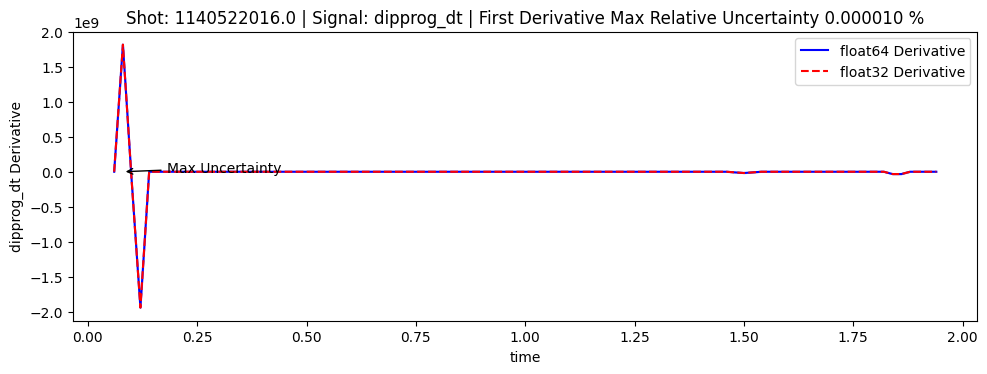

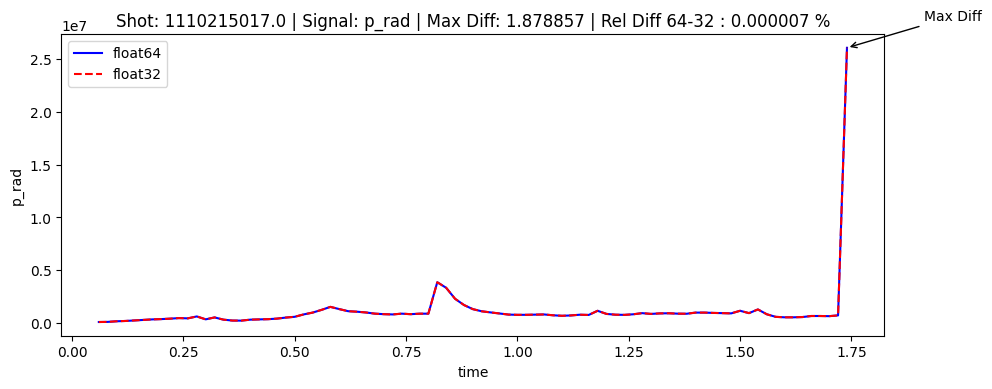

Max Uncertainty at time 1.71999990940094 for shot 1110215017.0 with values: float32=46.97178180636324, float64=0.0, relative=-0.000007 %


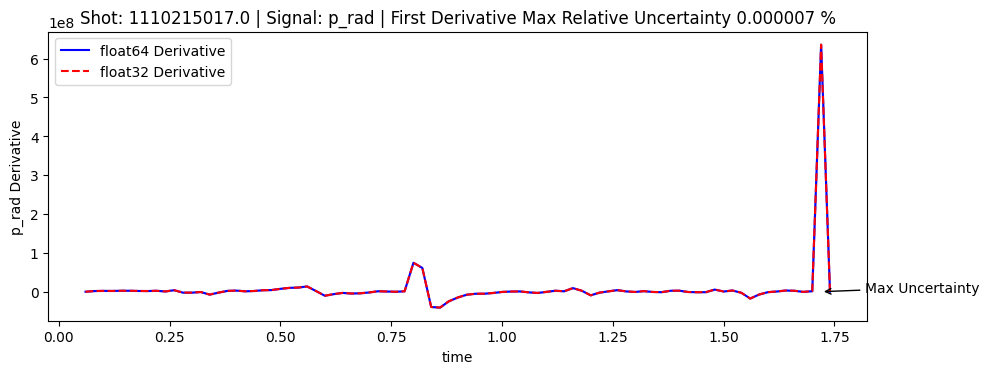

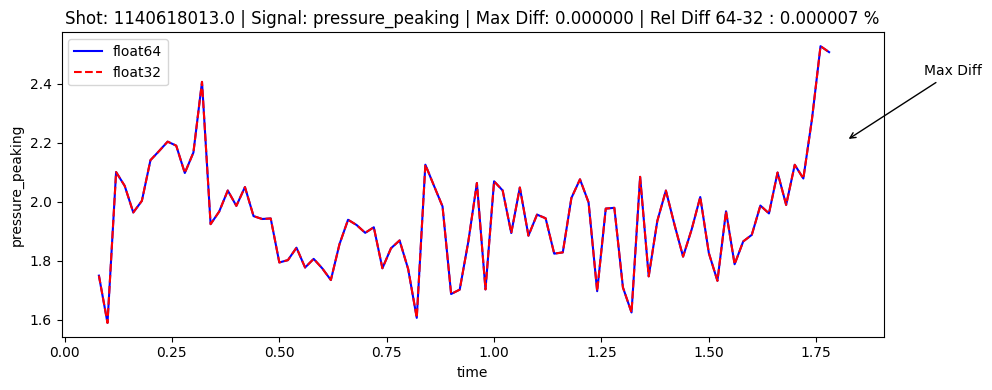

Max Uncertainty at time 1.7999999523162842 for shot 1140618013.0 with values: float32=3.963310826896903e-06, float64=0.0, relative=0.000053 %


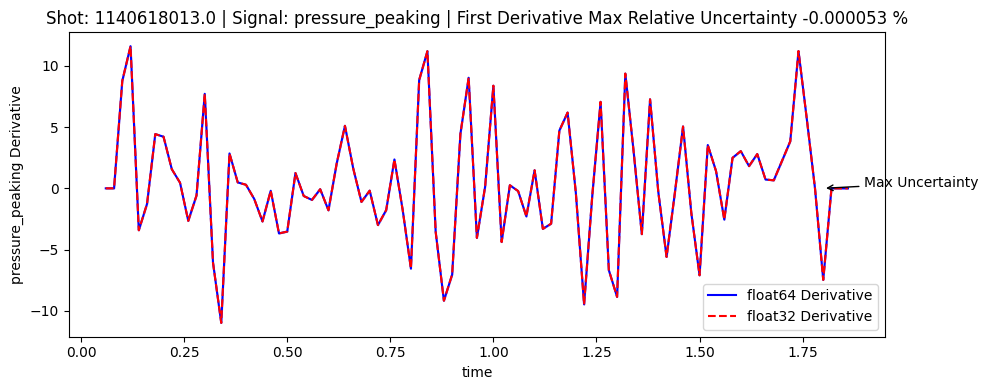

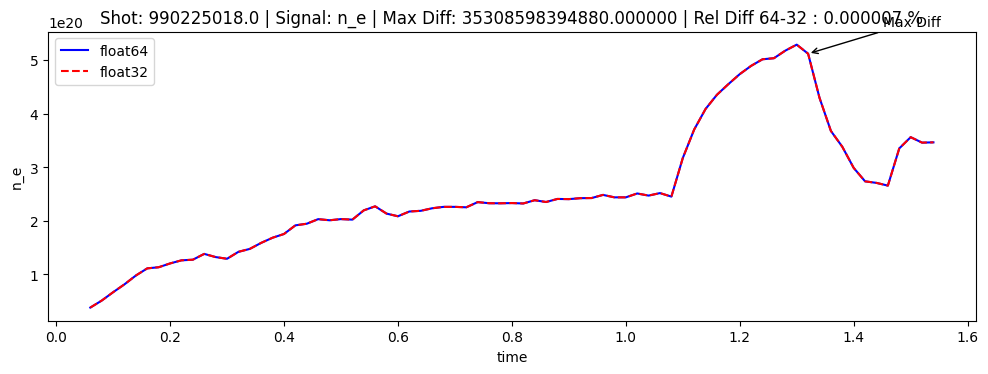

Max Uncertainty at time 1.3399999141693115 for shot 990225018.0 with values: float32=1146949119772107.0, float64=0.0, relative=0.000032 %


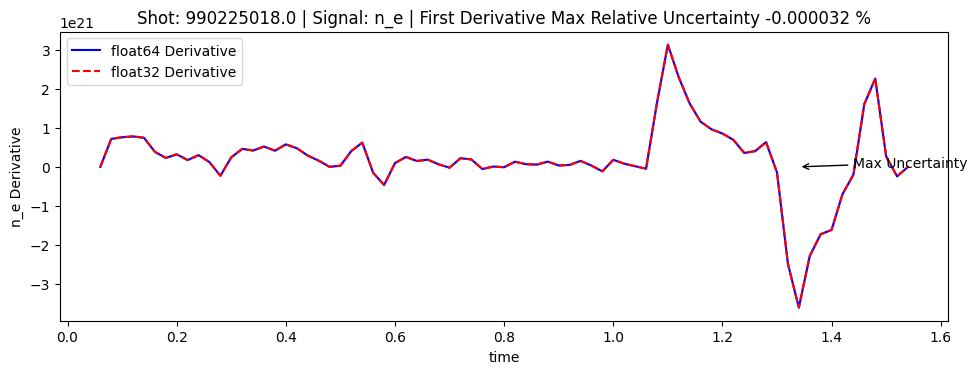

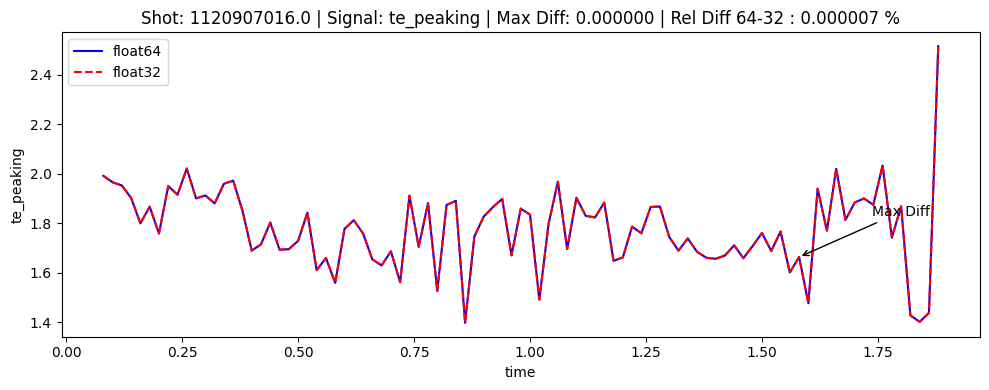

Max Uncertainty at time 1.559999942779541 for shot 1120907016.0 with values: float32=2.851581547021958e-06, float64=0.0, relative=0.000111 %


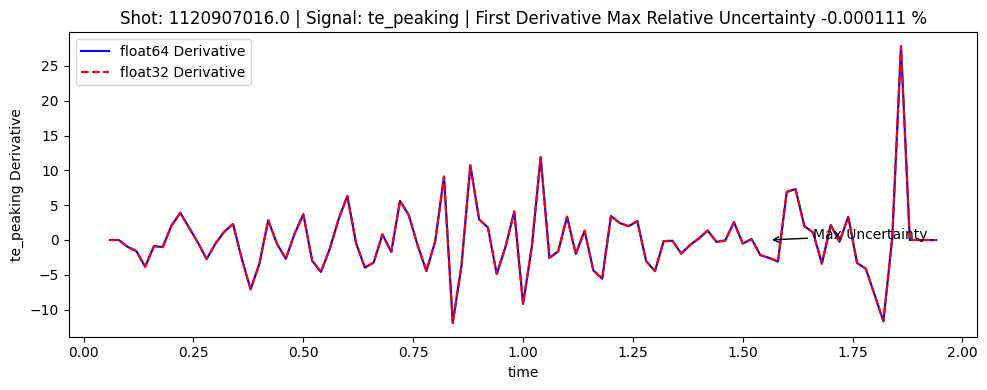

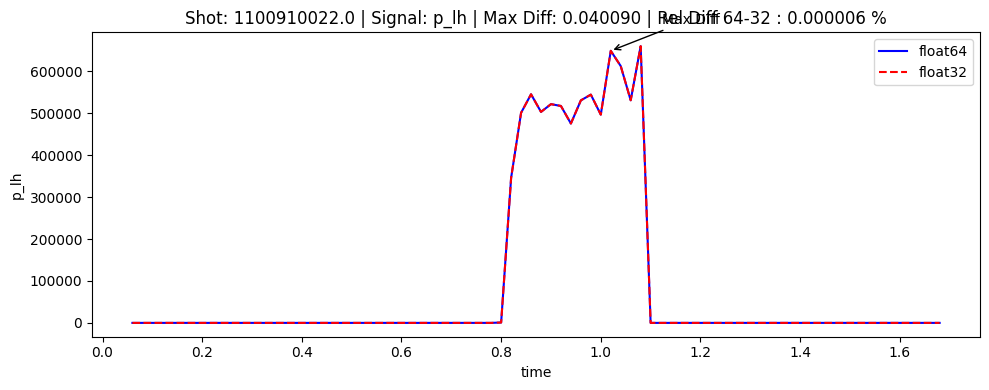

Max Uncertainty at time 1.0 for shot 1100910022.0 with values: float32=1.1015938038687, float64=0.0, relative=-0.000042 %


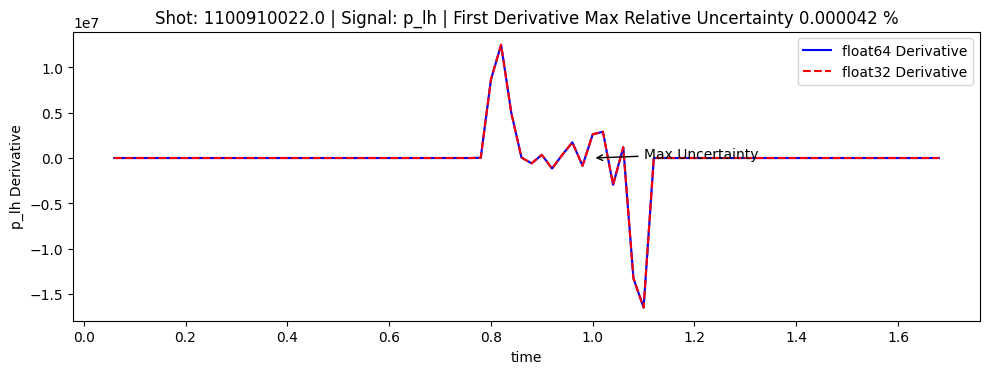

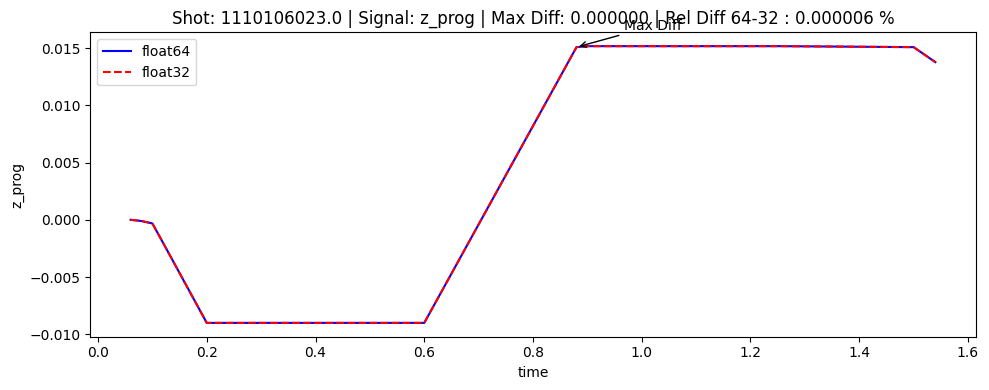

Max Uncertainty at time 0.85999995470047 for shot 1110106023.0 with values: float32=3.05830298875084e-08, float64=0.0, relative=-0.000036 %


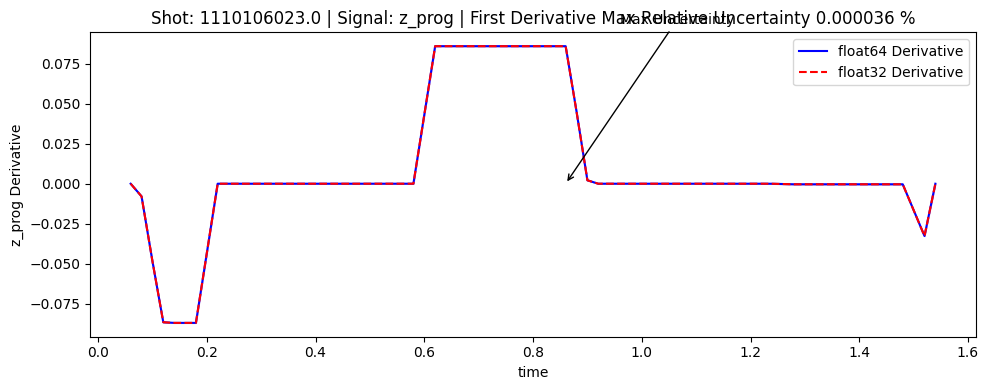

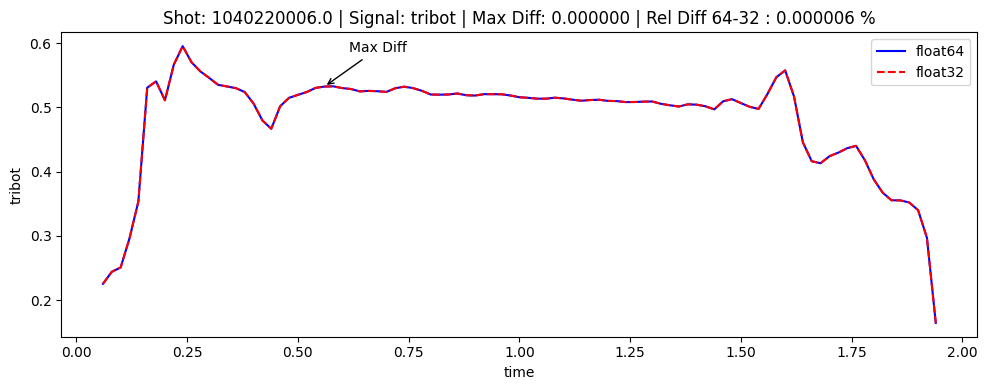

Max Uncertainty at time 0.2000000029802322 for shot 1040220006.0 with values: float32=9.797934969734448e-07, float64=0.0, relative=-0.000151 %


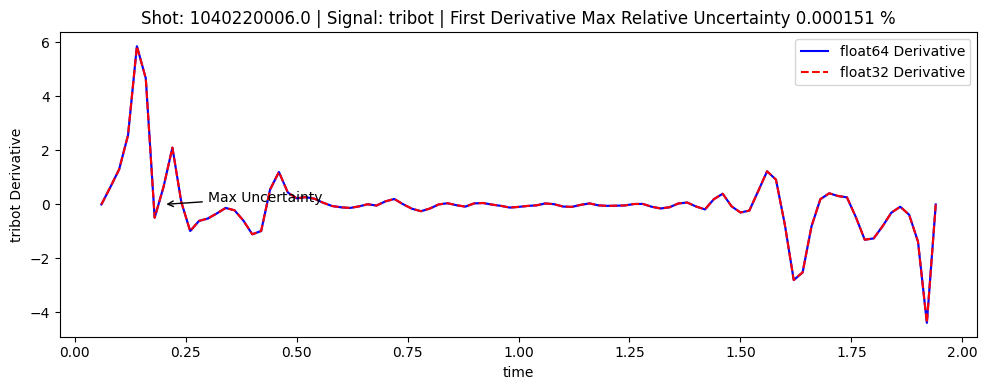

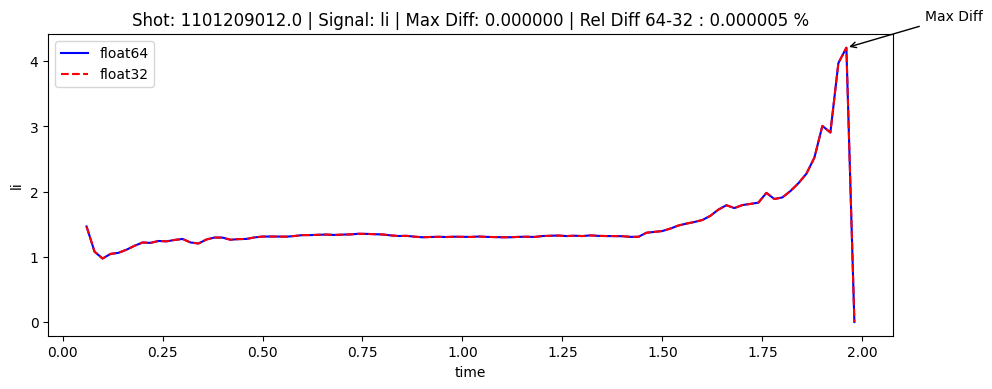

Max Uncertainty at time 1.9399999380111692 for shot 1101209012.0 with values: float32=5.359620712058071e-06, float64=0.0, relative=-0.000016 %


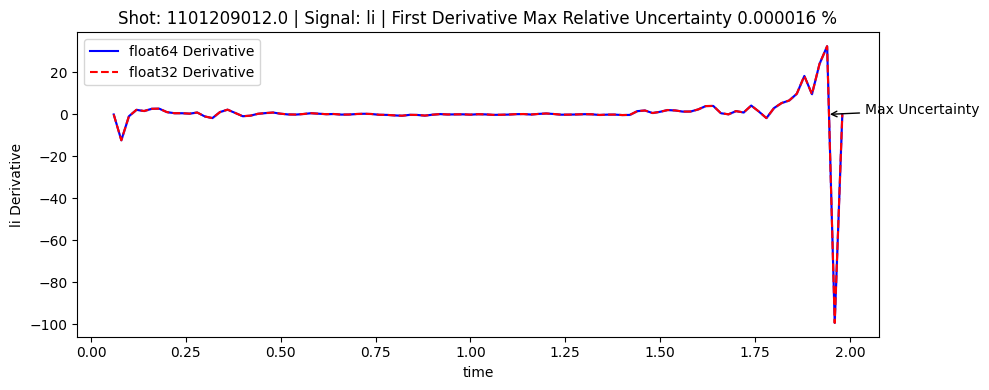

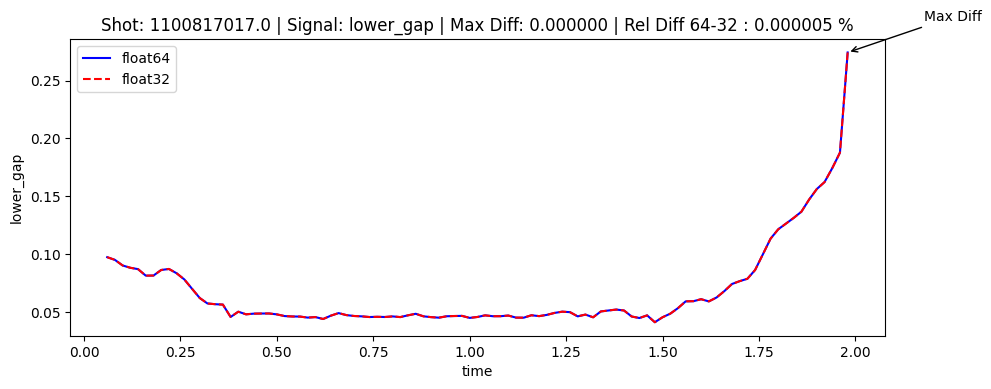

Max Uncertainty at time 1.959999918937683 for shot 1100817017.0 with values: float32=3.568965526601766e-07, float64=0.0, relative=-0.000014 %


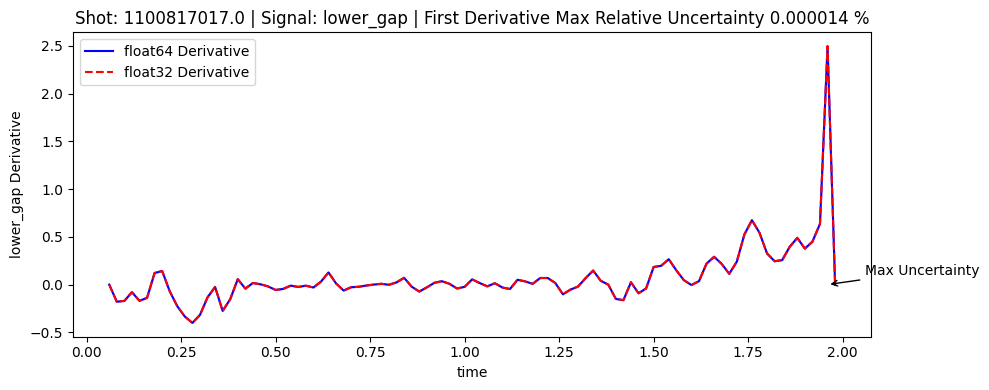

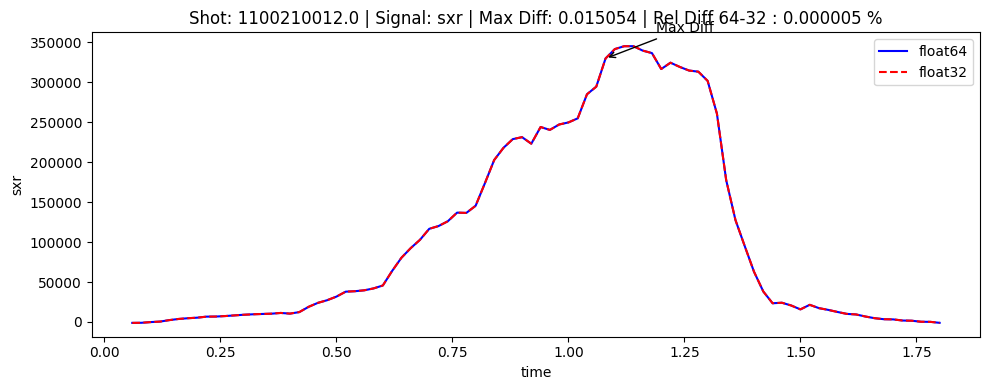

Max Uncertainty at time 1.1799999475479126 for shot 1100210012.0 with values: float32=0.4616298130250232, float64=0.0, relative=0.000080 %


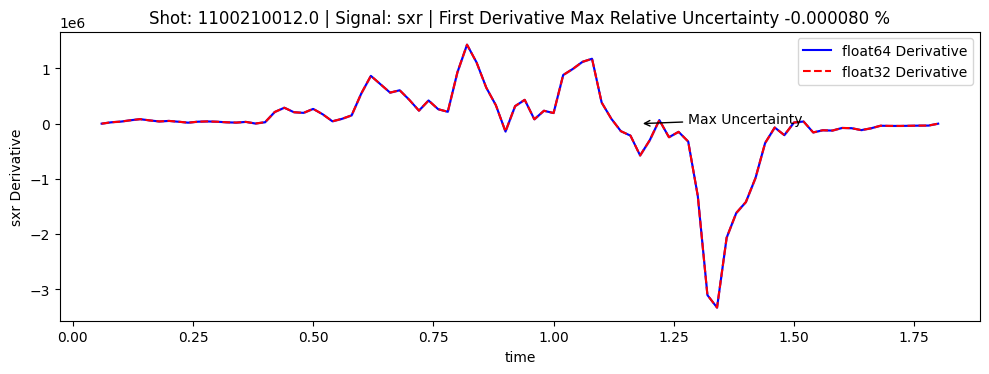

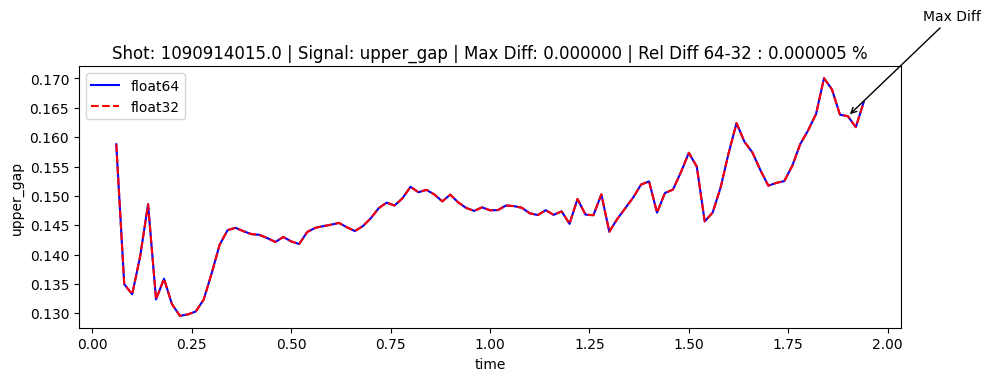

Max Uncertainty at time 1.079999923706055 for shot 1090914015.0 with values: float32=2.1696829020037624e-07, float64=0.0, relative=0.000707 %


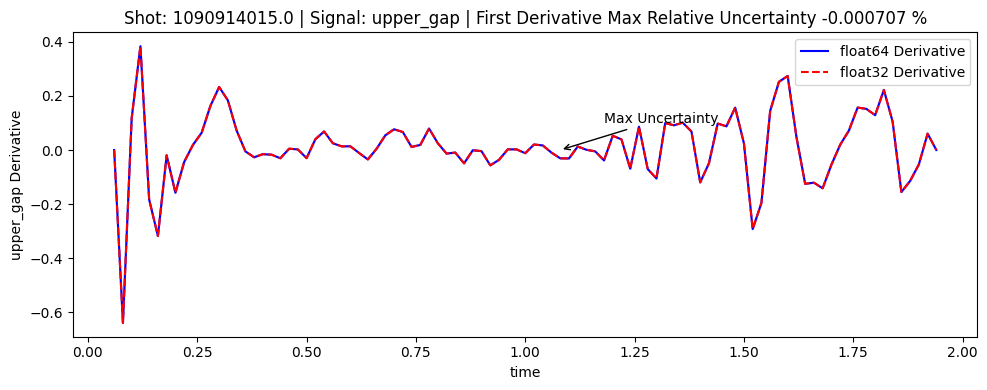

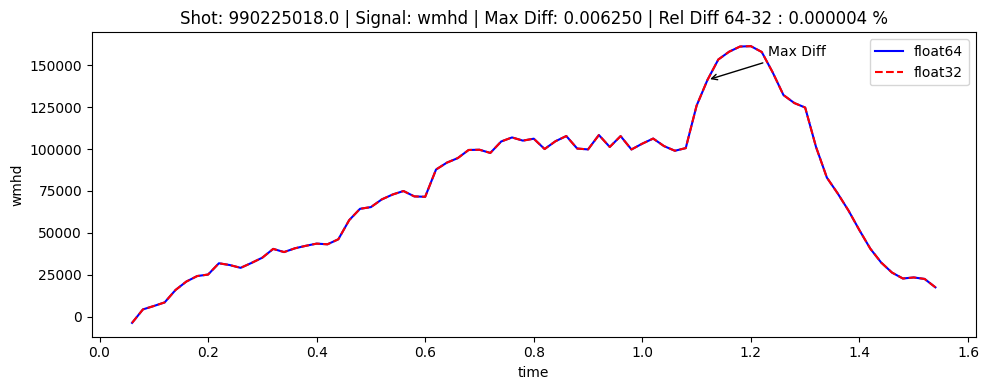

Max Uncertainty at time 1.0999999046325684 for shot 990225018.0 with values: float32=0.1783237984305146, float64=0.0, relative=-0.000018 %


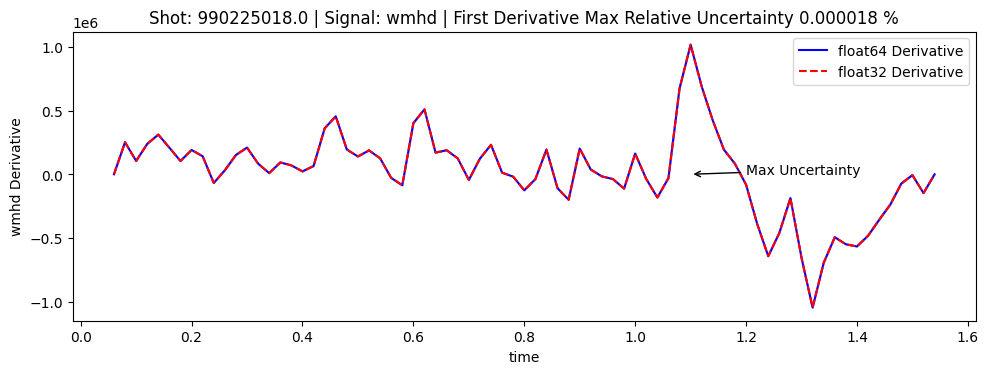

/tmp/ipykernel_833284/660870611.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


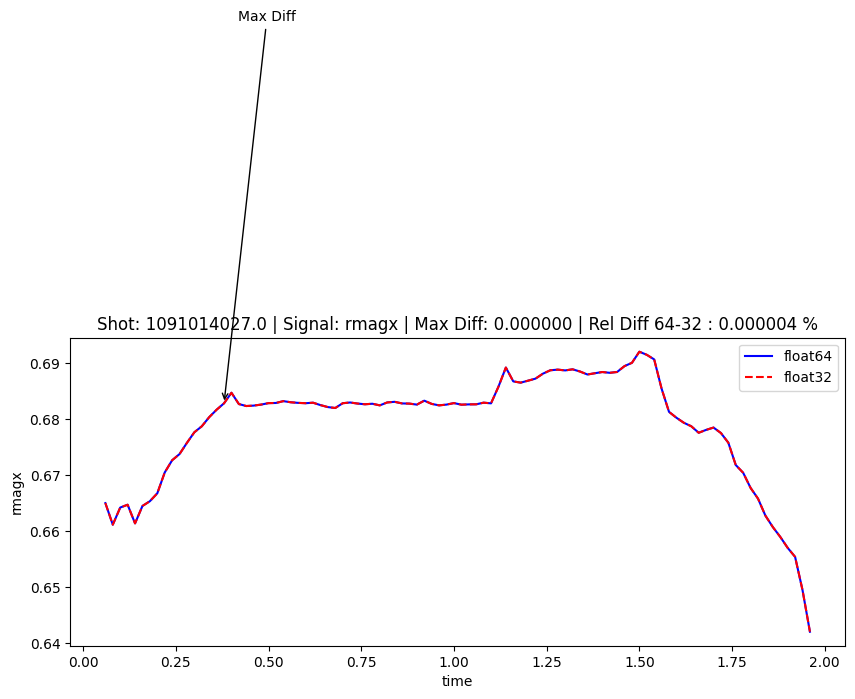

Max Uncertainty at time 1.0399999618530271 for shot 1091014027.0 with values: float32=1.0134119376591692e-06, float64=0.0, relative=-0.063738 %


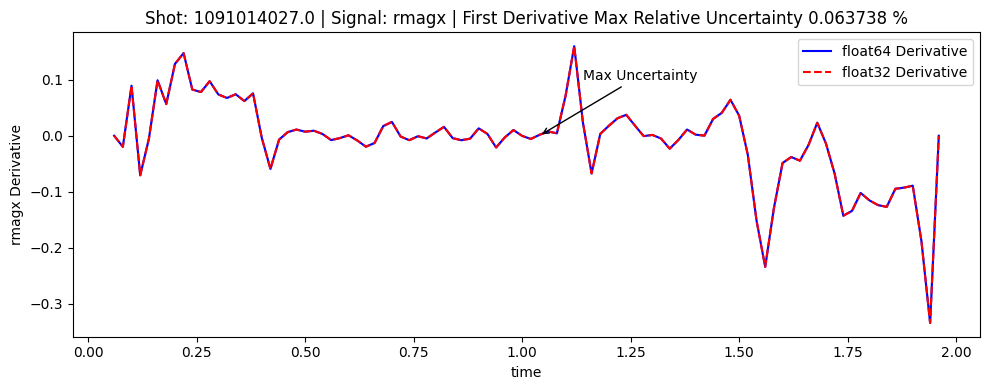

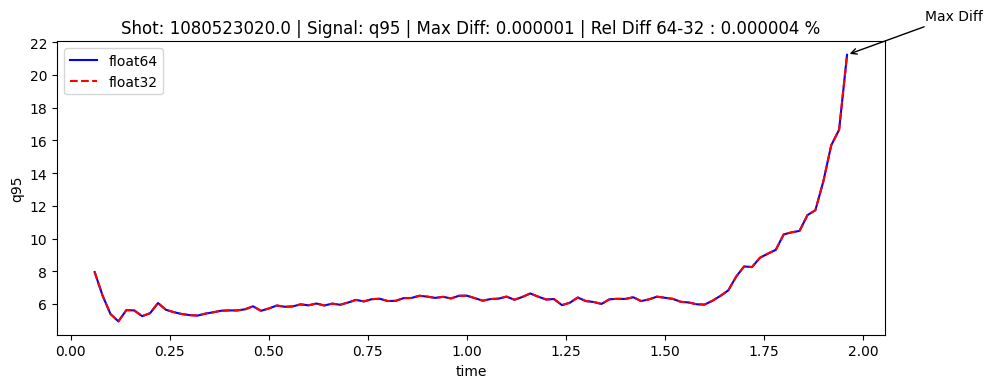

Max Uncertainty at time 1.9399999380111692 for shot 1080523020.0 with values: float32=2.2783018826538275e-05, float64=0.0, relative=-0.000016 %


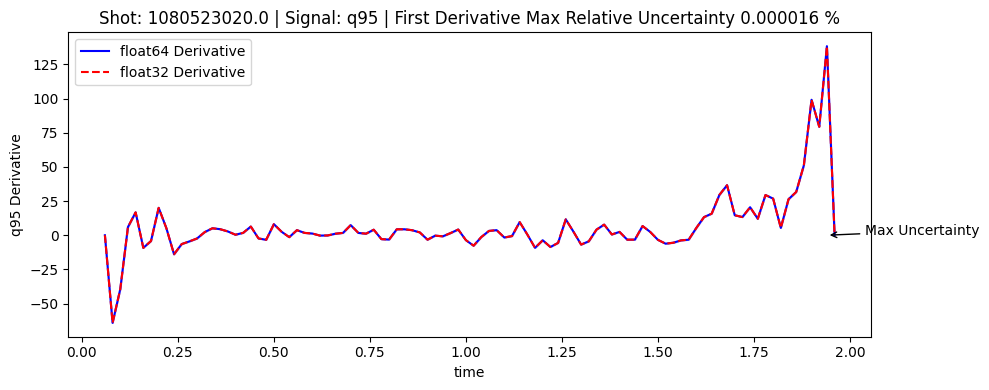

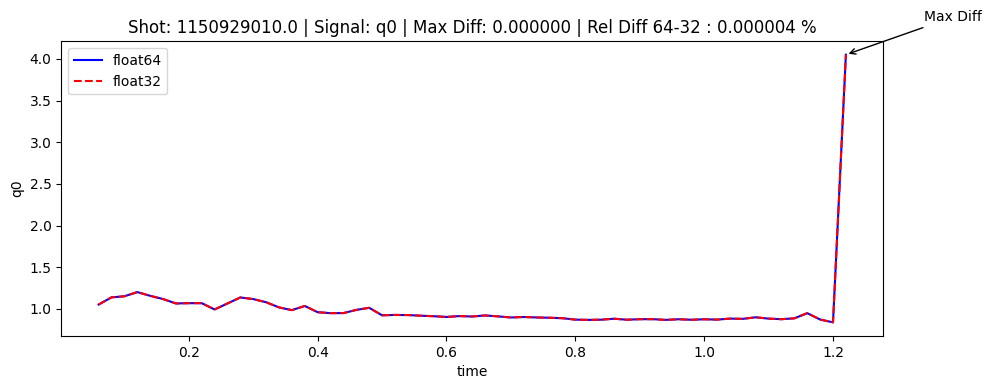

Max Uncertainty at time 1.1999999284744265 for shot 1150929010.0 with values: float32=4.27632595568823e-06, float64=0.0, relative=-0.000005 %


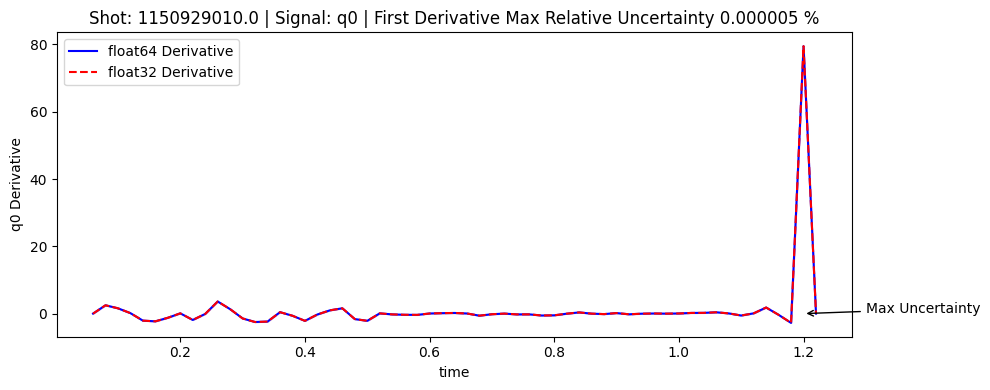

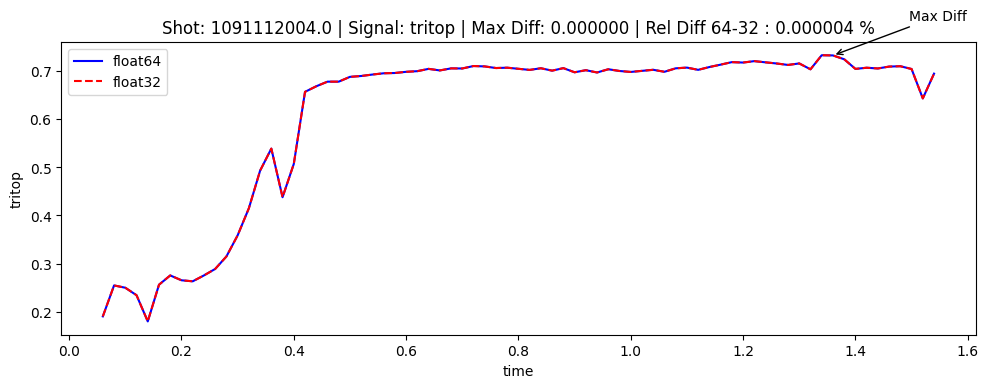

Max Uncertainty at time 0.5 for shot 1091112004.0 with values: float32=8.406039182611005e-07, float64=0.0, relative=-0.000287 %


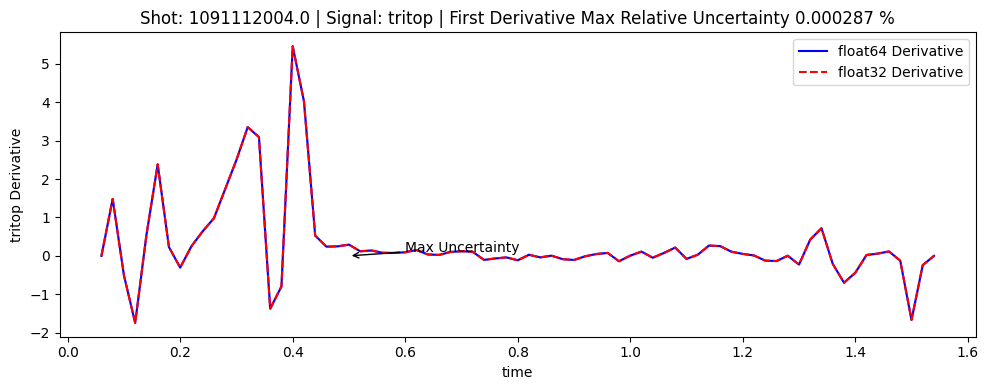

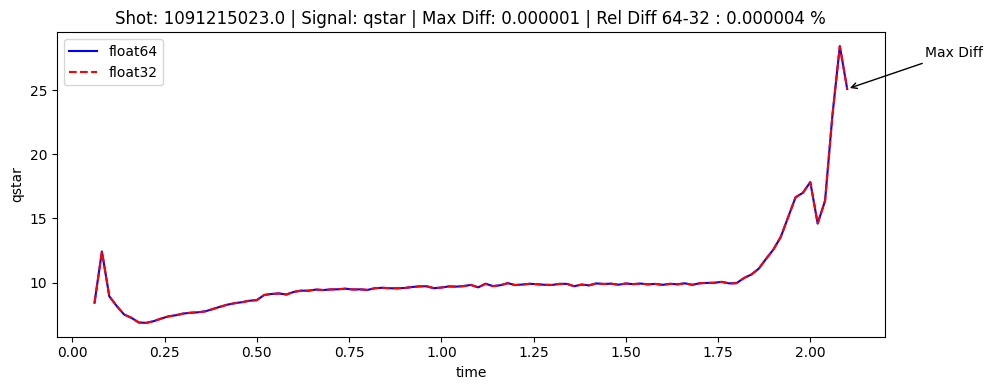

Max Uncertainty at time 2.0799999237060547 for shot 1091215023.0 with values: float32=2.546173592040539e-05, float64=0.0, relative=-0.000050 %


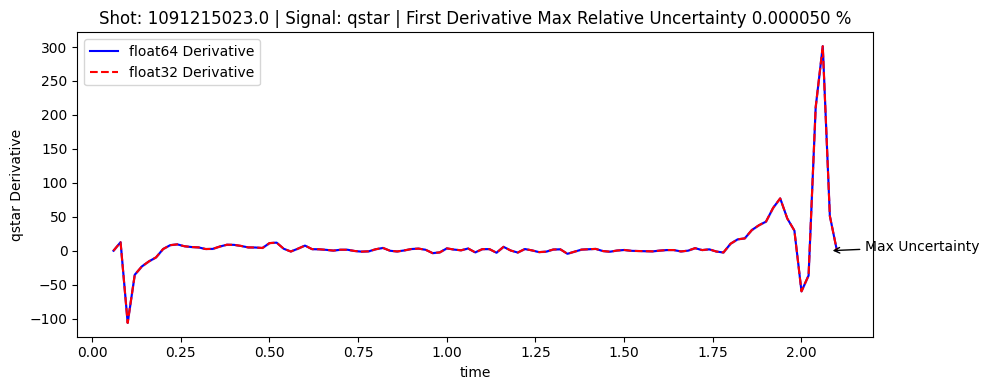

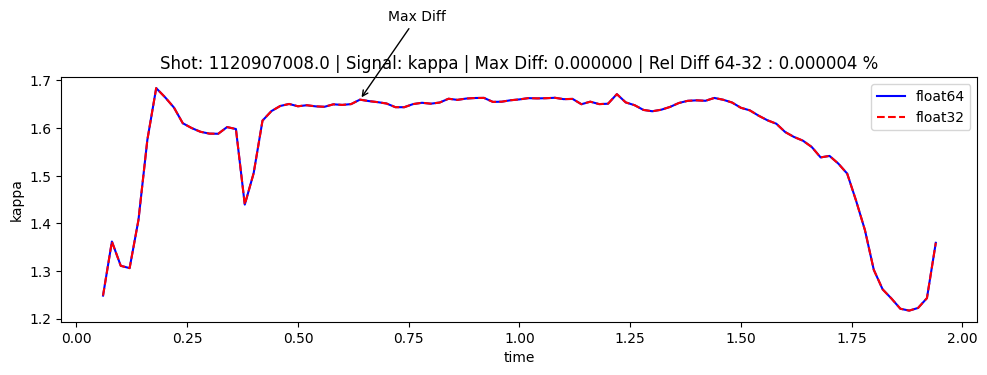

Max Uncertainty at time 0.6200000047683716 for shot 1120907008.0 with values: float32=1.891111128433758e-06, float64=0.0, relative=-0.000685 %


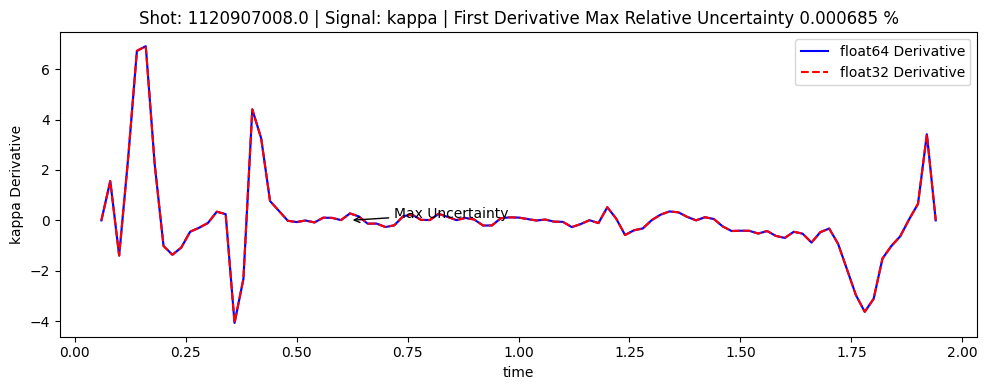

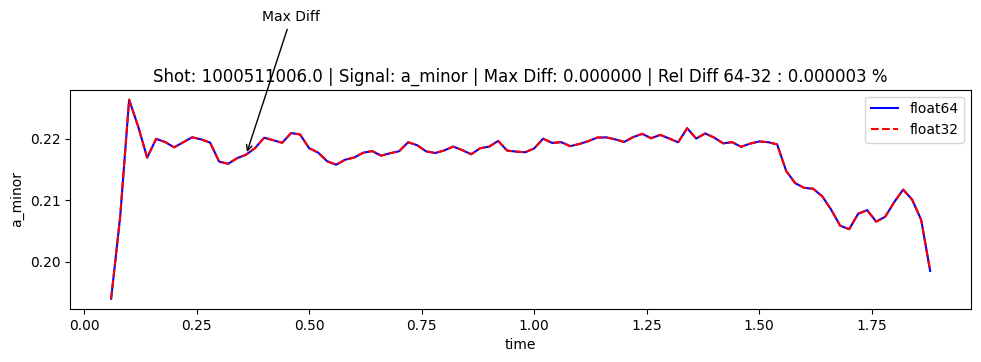

Max Uncertainty at time 0.3799999952316284 for shot 1000511006.0 with values: float32=2.1395464919432387e-07, float64=0.0, relative=-0.000310 %


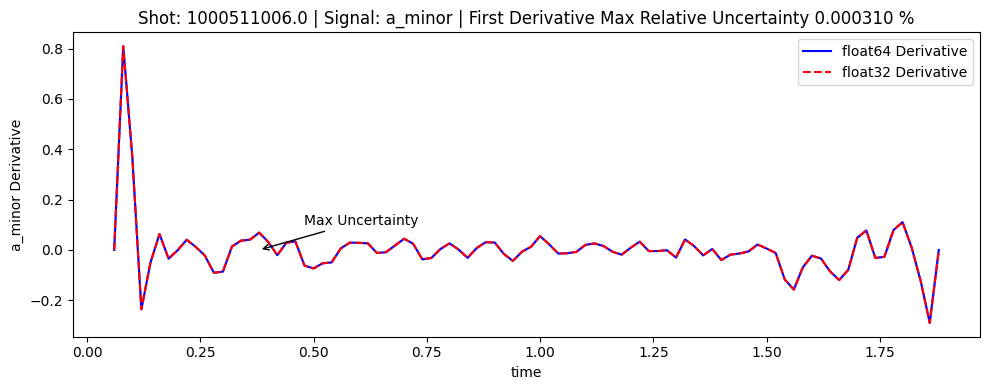

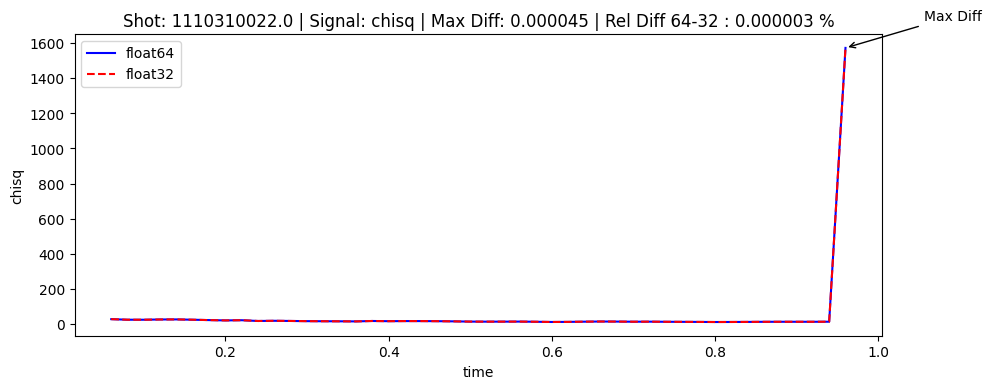

Max Uncertainty at time 0.9399999976158142 for shot 1110310022.0 with values: float32=0.0011181686067426174, float64=0.0, relative=-0.000003 %


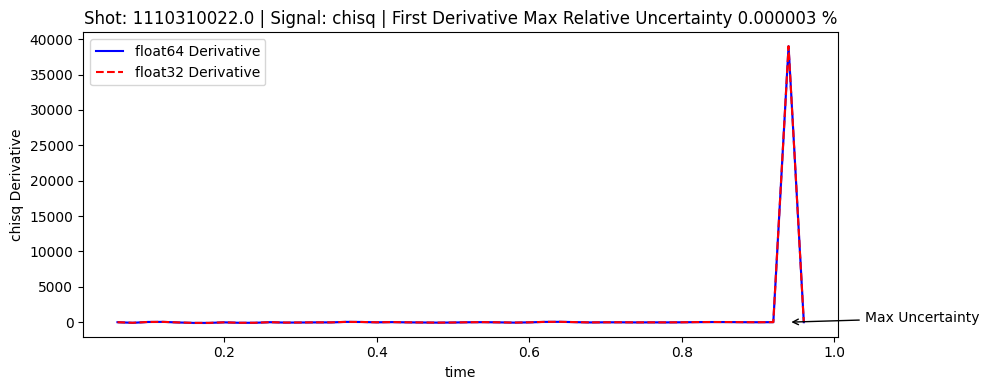

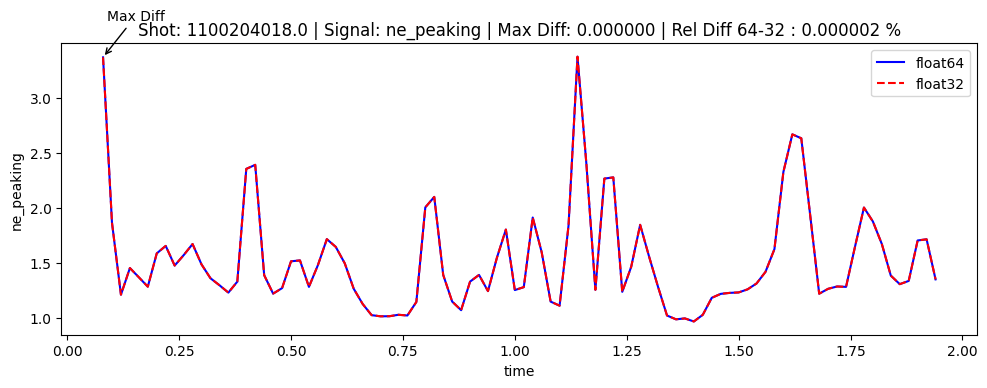

Max Uncertainty at time 0.0999999940395355 for shot 1100204018.0 with values: float32=1.7317142979202064e-06, float64=0.0, relative=0.000003 %


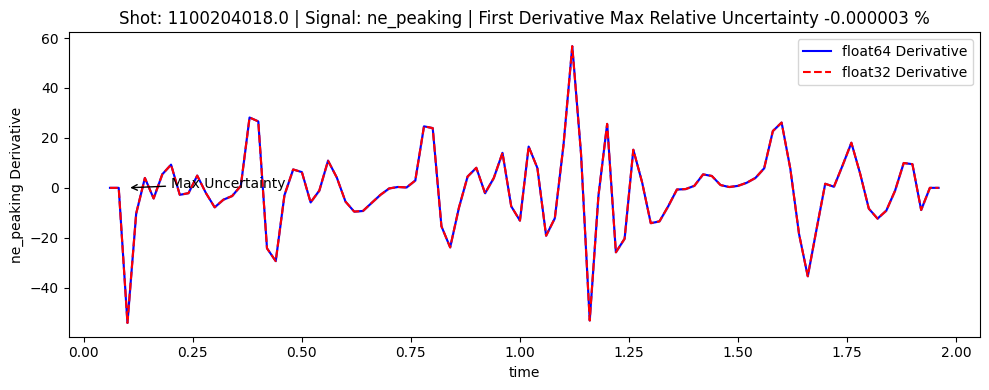

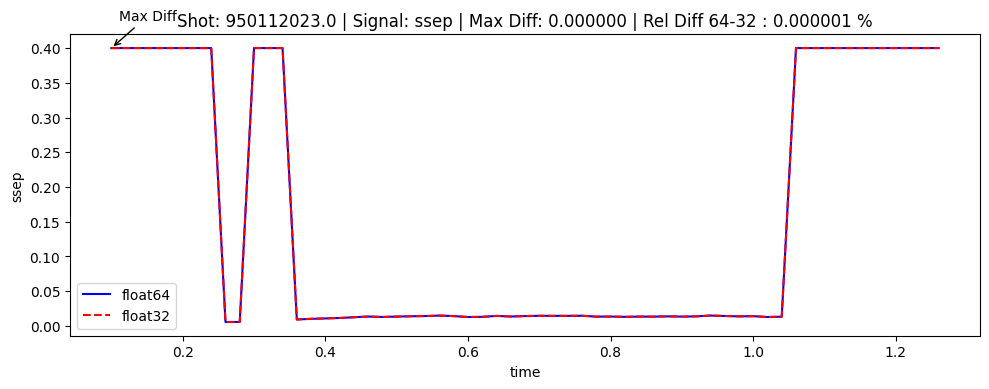

/tmp/ipykernel_833284/660870611.py:63: RuntimeWarning: divide by zero encountered in scalar divide
  print(f"Max Uncertainty at time {max_uncertainty_time} for shot {shot} with values: float32={max_uncertainty_value_32}, float64={max_uncertainty_value_64}, relative={100*(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")
/tmp/ipykernel_833284/660870611.py:65: RuntimeWarning: divide by zero encountered in scalar divide
  plt.title(f"Shot: {shot} | Signal: {signal} | First Derivative Max Relative Uncertainty {100*np.abs(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")


Max Uncertainty at time 1.2000004053115845 for shot 950112023.0 with values: float32=2.1073444274145072e-07, float64=0.0, relative=-inf %


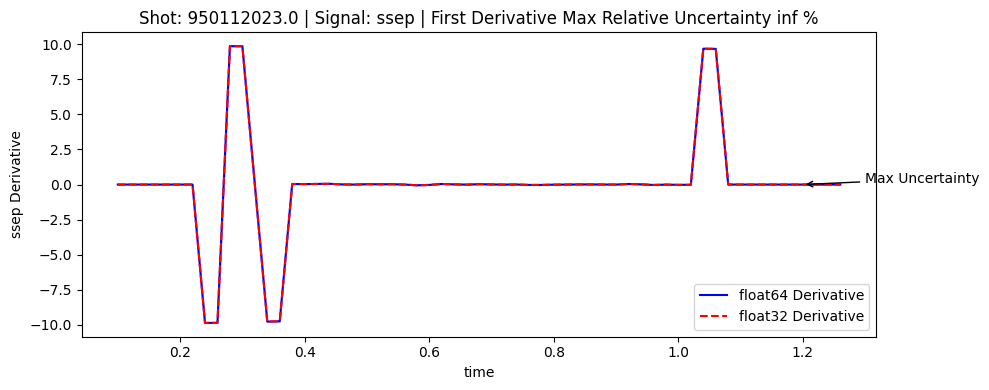

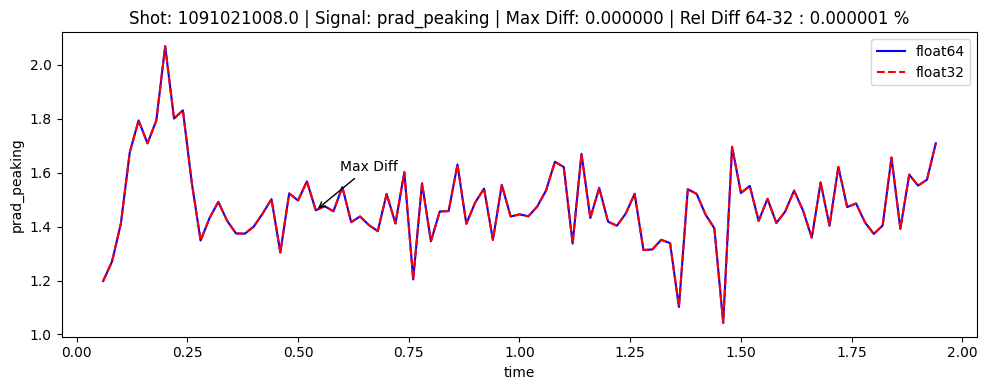

Max Uncertainty at time 0.5600000023841858 for shot 1091021008.0 with values: float32=2.6520513282982134e-07, float64=0.0, relative=0.000303 %


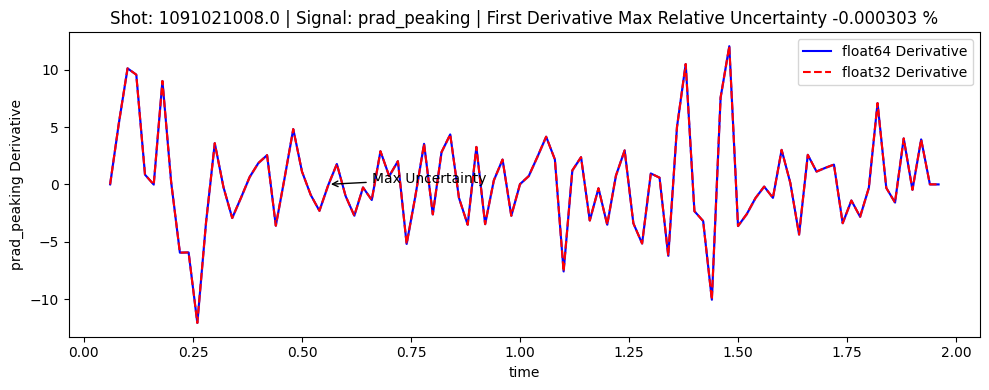

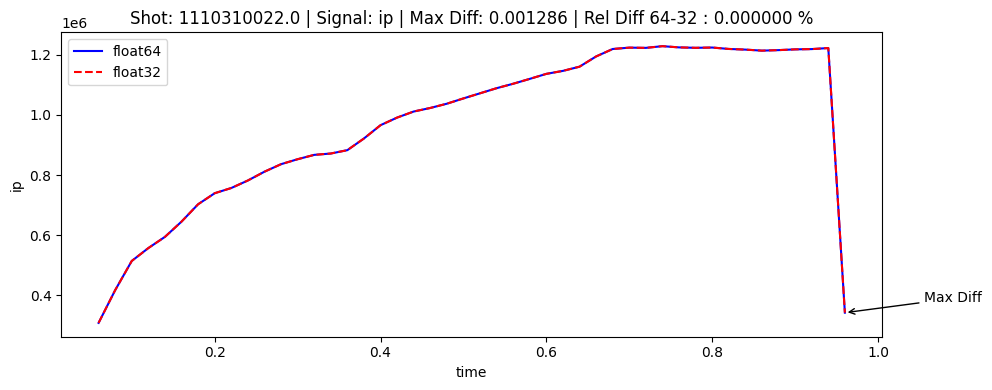

Max Uncertainty at time 0.9399999976158142 for shot 1110310022.0 with values: float32=0.03213982324027029, float64=0.0, relative=0.000000 %


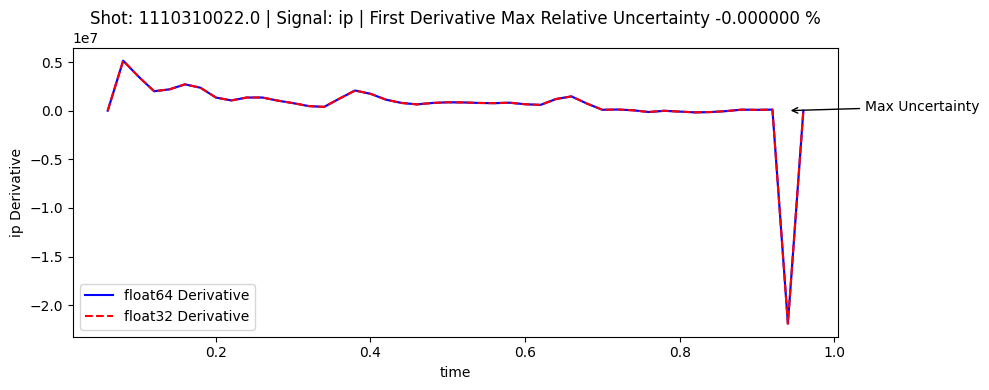

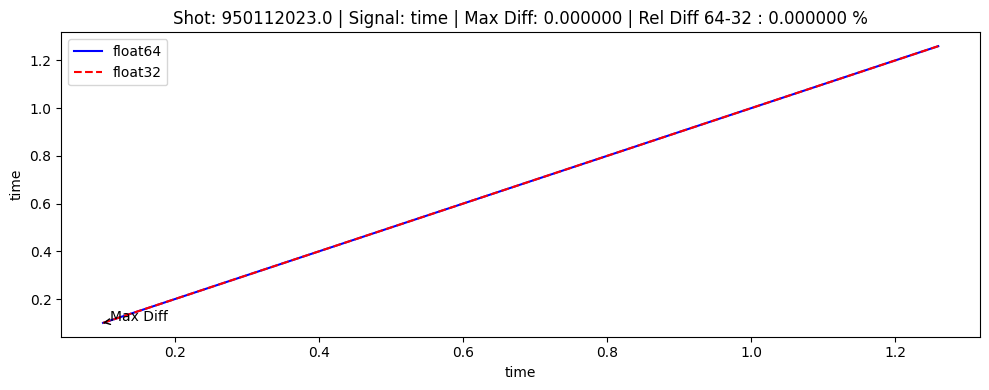

/tmp/ipykernel_833284/660870611.py:63: RuntimeWarning: invalid value encountered in scalar divide
  print(f"Max Uncertainty at time {max_uncertainty_time} for shot {shot} with values: float32={max_uncertainty_value_32}, float64={max_uncertainty_value_64}, relative={100*(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")
/tmp/ipykernel_833284/660870611.py:65: RuntimeWarning: invalid value encountered in scalar divide
  plt.title(f"Shot: {shot} | Signal: {signal} | First Derivative Max Relative Uncertainty {100*np.abs(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")


Max Uncertainty at time 0.1000000014901161 for shot 950112023.0 with values: float32=0.0, float64=0.0, relative=nan %


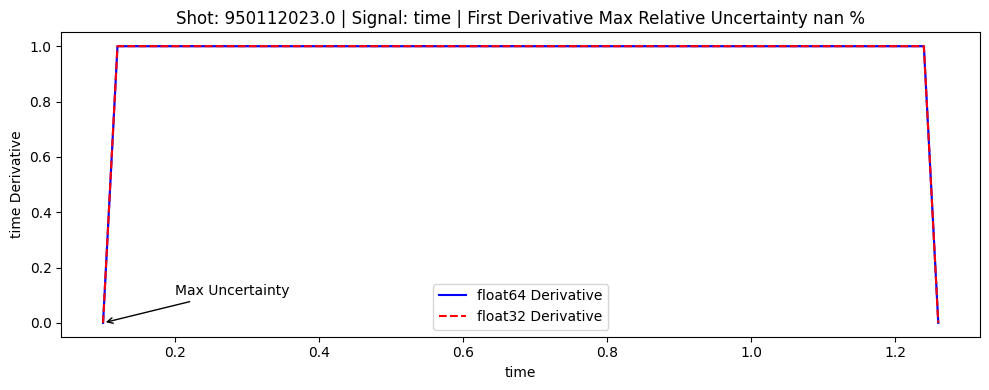

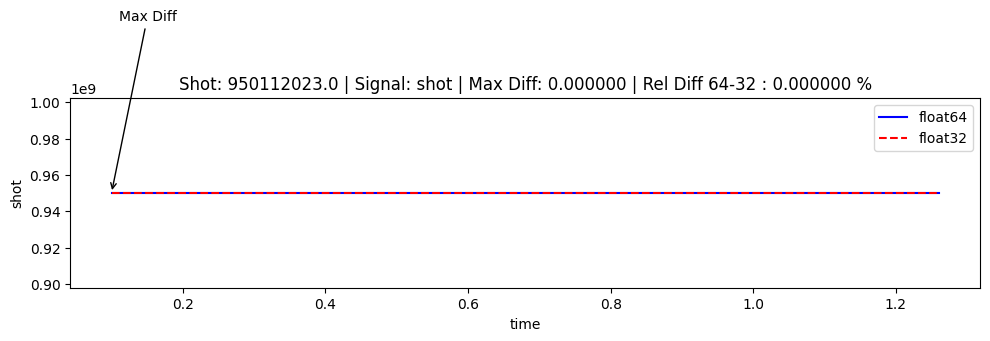

Max Uncertainty at time 0.1000000014901161 for shot 950112023.0 with values: float32=0.0, float64=0.0, relative=nan %


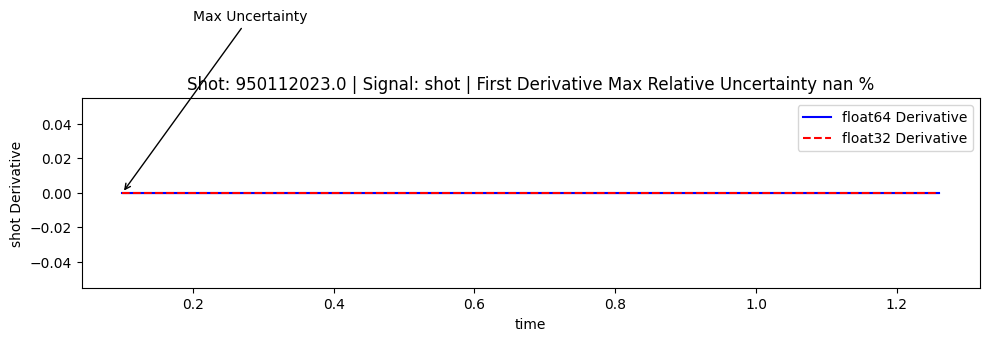

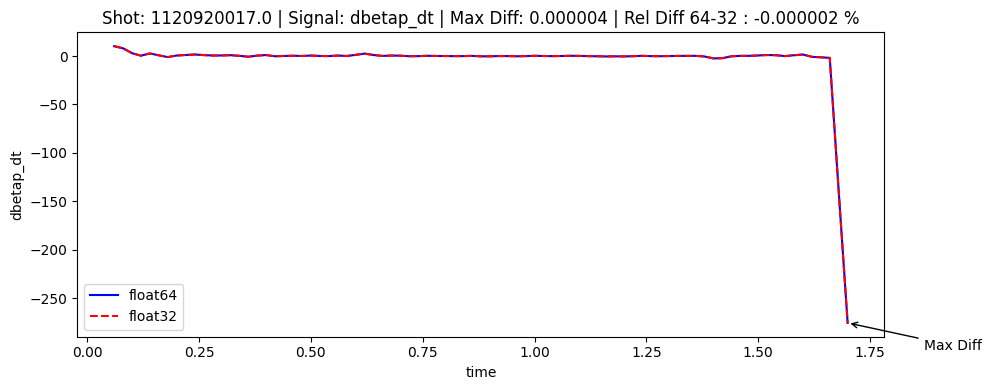

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=0.00010953809474426874, float64=0.0, relative=0.000002 %


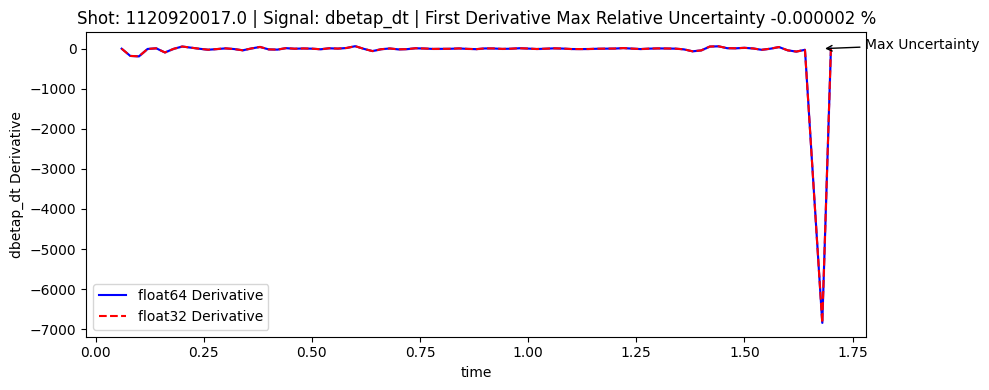

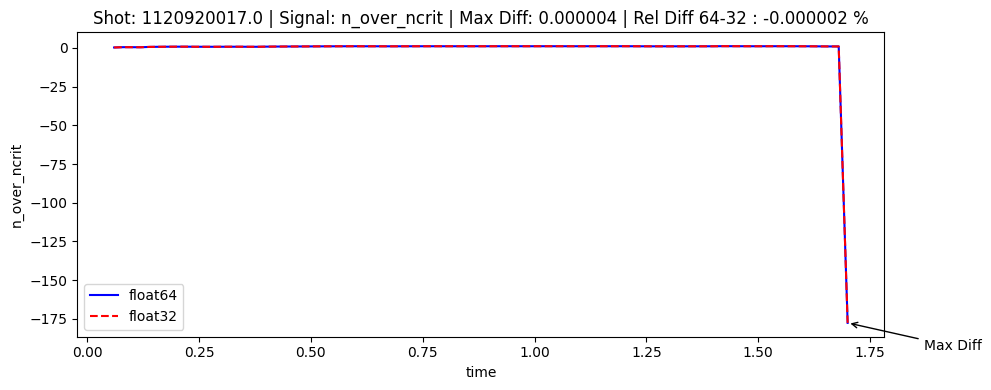

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=9.924310232911713e-05, float64=0.0, relative=0.000002 %


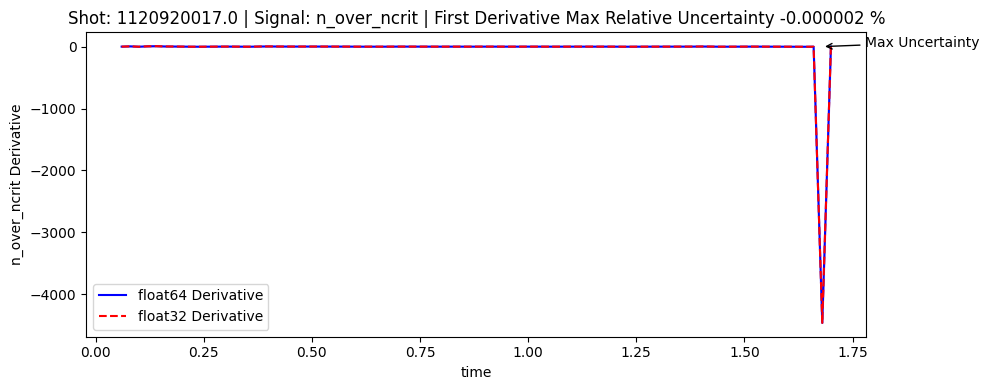

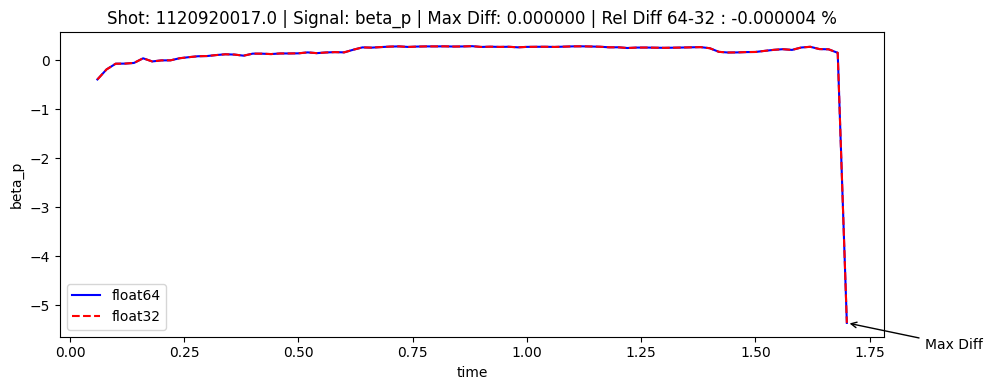

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=5.333418963685781e-06, float64=0.0, relative=0.000004 %


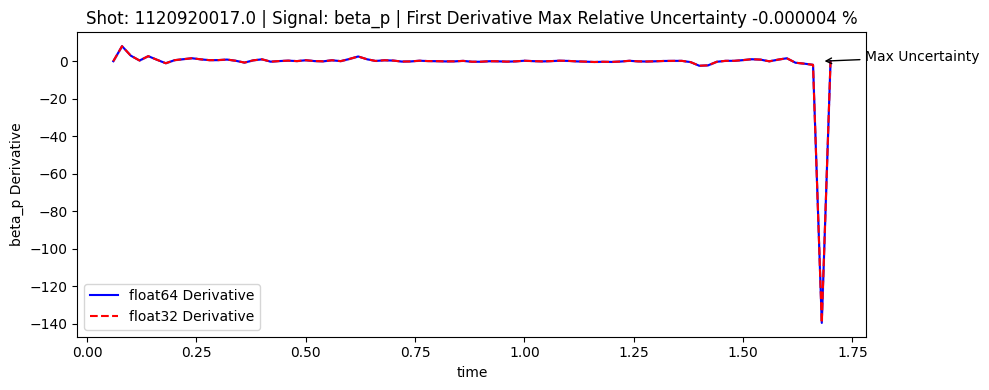

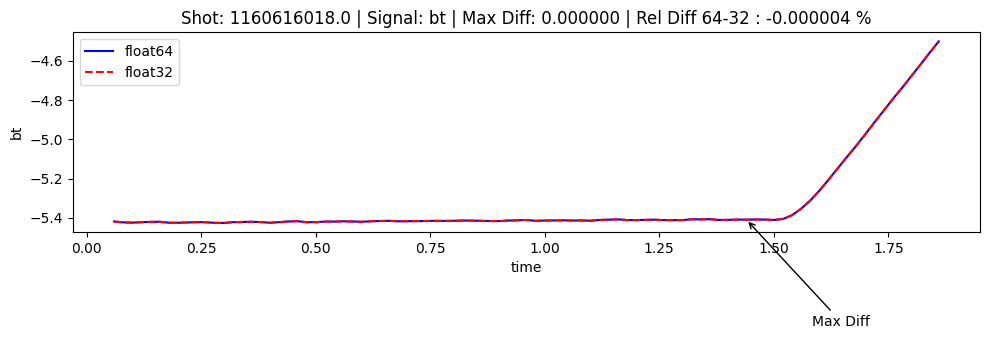

Max Uncertainty at time 1.779999852180481 for shot 1160616018.0 with values: float32=8.280138290235265e-06, float64=0.0, relative=-0.000288 %


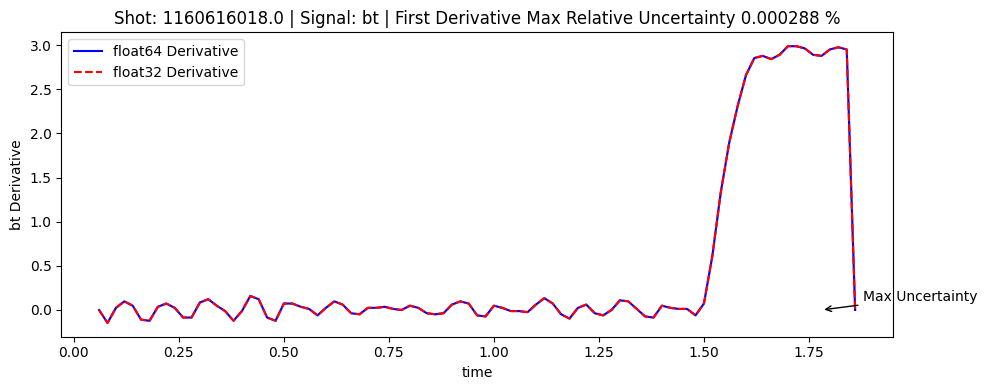

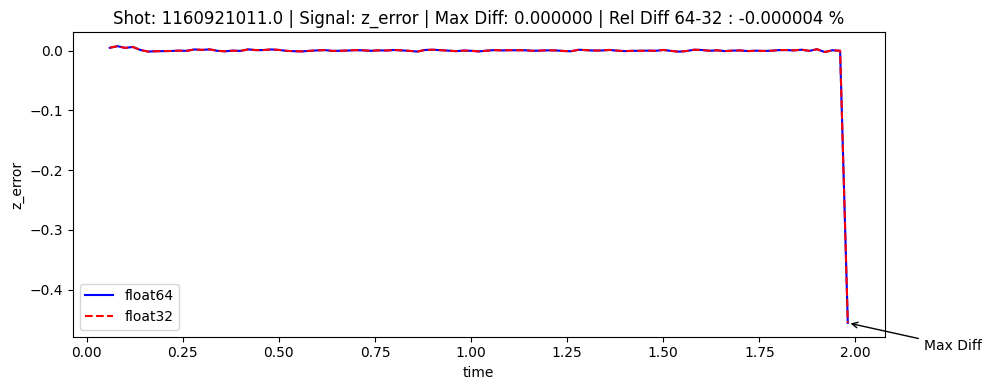

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=4.992827241056918e-07, float64=0.0, relative=0.000004 %


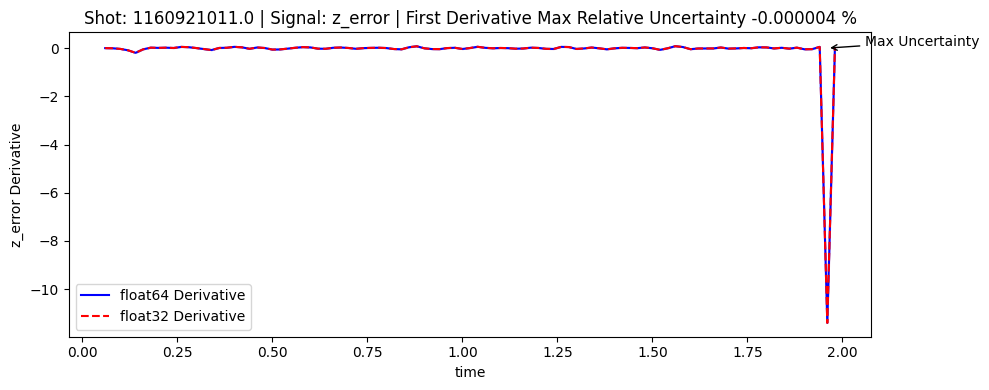

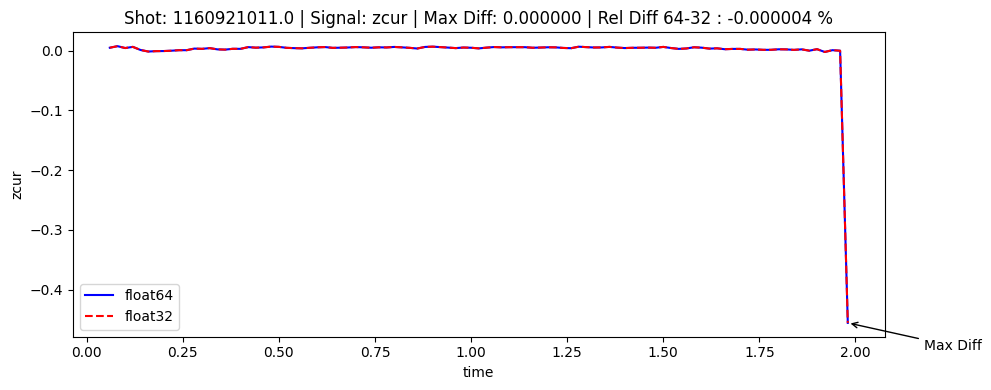

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=4.992811620807976e-07, float64=0.0, relative=0.000004 %


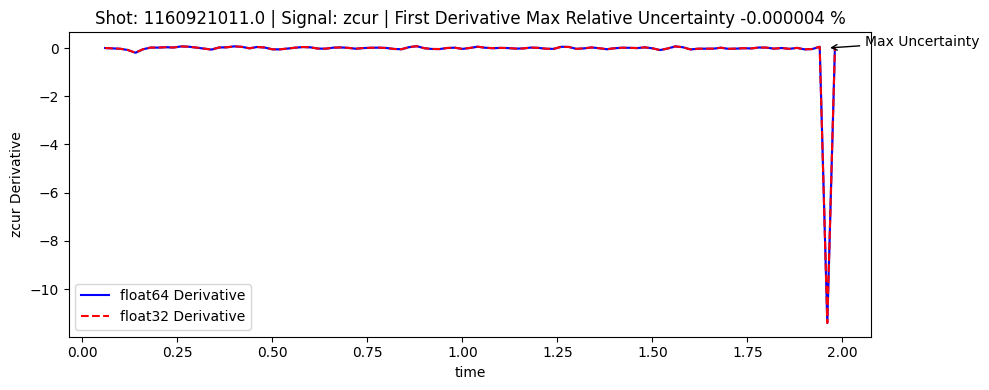

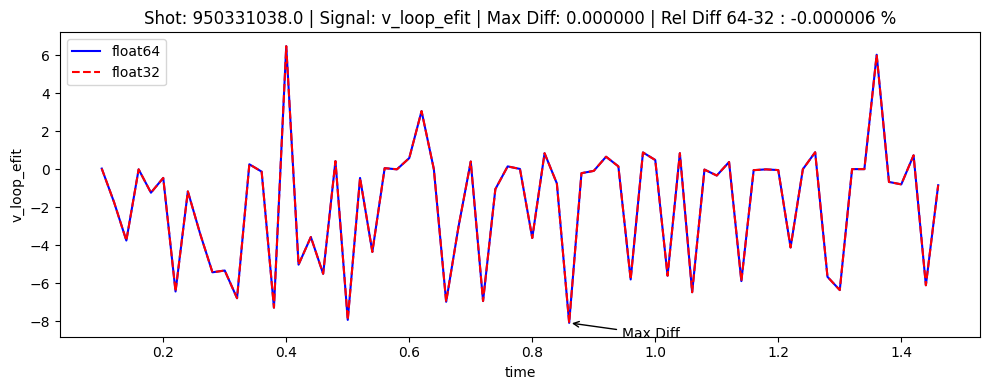

Max Uncertainty at time 0.8400002717971802 for shot 950331038.0 with values: float32=1.1892693431810781e-05, float64=0.0, relative=0.000005 %


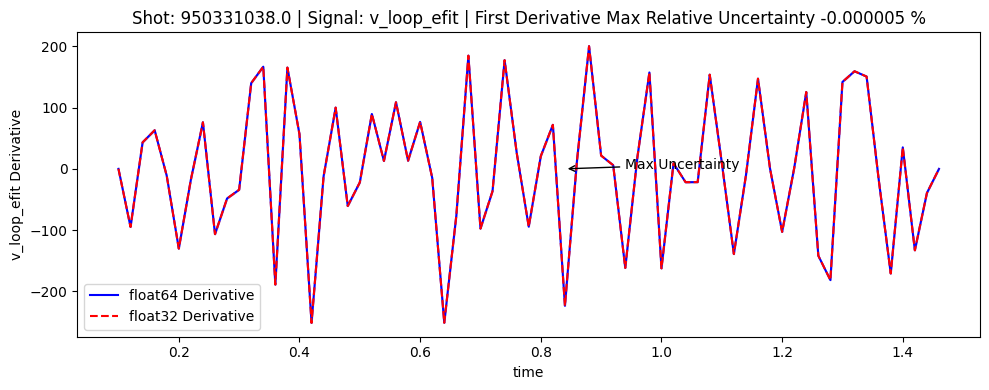

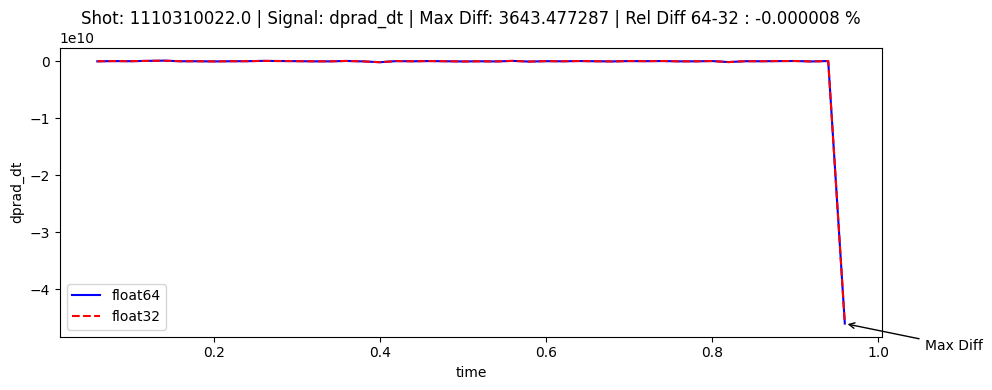

Max Uncertainty at time 0.9399999976158142 for shot 1110310022.0 with values: float32=91095.14127698207, float64=0.0, relative=0.000008 %


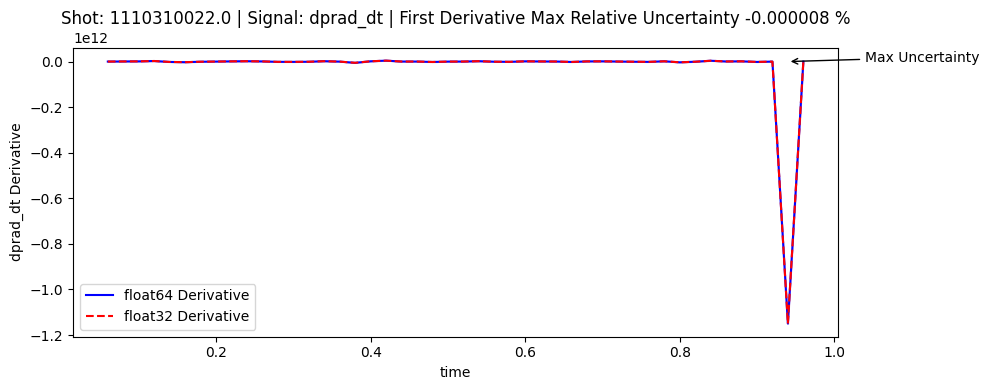

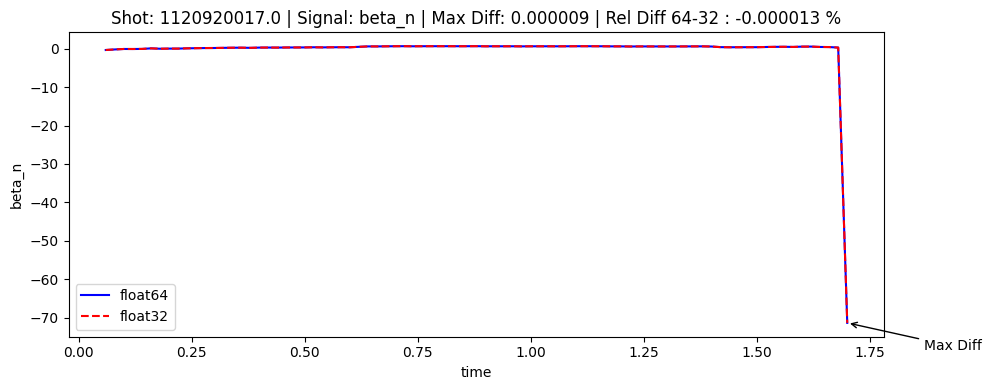

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=0.0002331343872818246, float64=0.0, relative=0.000013 %


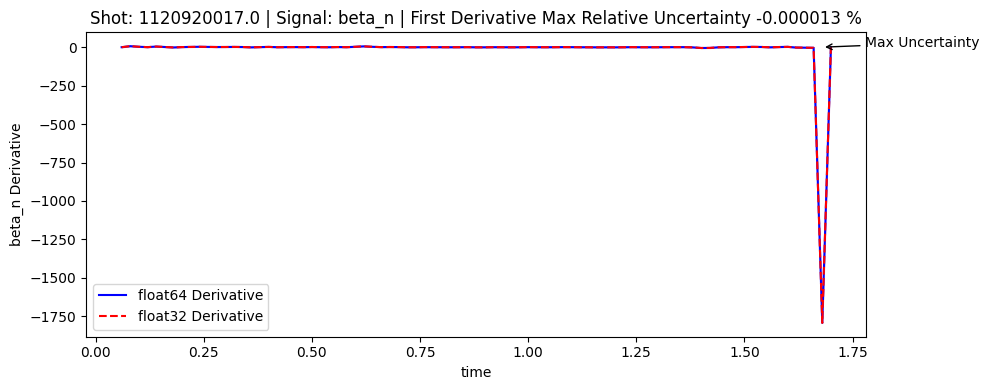

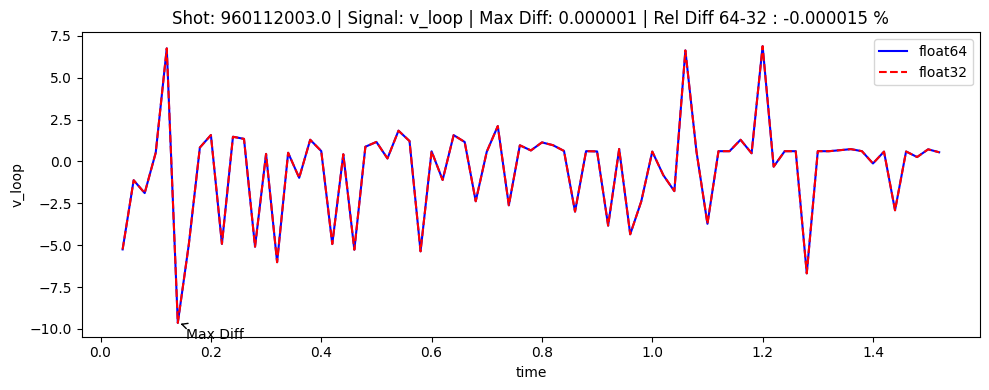

Max Uncertainty at time 0.1599999964237213 for shot 960112003.0 with values: float32=3.699486935307318e-05, float64=0.0, relative=-0.000014 %


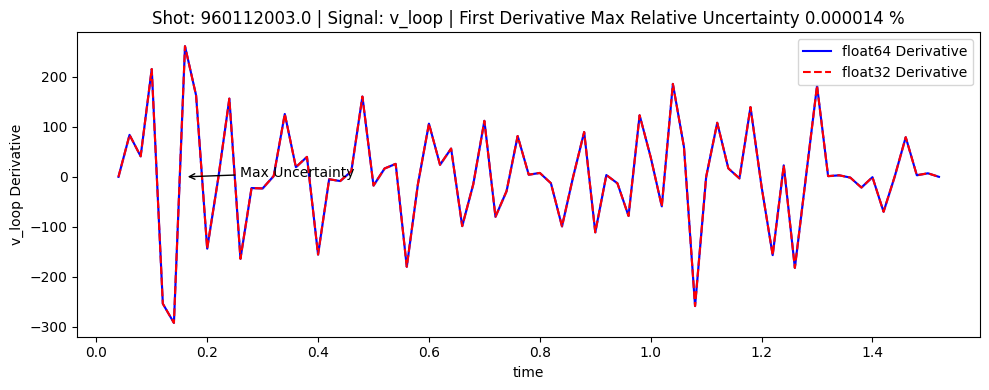

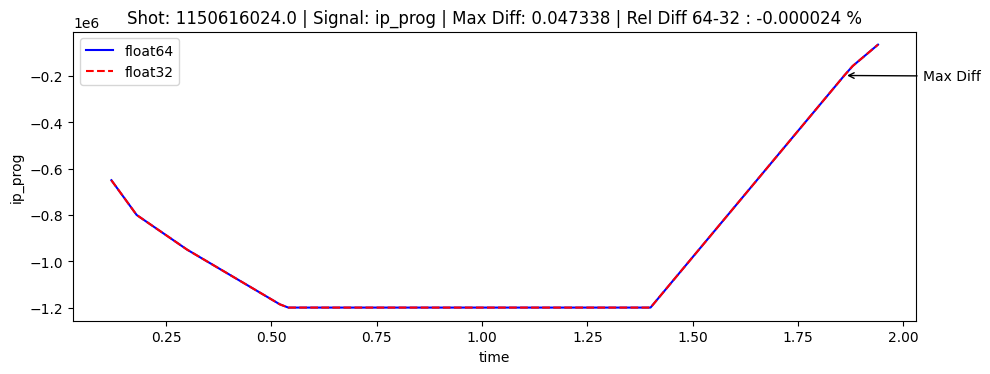

Max Uncertainty at time 1.8399999141693115 for shot 1150616024.0 with values: float32=1.602538184205468, float64=0.0, relative=-0.000074 %


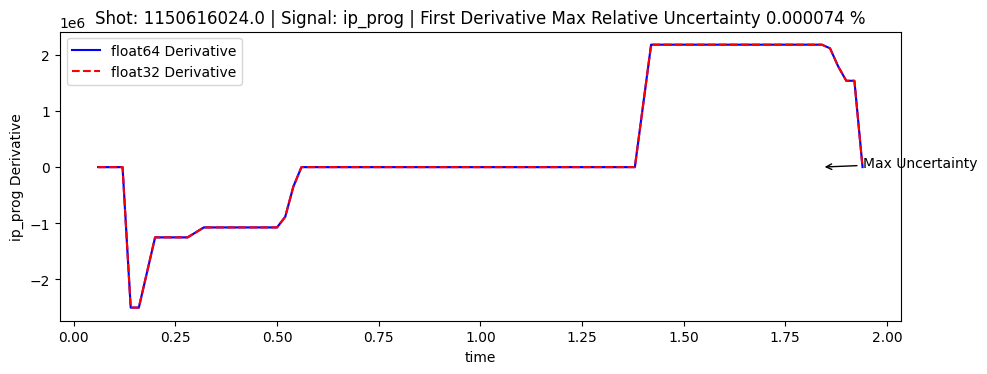

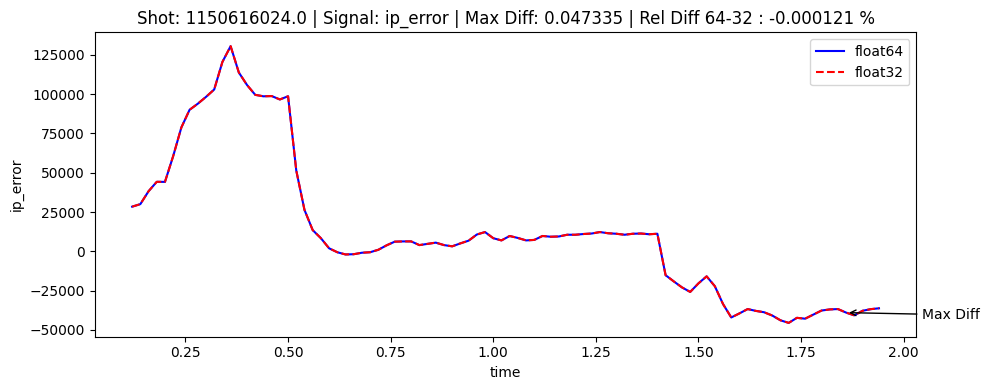

Max Uncertainty at time 1.8399999141693115 for shot 1150616024.0 with values: float32=1.6024174247008975, float64=0.0, relative=0.003149 %


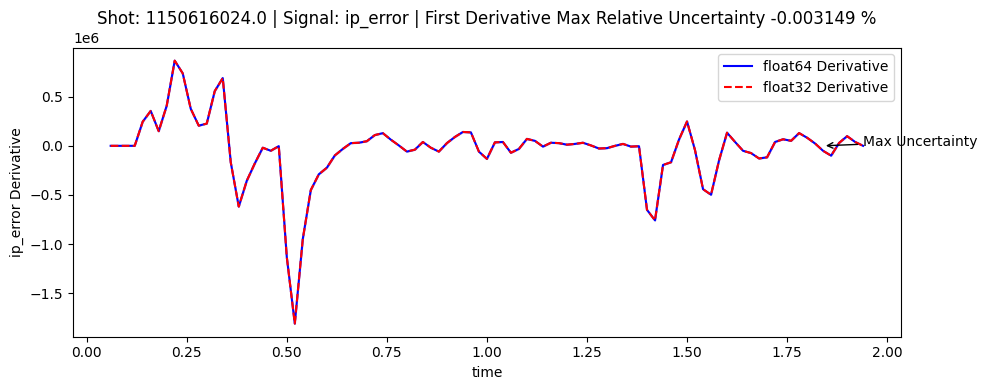

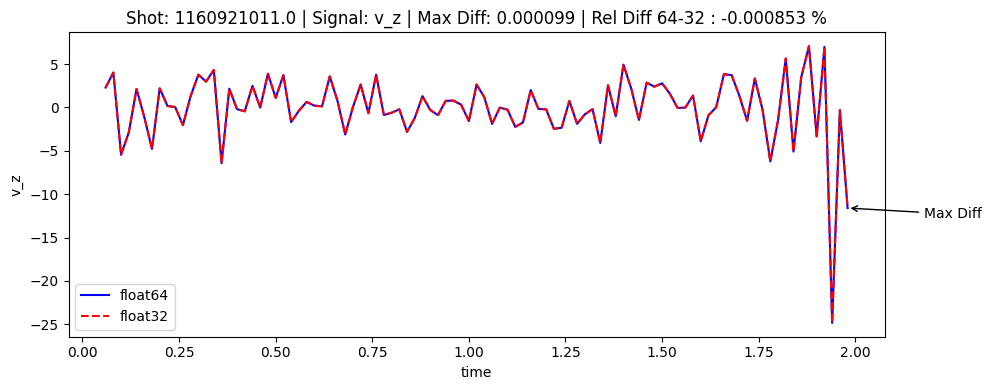

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=0.002472662226269398, float64=0.0, relative=-0.000747 %


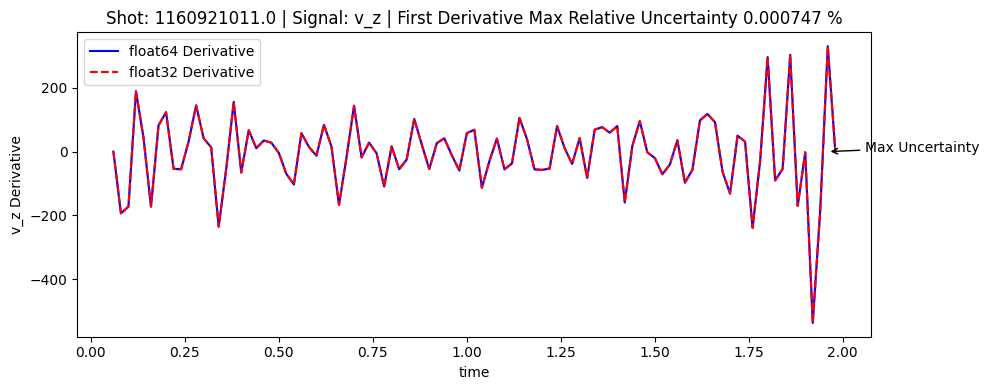

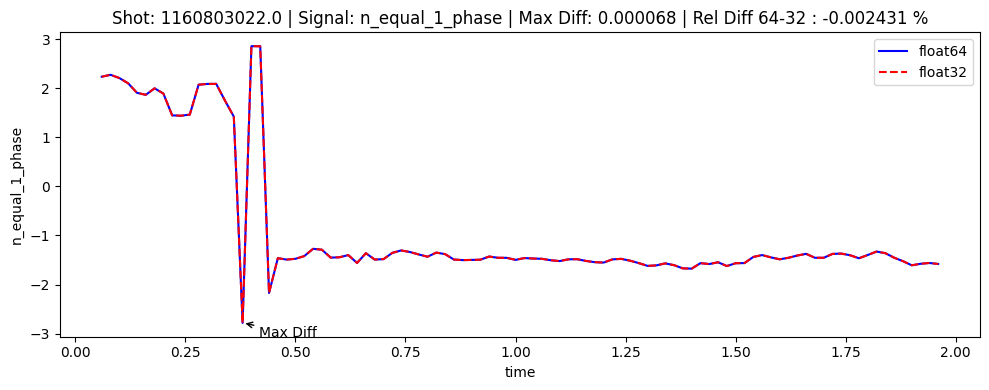

Max Uncertainty at time 0.4000000059604645 for shot 1160803022.0 with values: float32=0.0017001079781254142, float64=0.0, relative=-0.001207 %


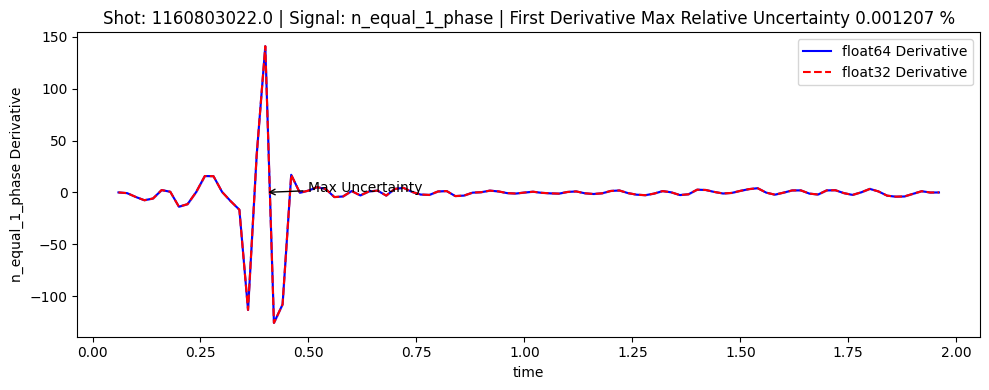

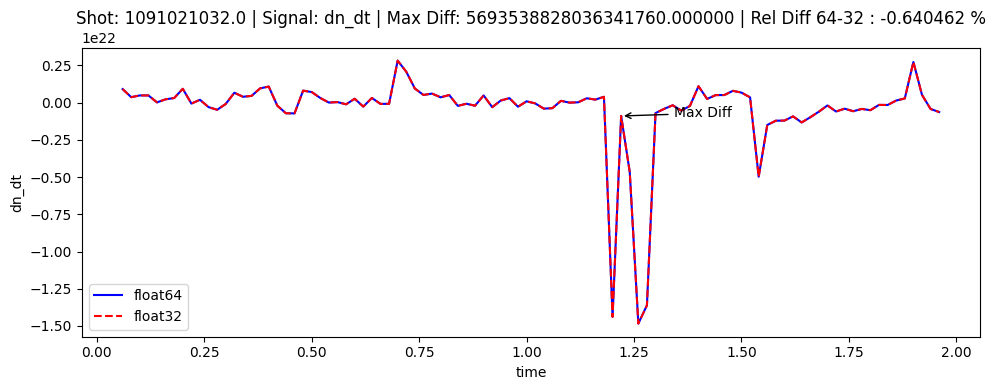

Max Uncertainty at time 1.2399998903274536 for shot 1091021032.0 with values: float32=1.4257626399334816e+20, float64=0.0, relative=0.040887 %


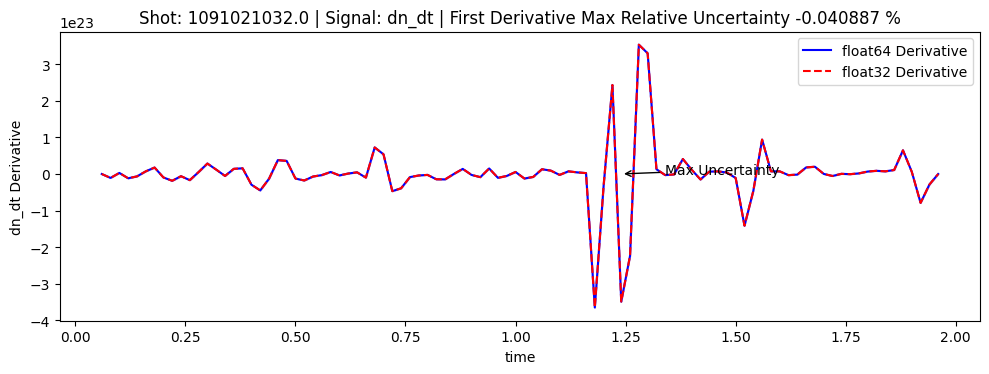

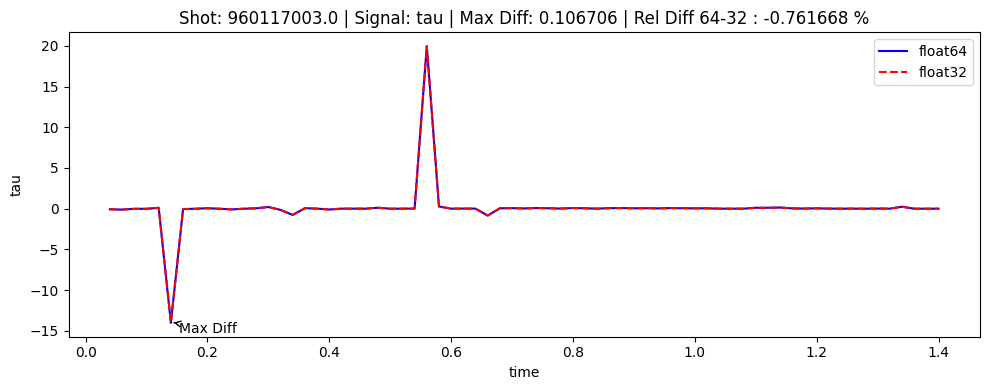

Max Uncertainty at time 0.1199999973177909 for shot 960117003.0 with values: float32=2.667654035221646, float64=0.0, relative=0.762116 %


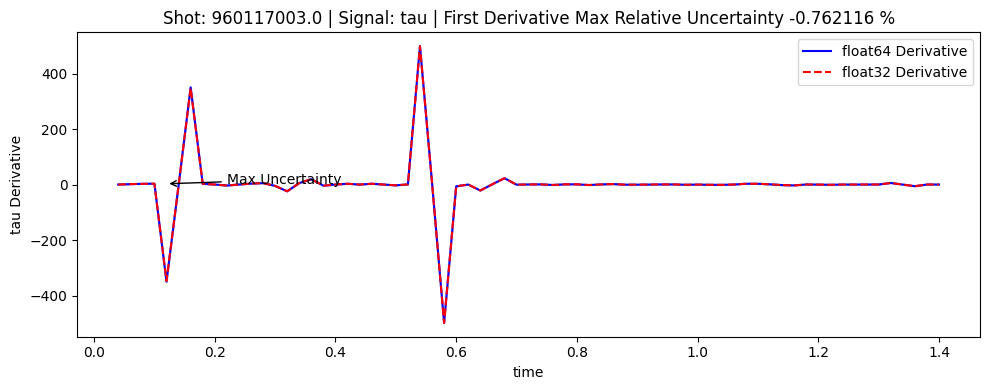

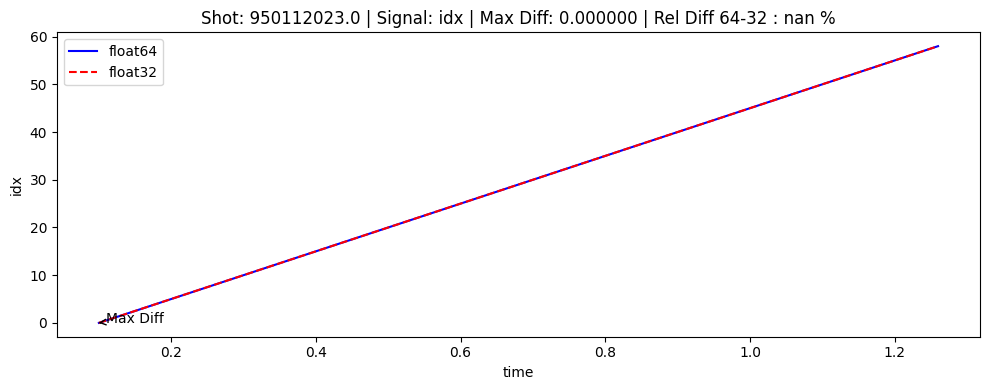

Max Uncertainty at time 0.1000000014901161 for shot 950112023.0 with values: float32=0.0, float64=0.0, relative=nan %


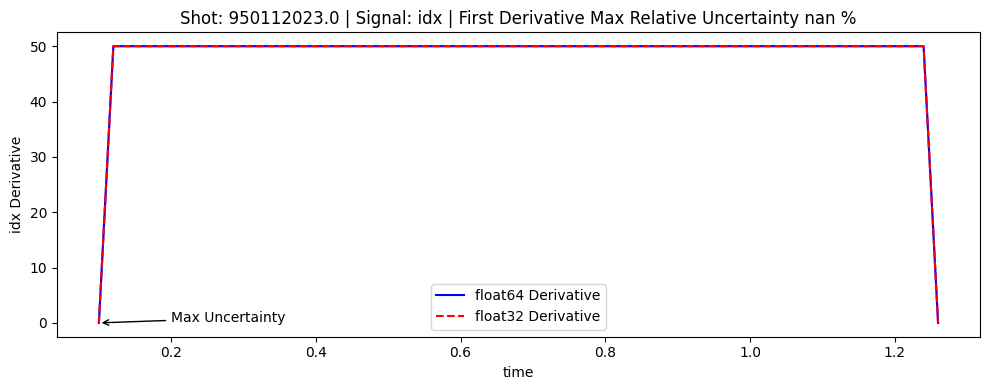

In [14]:
import matplotlib.pyplot as plt

for idx, row in max_diff_df_sorted.iterrows():
    shot = row['shot']
    signal = row['column']
    # Filter for the current shot
    df32_shot = df32[df32['shot'] == shot]
    df64_shot = df64[df64['shot'] == shot]
    if signal not in df32_shot.columns or signal not in df64_shot.columns:
        continue
    plt.figure(figsize=(10, 4))
    plt.plot(df64_shot['time'], df64_shot[signal], label='float64', color='b')
    plt.plot(df32_shot['time'], df32_shot[signal], label='float32', color='r', linestyle='--')
    # add an arrow to the plot indicating the maximum difference time
    max_time = df32_shot.loc[row['row_index'], 'time']
    max_value_32 = df32_shot.loc[row['row_index'], signal]
    max_value_64 = df64_shot.loc[row['row_index'], signal]
    plt.annotate('Max Diff', xy=(max_time, max_value_32), xytext=(max_time + 0.1*max_time, max_value_32 + 0.1*max_value_32),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.title(f"Shot: {shot} | Signal: {signal} | Max Diff: {row['absolute_difference']:.6f} | Rel Diff 64-32 : {row['relative_difference_64_percent']:.6f} %")
    plt.xlabel('time')
    plt.ylabel(signal)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # workout first_derivative_with_error
    t = df32_shot['time'].values
    f32 = df32_shot[signal].values
    f64 = df64_shot[signal].values
    # sigma_f32 = np.zeros_like(f32)  # Assuming no uncertainty for simplicity
    sigma_f32 = np.abs(f64)-np.abs(f32)  # Assuming no uncertainty for simplicity
    sigma_f64 = np.zeros_like(f64)  # Assuming no uncertainty for simplicity

    df32_derivative, sigma_df32 = first_derivative_with_error(t, f32, sigma_f32)
    df64_derivative, sigma_df64 = first_derivative_with_error(t, f64, sigma_f64)

    # replace NaNs with zeros for plotting
    df32_derivative = np.nan_to_num(df32_derivative)
    df64_derivative = np.nan_to_num(df64_derivative)
    sigma_df32 = np.nan_to_num(sigma_df32)
    sigma_df64 = np.nan_to_num(sigma_df64)

    plt.figure(figsize=(10, 4))
    plt.plot(t, df64_derivative, label='float64 Derivative', color='b')
    plt.plot(t, df32_derivative, label='float32 Derivative', color='r', linestyle='--')
    # plt.plot(t, sigma_df64, label='float64 Uncertainty', color='b', linestyle=':')
    # plt.plot(t, sigma_df32, label='float32 Uncertainty', color='r', linestyle=':')
    # use shaded area to represent uncertainty
    plt.fill_between(t, df64_derivative - sigma_df64, df64_derivative + sigma_df64, color='b', alpha=0.1)
    plt.fill_between(t, df32_derivative - sigma_df32, df32_derivative + sigma_df32, color='r', alpha=0.1)
    # max uncertainty time
    max_uncertainty_idx = np.abs(sigma_df32).argmax()
    
    max_uncertainty_value_32 = sigma_df32[max_uncertainty_idx]
    max_uncertainty_value_64 = sigma_df64[max_uncertainty_idx]
    max_uncertainty_derivative_32 = df32_derivative[max_uncertainty_idx]
    max_uncertainty_derivative_64 = df64_derivative[max_uncertainty_idx]
    max_uncertainty_time = t[max_uncertainty_idx]
    plt.annotate('Max Uncertainty', xy=(max_uncertainty_time, max_uncertainty_value_32), 
                 xytext=(max_uncertainty_time + 0.1, max_uncertainty_value_32 + 0.1),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    print(f"Max Uncertainty at time {max_uncertainty_time} for shot {shot} with values: float32={max_uncertainty_value_32}, float64={max_uncertainty_value_64}, relative={100*(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")
    
    plt.title(f"Shot: {shot} | Signal: {signal} | First Derivative Max Relative Uncertainty {100*np.abs(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")
    plt.xlabel('time')
    plt.ylabel(f"{signal} Derivative")
    plt.legend()
    plt.tight_layout()
    plt.show()



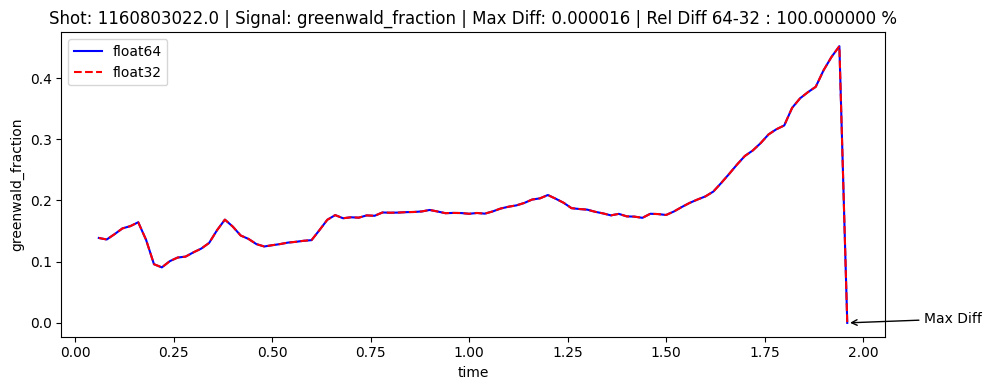

Max Uncertainty at time 1.9399999380111692 for shot 1160803022.0 with values: float32=0.04010096388489322, float64=0.0


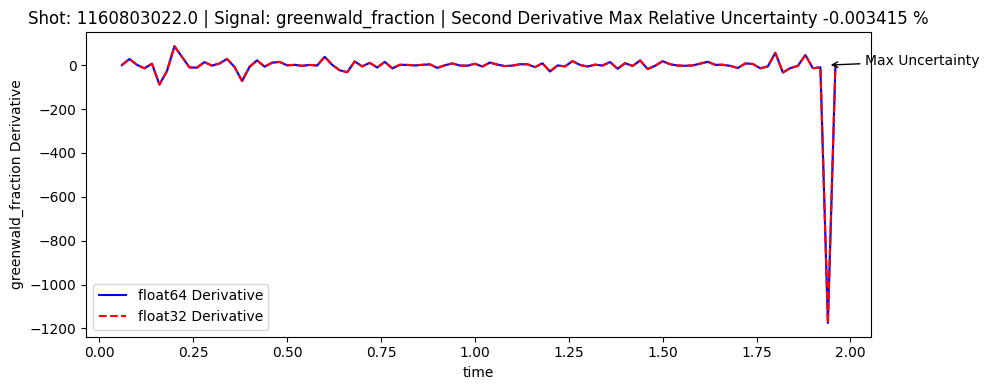

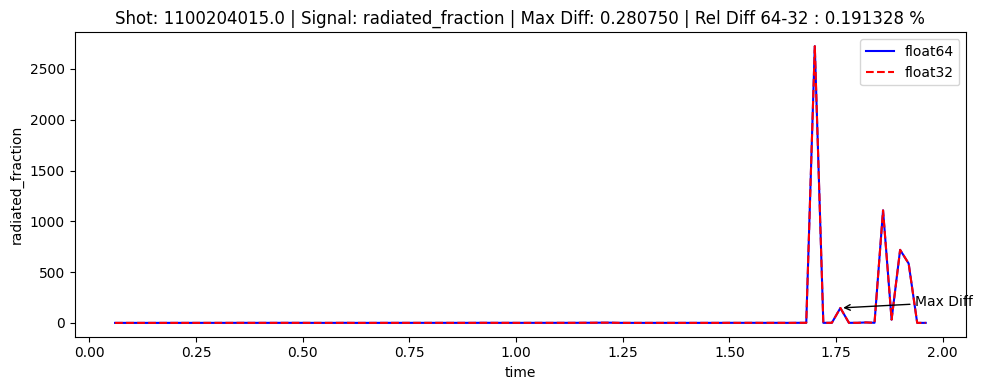

Max Uncertainty at time 1.7599998712539673 for shot 1100204015.0 with values: float32=1403.75221656728, float64=0.0


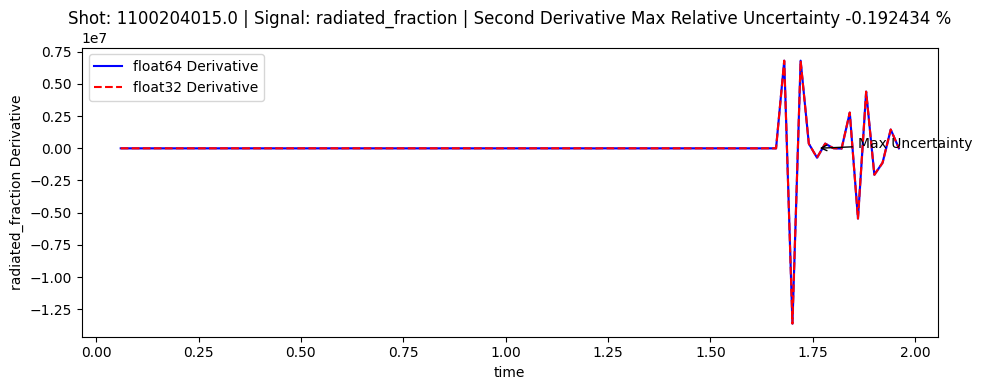

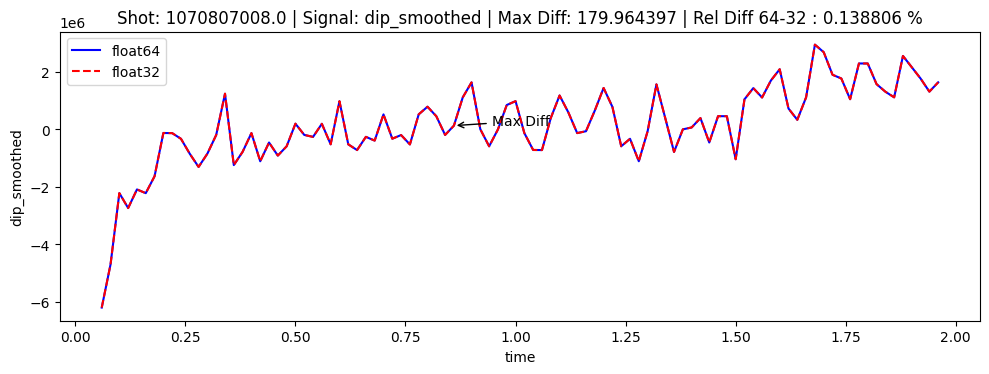

Max Uncertainty at time 0.85999995470047 for shot 1070807008.0 with values: float32=907044.9006685076, float64=0.0


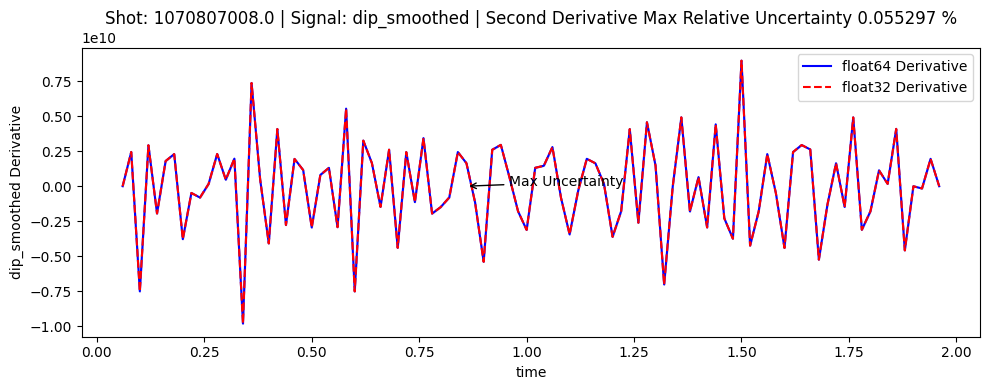

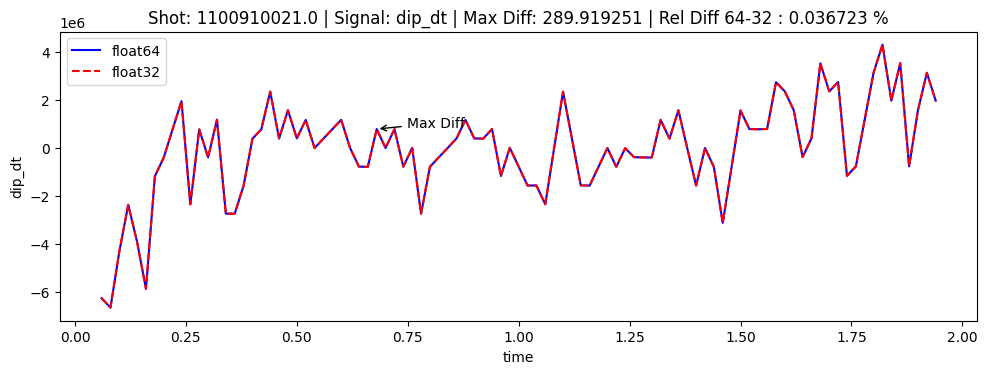

Max Uncertainty at time 0.6800000071525574 for shot 1100910021.0 with values: float32=1544759.4534509336, float64=0.0


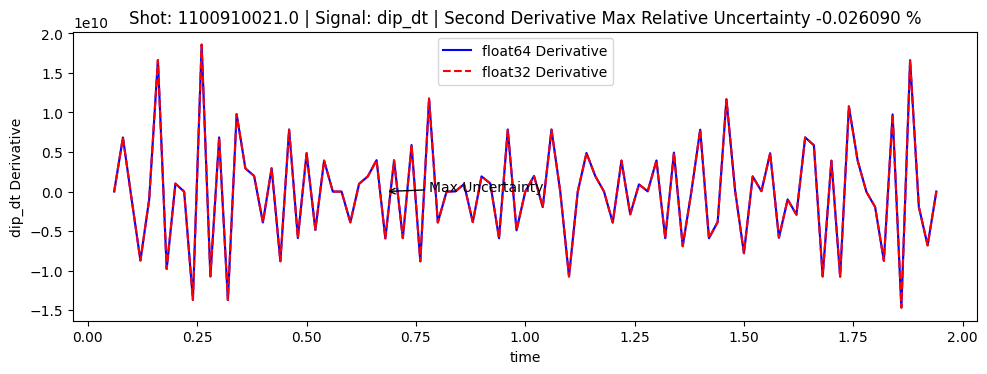

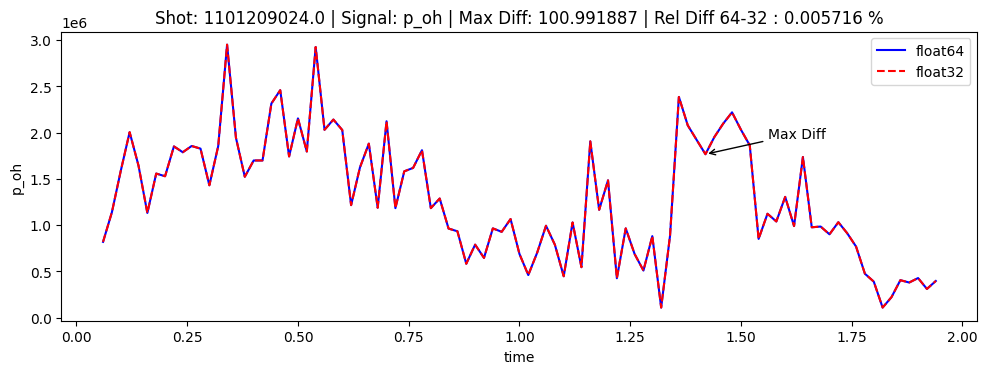

Max Uncertainty at time 1.4199999570846558 for shot 1101209024.0 with values: float32=517337.5846000471, float64=0.0


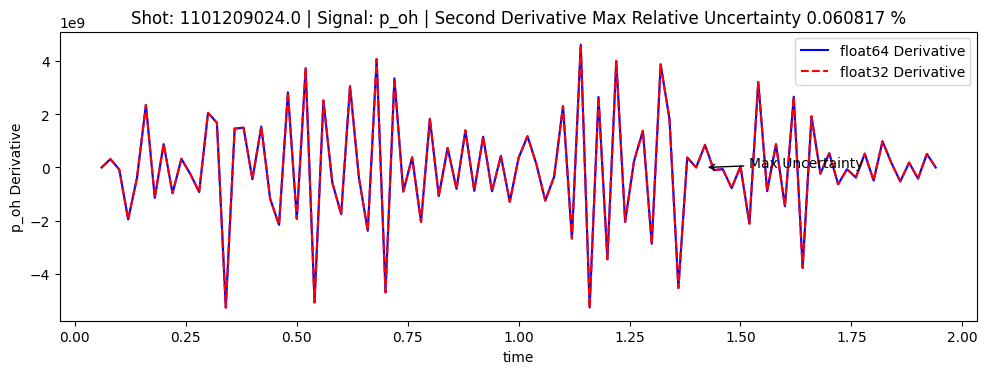

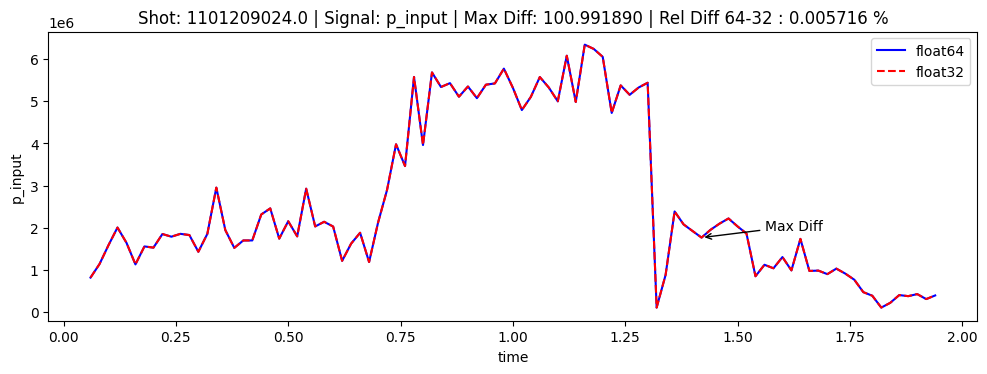

Max Uncertainty at time 1.4199999570846558 for shot 1101209024.0 with values: float32=517337.59799877106, float64=0.0


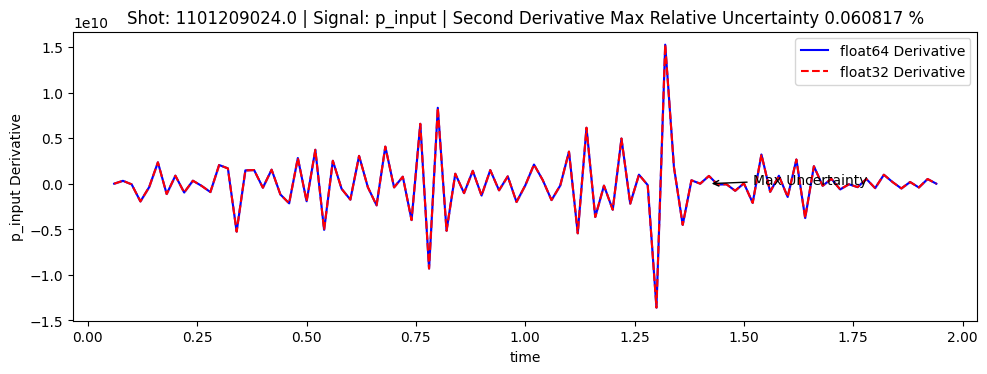

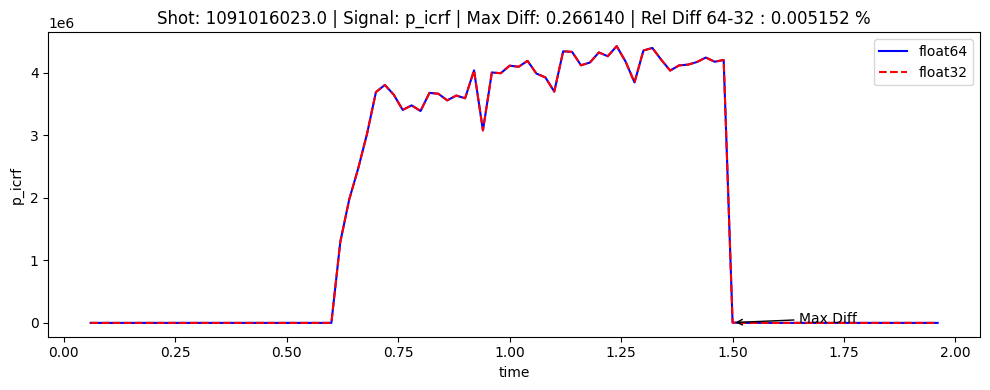

Max Uncertainty at time 1.4999998807907104 for shot 1091016023.0 with values: float32=1408.885854080102, float64=0.0


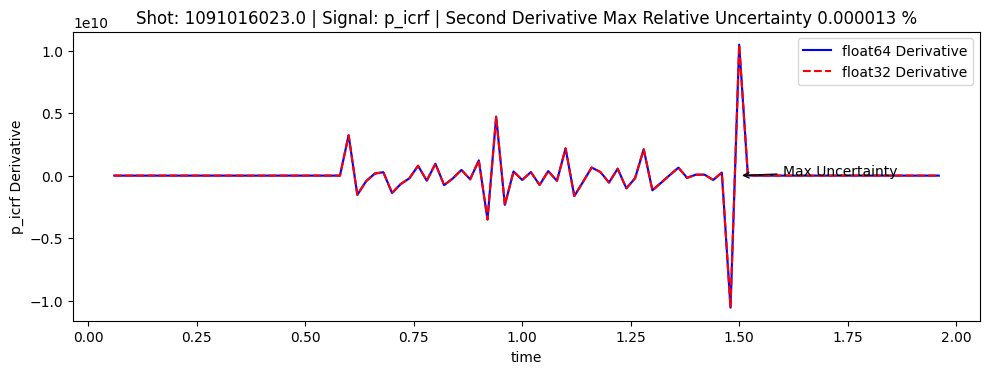

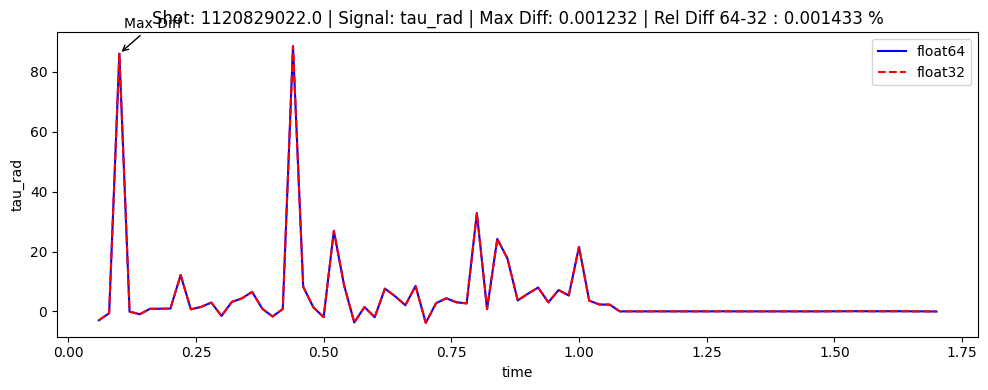

Max Uncertainty at time 0.0999999940395355 for shot 1120829022.0 with values: float32=6.159662076898366, float64=0.0


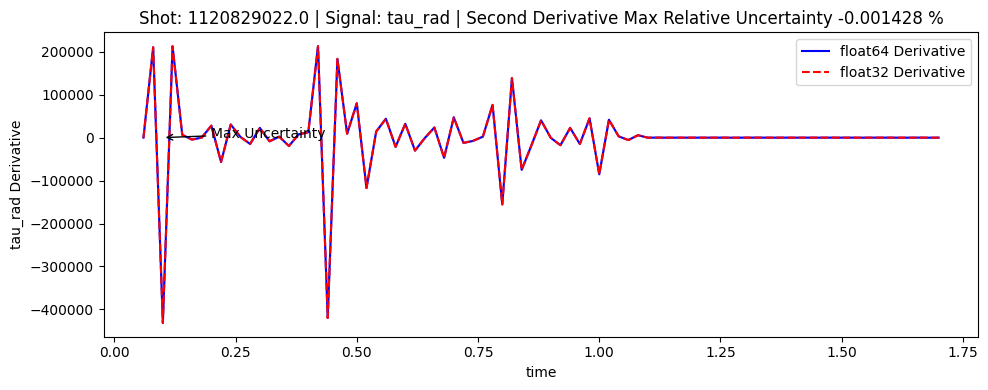

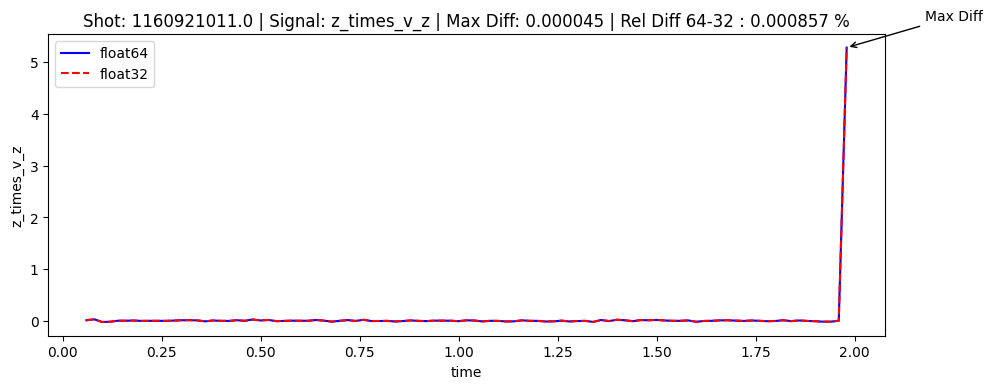

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=0.11319517410063981, float64=0.0


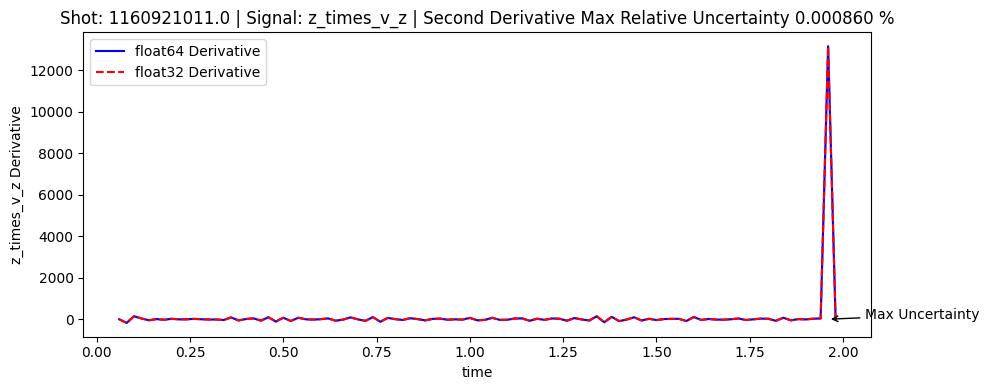

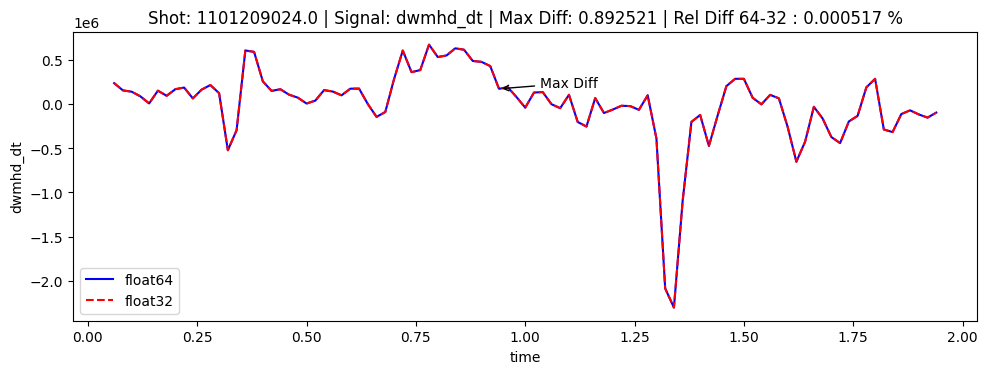

Max Uncertainty at time 0.9399999976158142 for shot 1101209024.0 with values: float32=4489.490987006839, float64=0.0


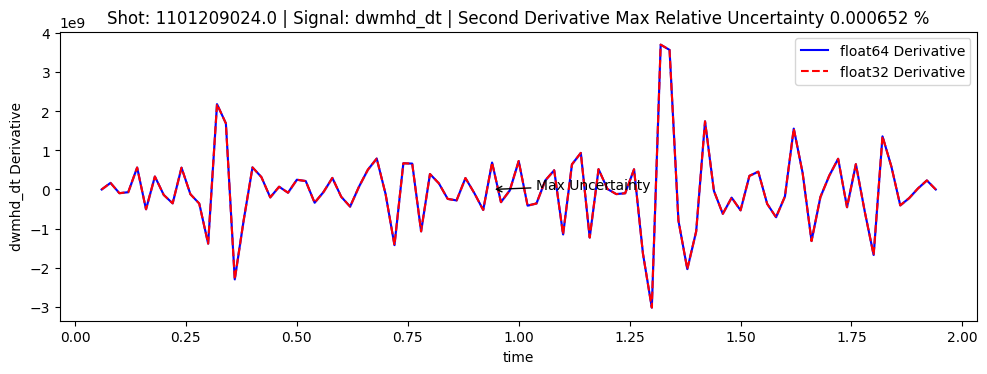

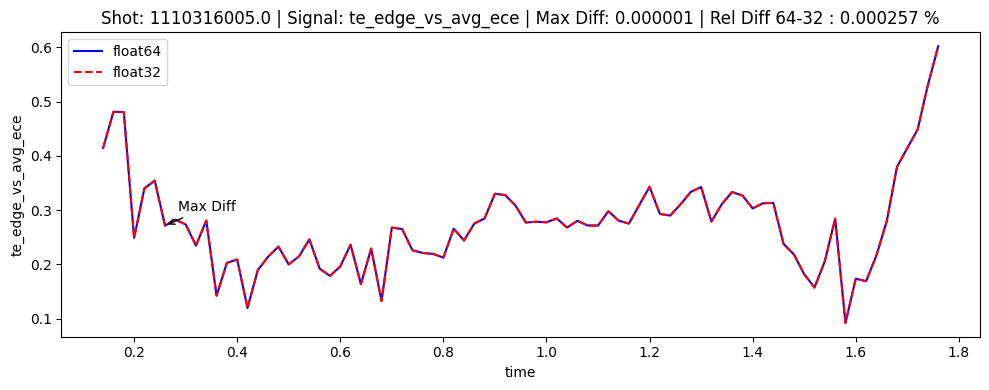

Max Uncertainty at time 0.2599999904632568 for shot 1110316005.0 with values: float32=0.003486456784171001, float64=0.0


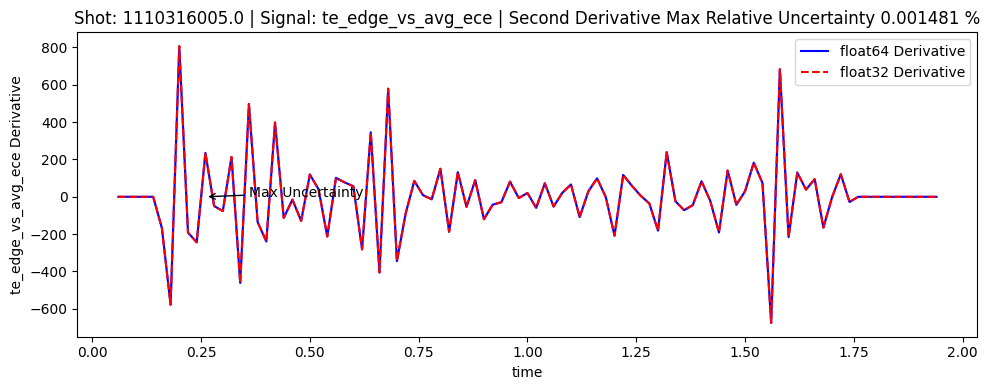

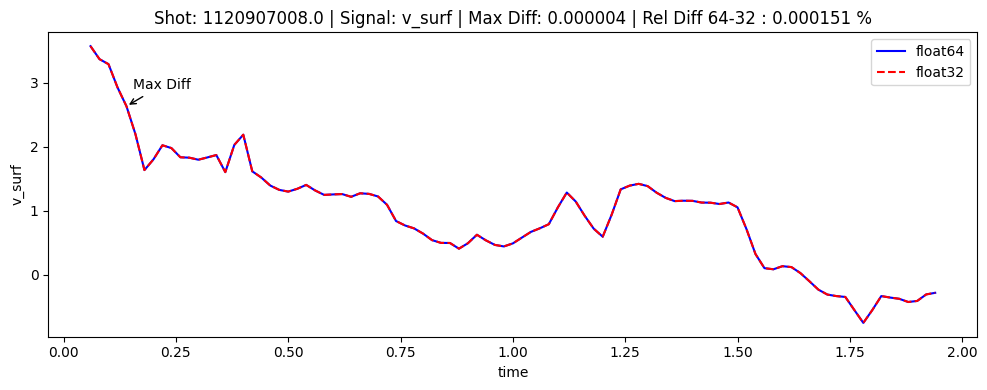

Max Uncertainty at time 0.1400000005960464 for shot 1120907008.0 with values: float32=0.01997432573709674, float64=0.0


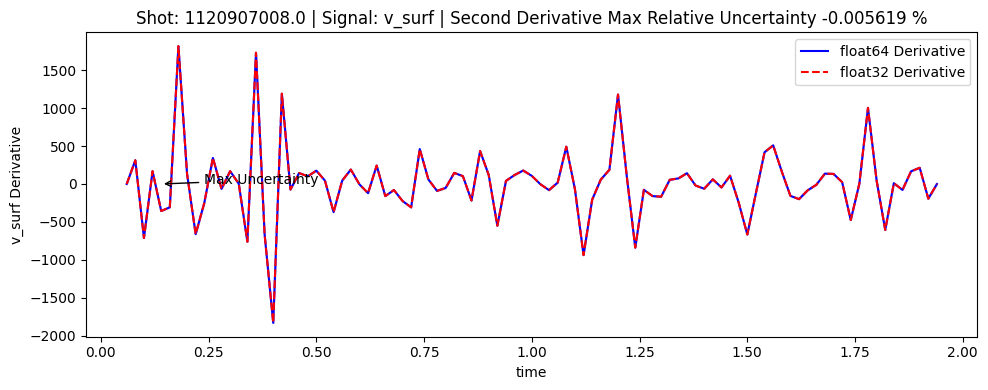

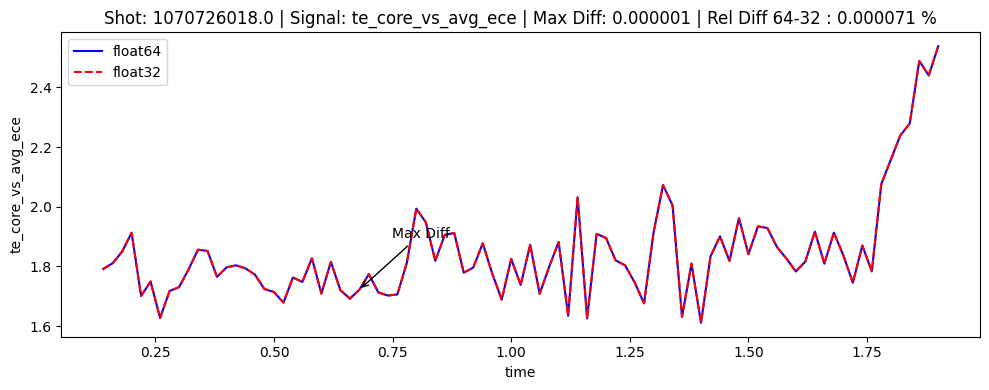

Max Uncertainty at time 0.6800000071525574 for shot 1070726018.0 with values: float32=0.006594972498324298, float64=0.0


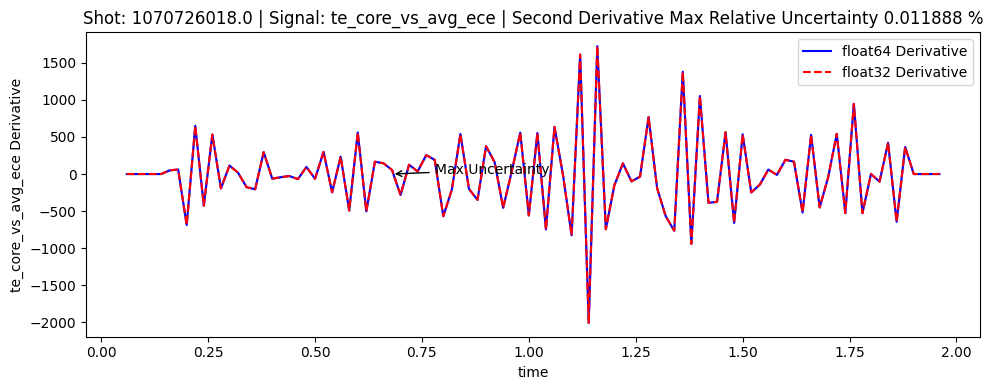

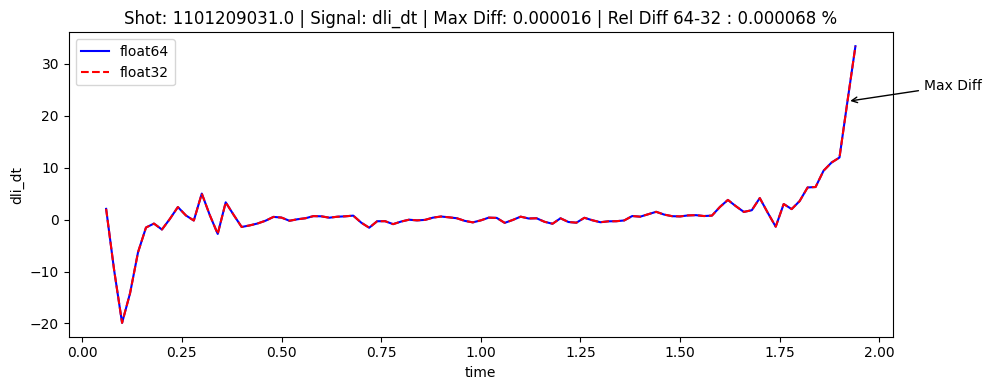

Max Uncertainty at time 1.919999957084656 for shot 1101209031.0 with values: float32=0.07927252086071897, float64=0.0


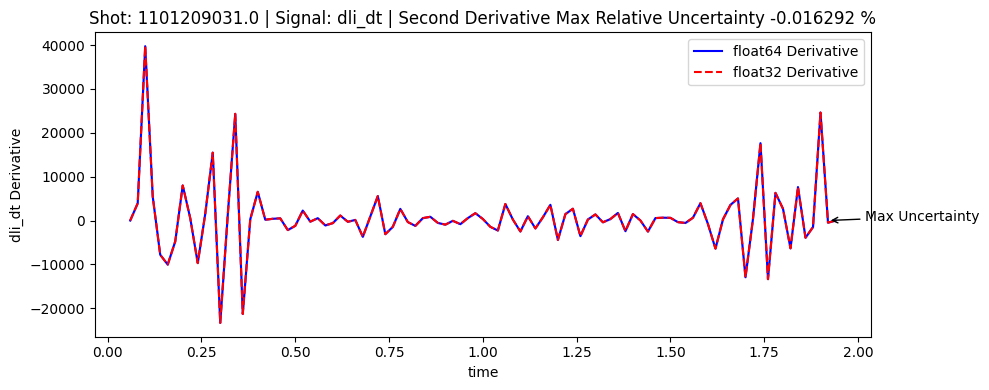

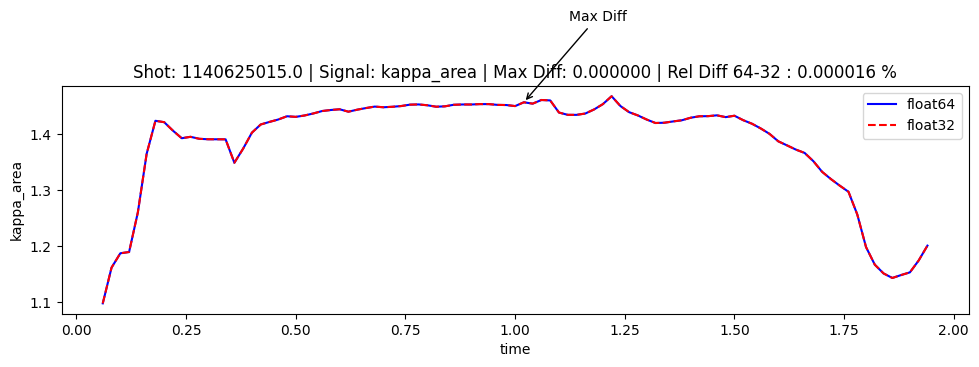

Max Uncertainty at time 1.0199999809265137 for shot 1140625015.0 with values: float32=0.001151176865488263, float64=0.0


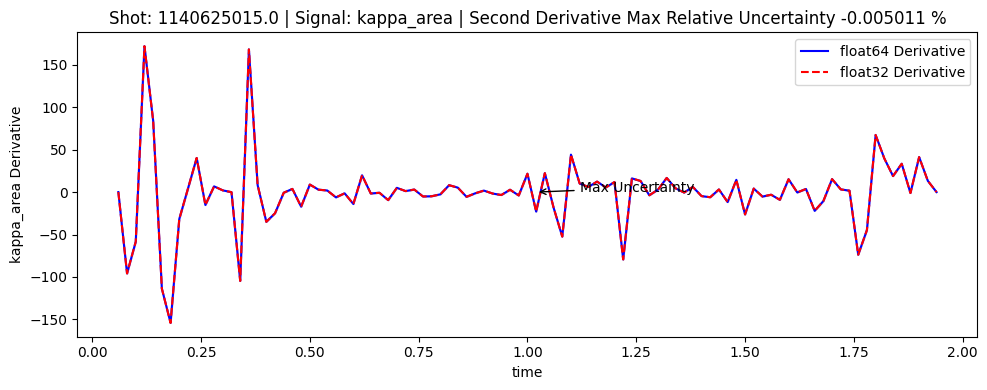

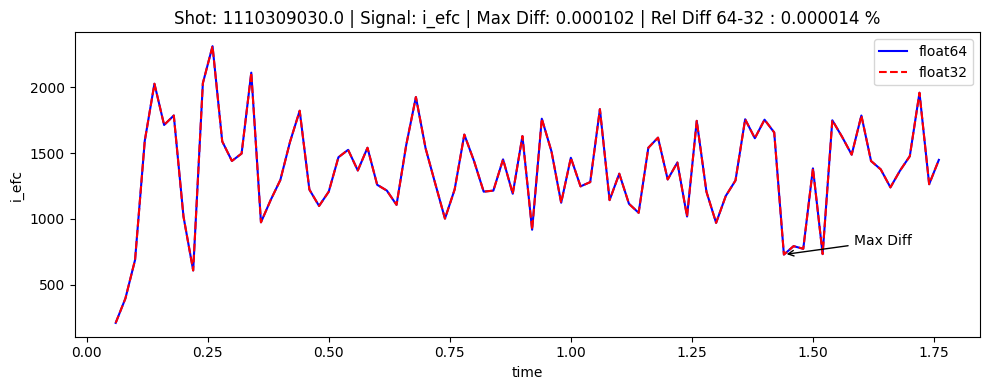

Max Uncertainty at time 1.4399999380111694 for shot 1110309030.0 with values: float32=0.5127121368227112, float64=0.0


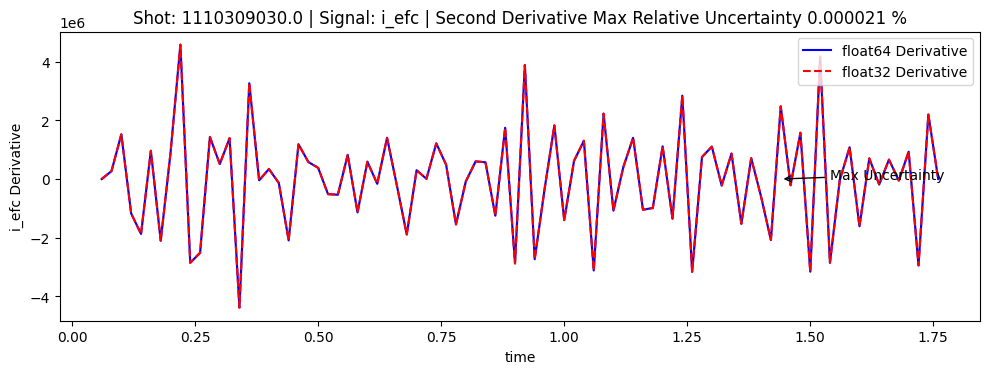

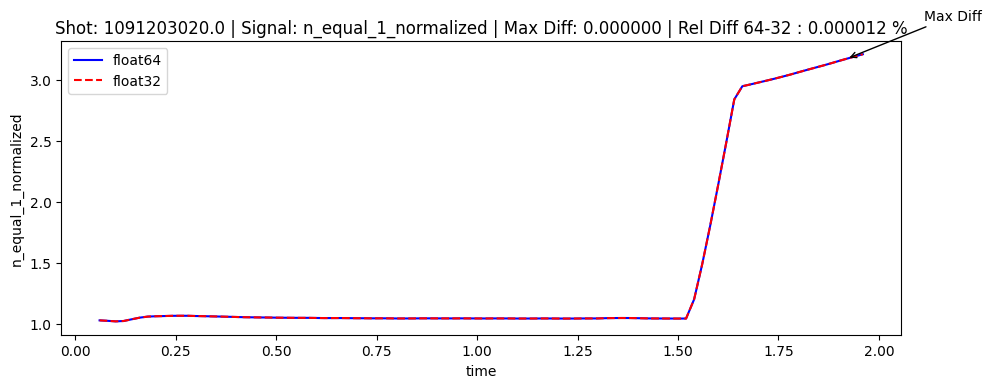

Max Uncertainty at time 1.919999957084656 for shot 1091203020.0 with values: float32=0.0019958673786581614, float64=0.0


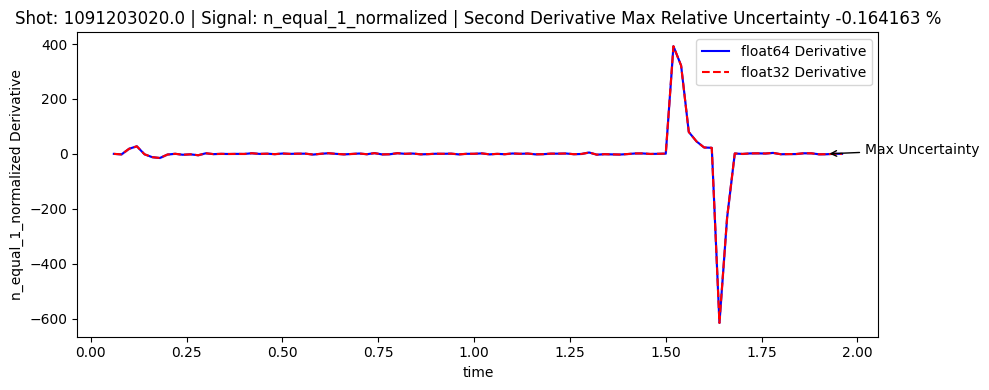

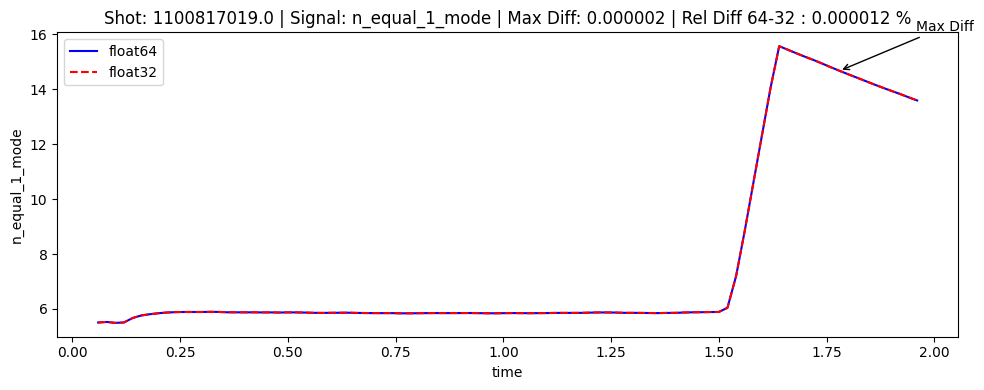

Max Uncertainty at time 1.779999852180481 for shot 1100817019.0 with values: float32=0.009615298827278344, float64=0.0


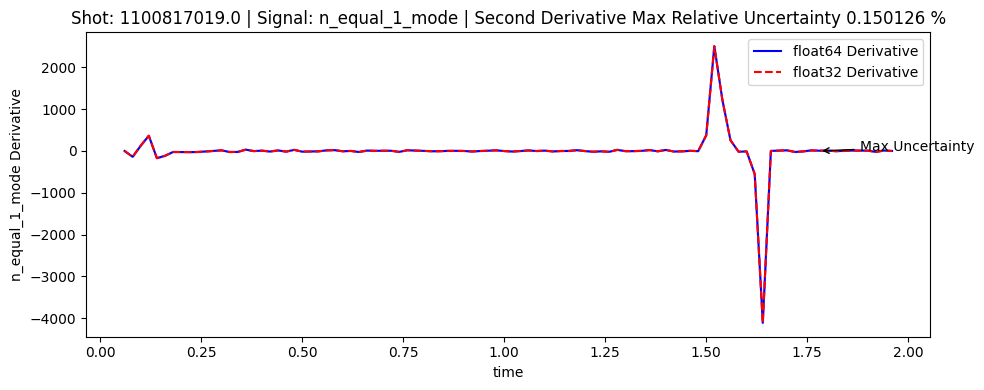

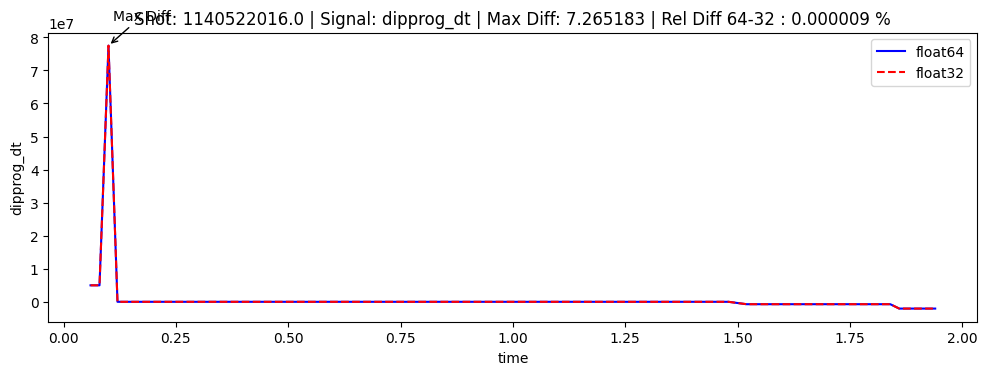

Max Uncertainty at time 0.0999999940395355 for shot 1140522016.0 with values: float32=36329.949771038766, float64=0.0


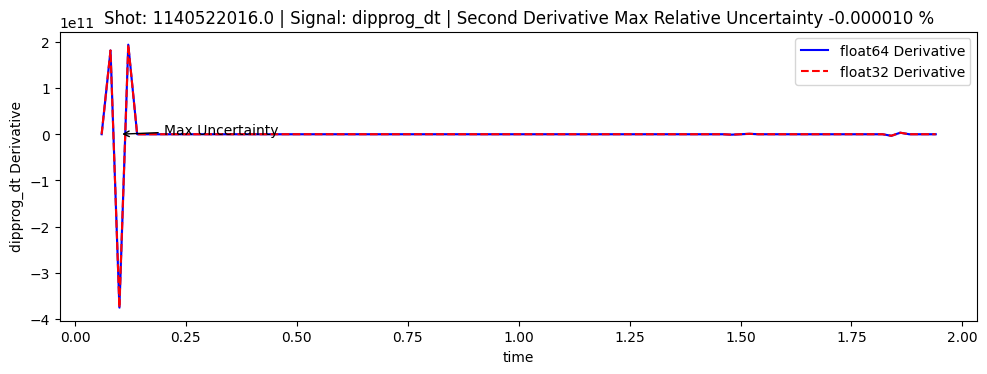

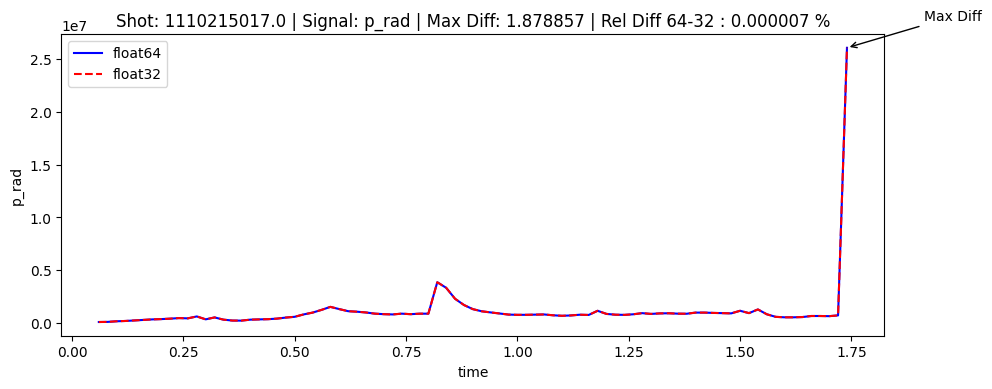

Max Uncertainty at time 1.71999990940094 for shot 1110215017.0 with values: float32=4697.384886450146, float64=0.0


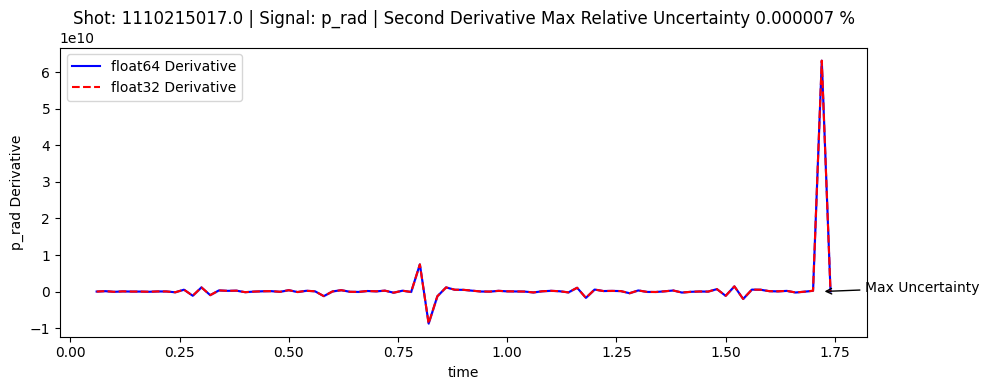

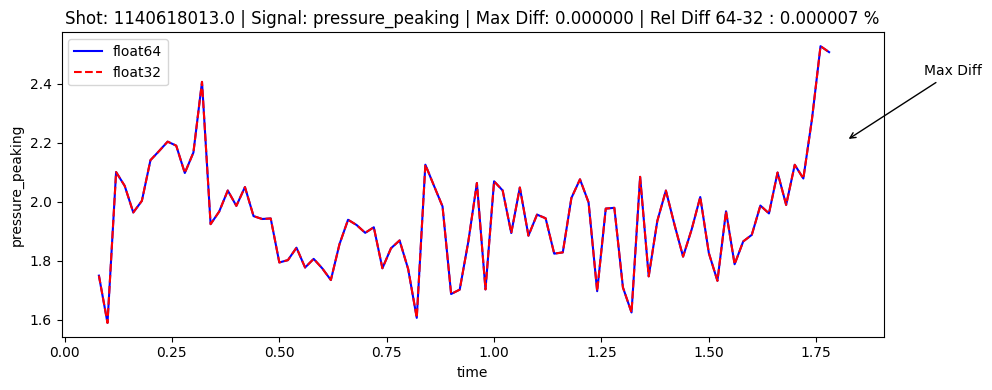

Max Uncertainty at time 1.459999918937683 for shot 1140618013.0 with values: float32=0.0005821670928874606, float64=0.0


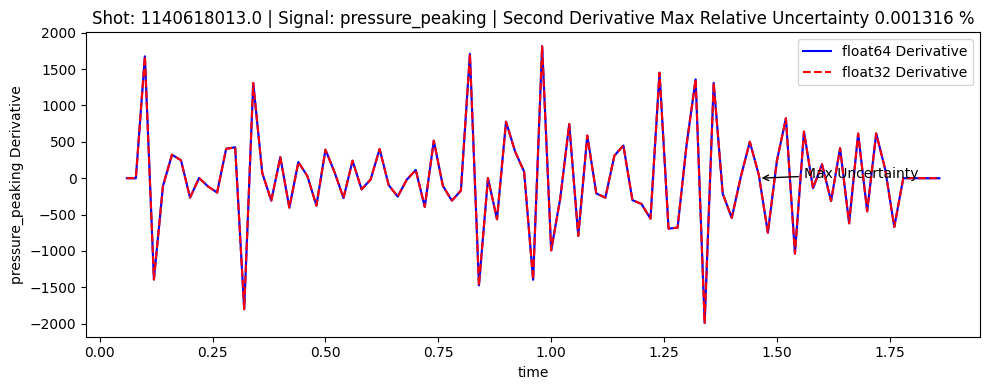

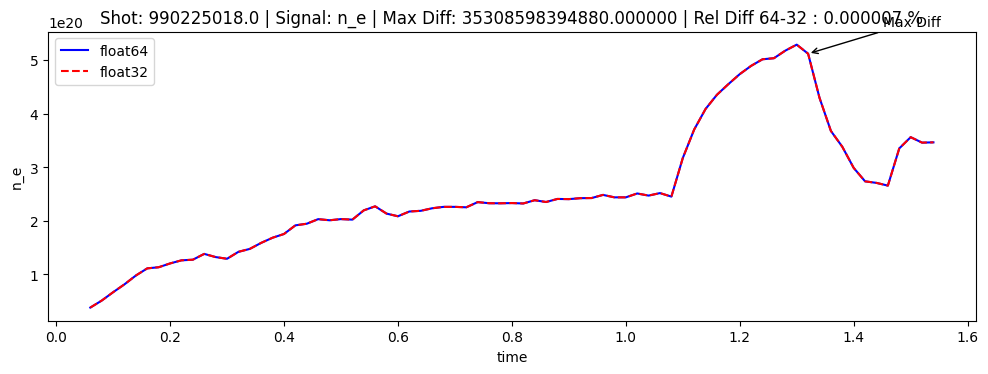

Max Uncertainty at time 1.21999990940094 for shot 990225018.0 with values: float32=1.992763720544561e+17, float64=0.0


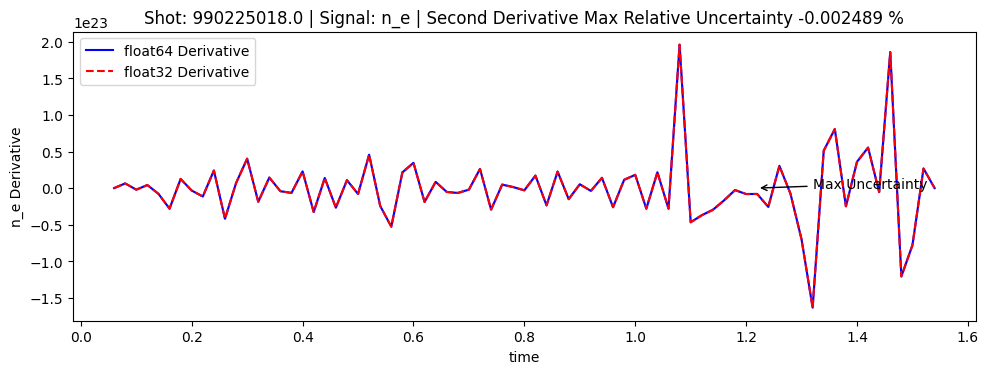

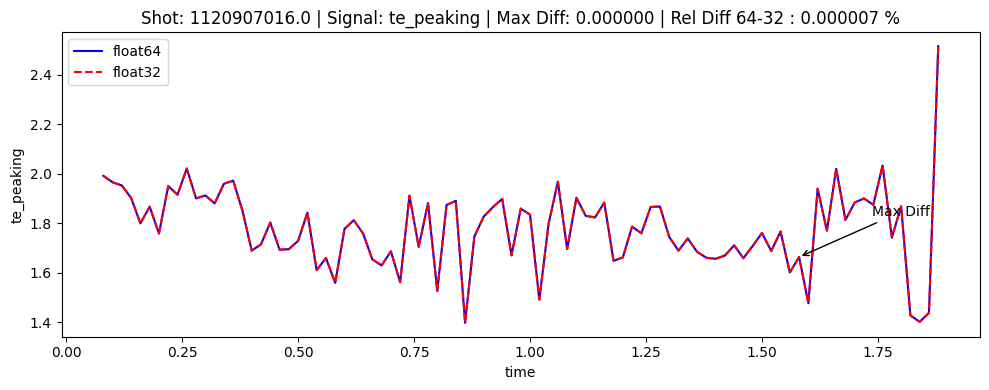

Max Uncertainty at time 1.579999923706055 for shot 1120907016.0 with values: float32=0.0005627257614245608, float64=0.0


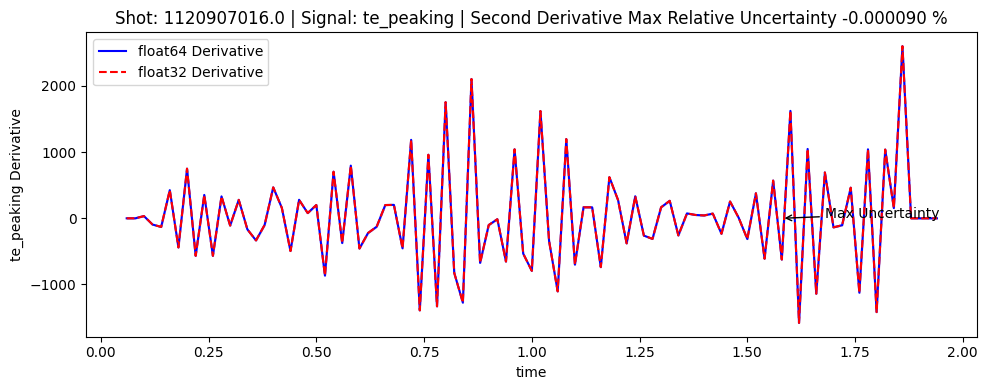

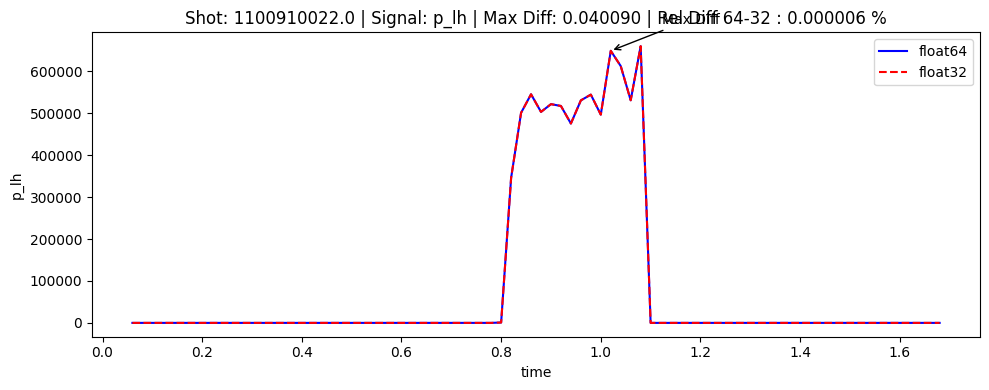

Max Uncertainty at time 1.0199999809265137 for shot 1100910022.0 with values: float32=206.65769143002936, float64=0.0


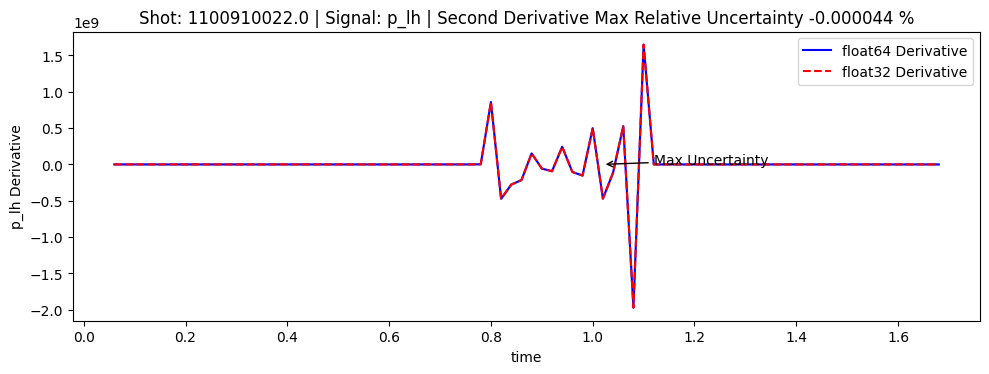

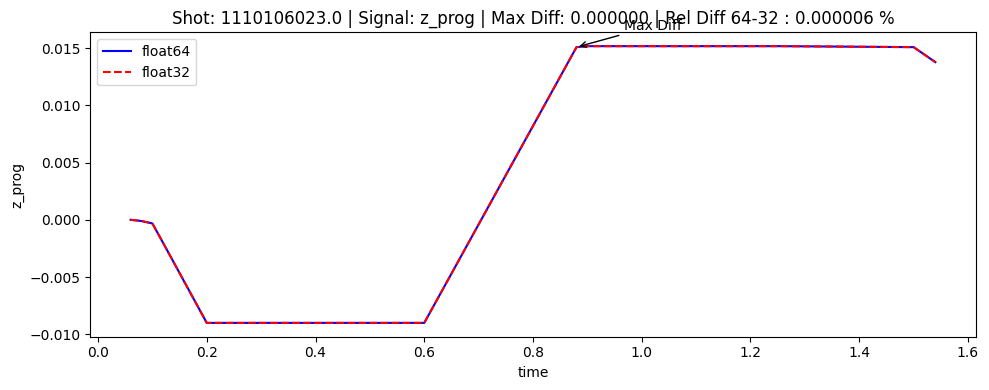

Max Uncertainty at time 0.85999995470047 for shot 1110106023.0 with values: float32=5.286720621244317e-06, float64=0.0


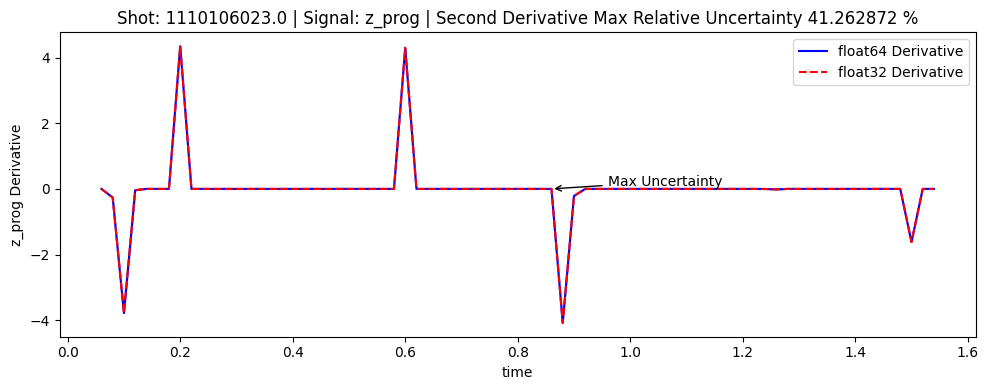

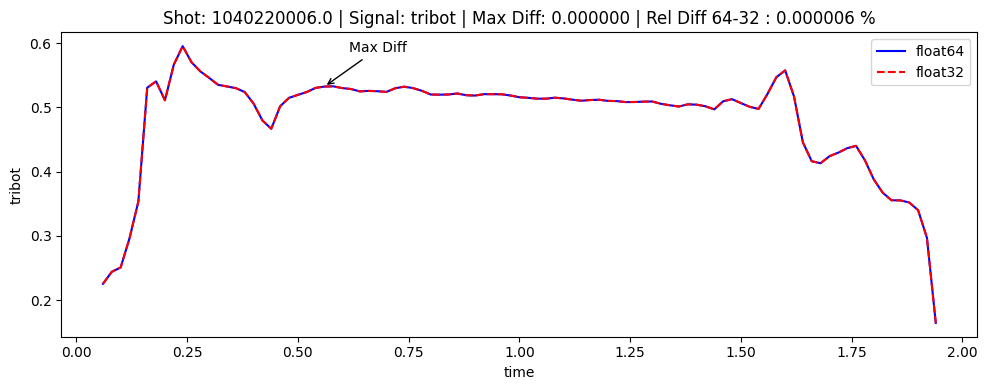

Max Uncertainty at time 0.800000011920929 for shot 1040220006.0 with values: float32=0.000153922589882317, float64=0.0


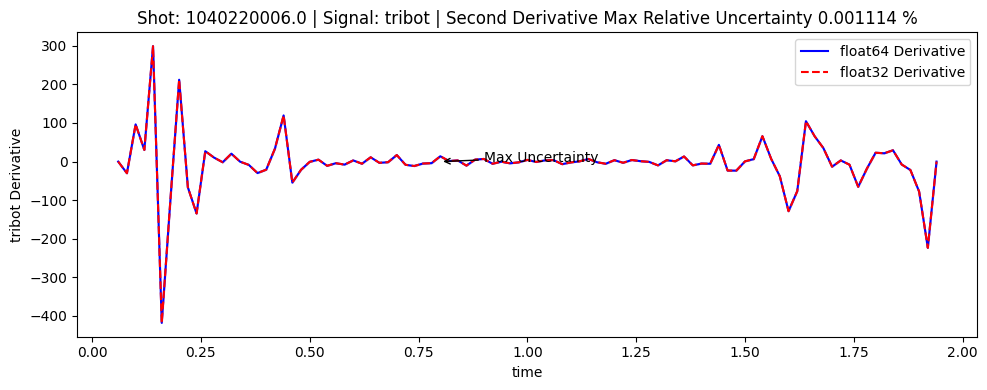

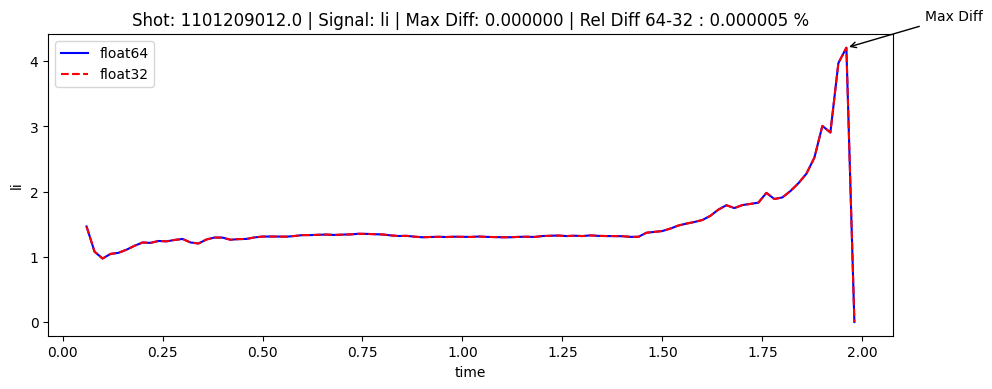

Max Uncertainty at time 1.959999918937683 for shot 1101209012.0 with values: float32=0.0010710196832453434, float64=0.0


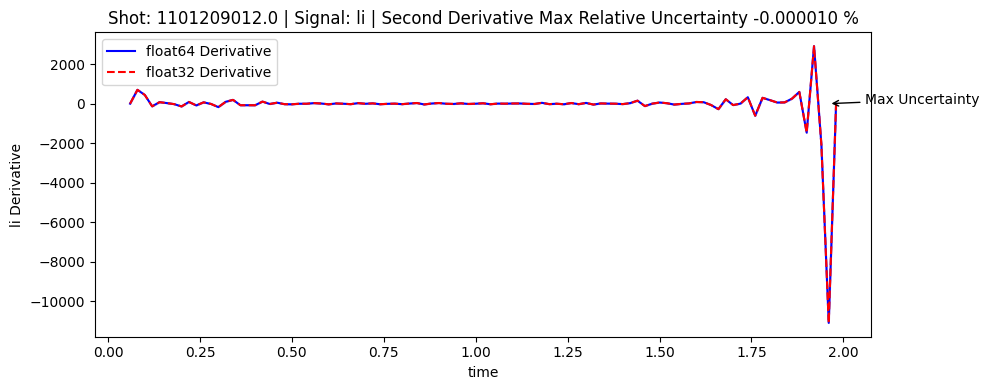

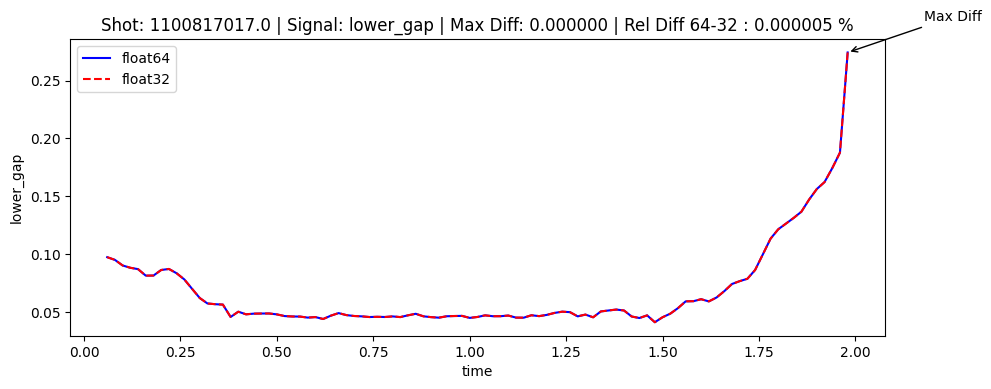

Max Uncertainty at time 1.959999918937683 for shot 1100817017.0 with values: float32=4.191905772448945e-05, float64=0.0


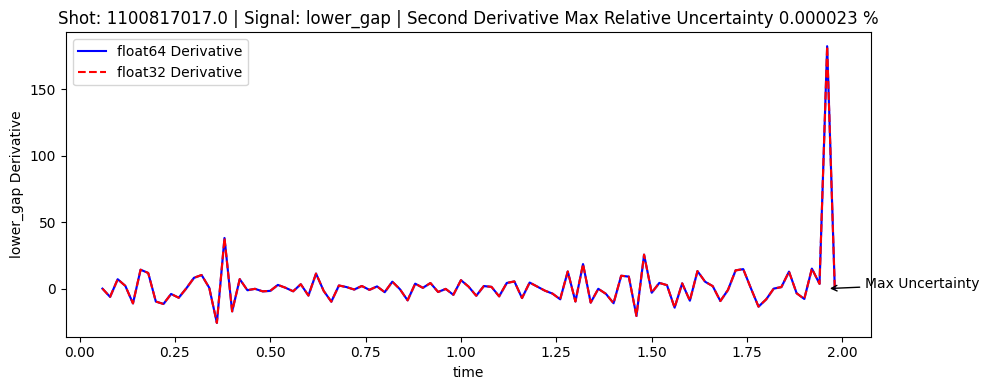

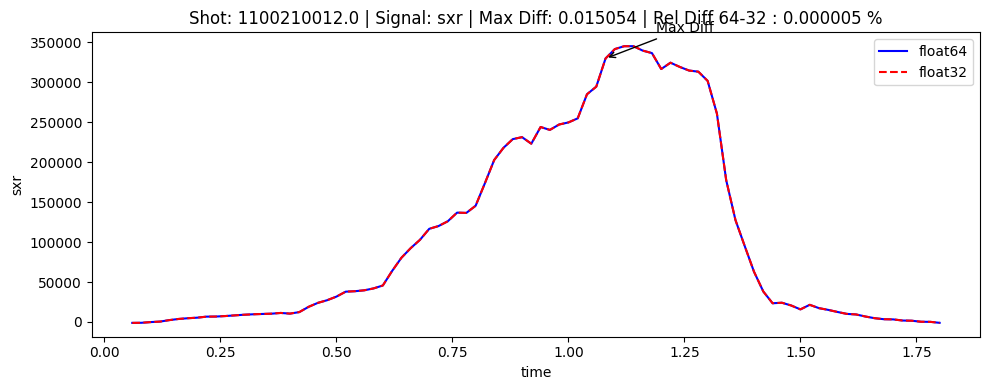

Max Uncertainty at time 1.079999923706055 for shot 1100210012.0 with values: float32=76.37641067507528, float64=0.0


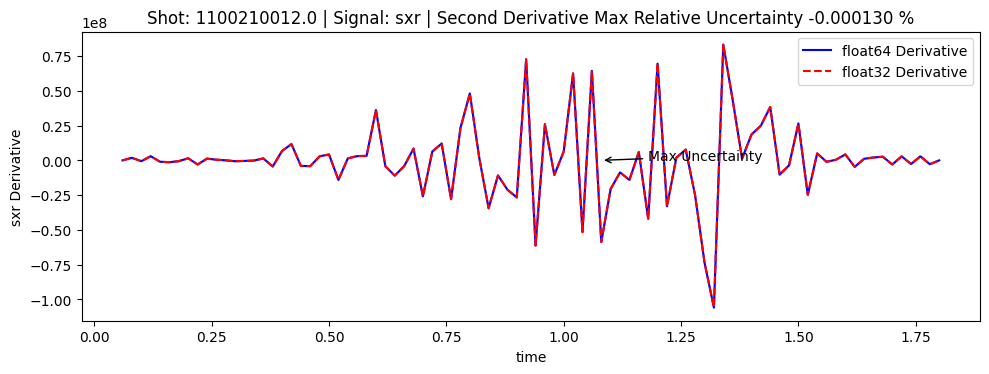

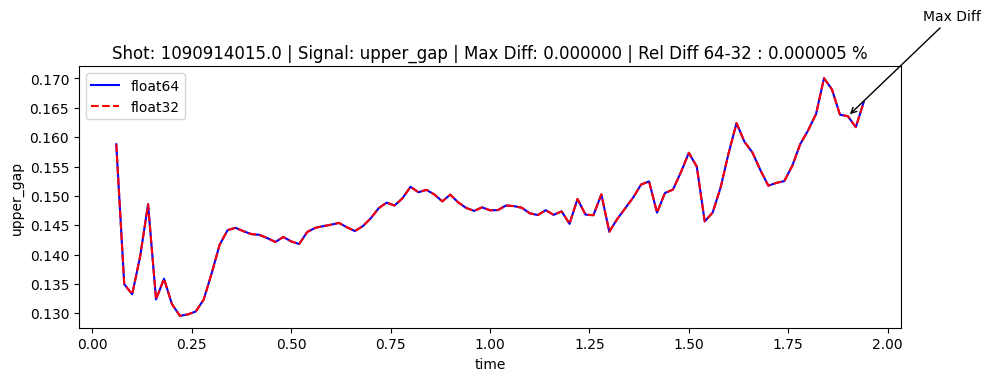

Max Uncertainty at time 1.8999998569488523 for shot 1090914015.0 with values: float32=4.071823773300524e-05, float64=0.0


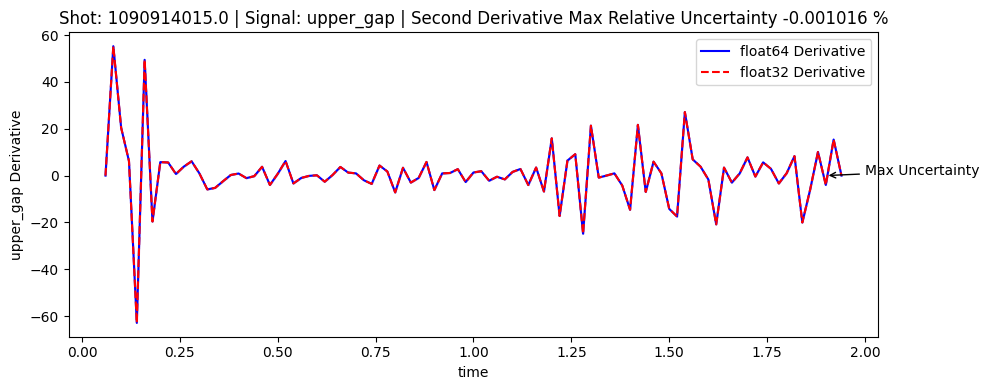

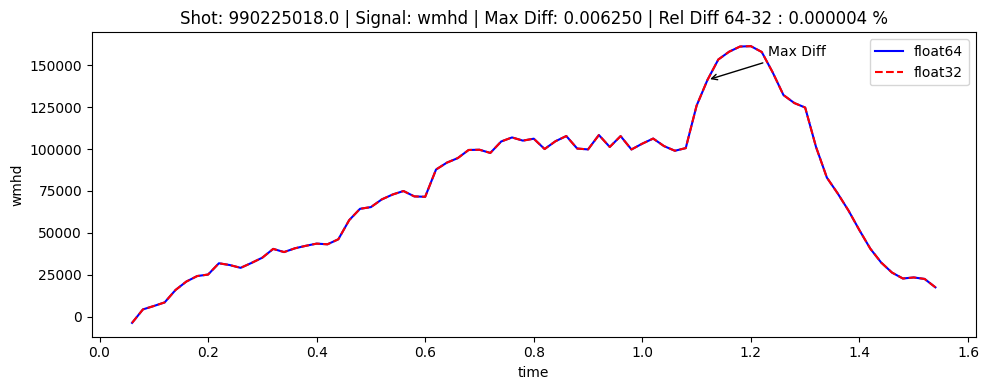

Max Uncertainty at time 1.119999885559082 for shot 990225018.0 with values: float32=32.02178225011977, float64=0.0


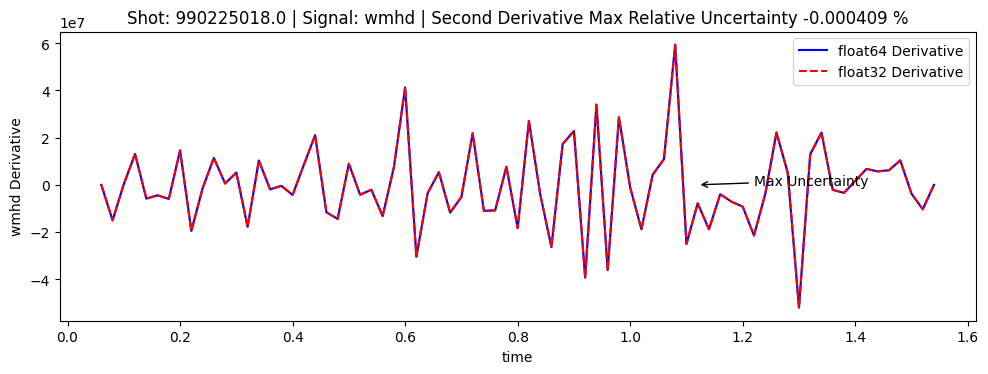

/tmp/ipykernel_833284/403621890.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


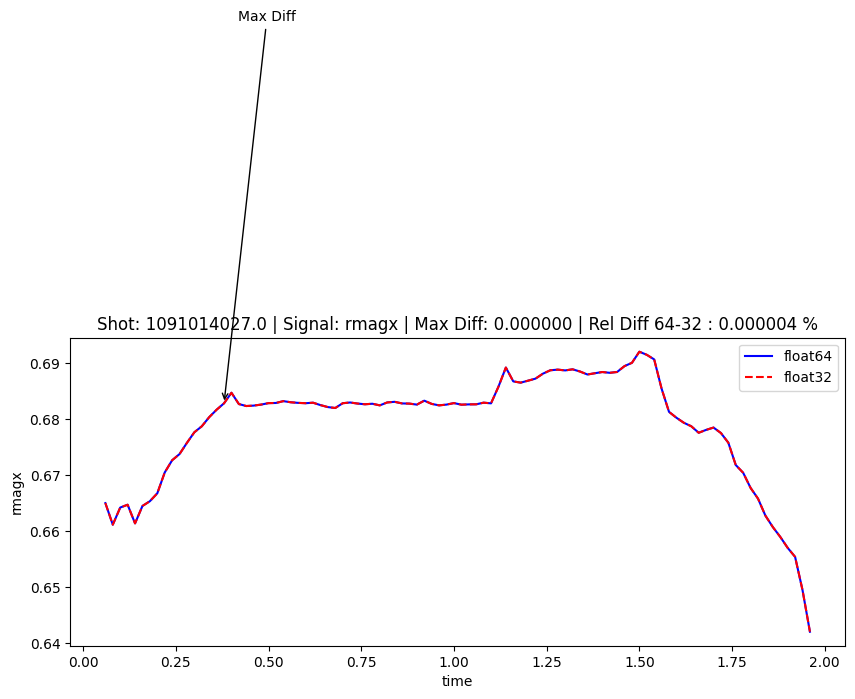

Max Uncertainty at time 0.2999999821186065 for shot 1091014027.0 with values: float32=0.0001676977851286213, float64=0.0


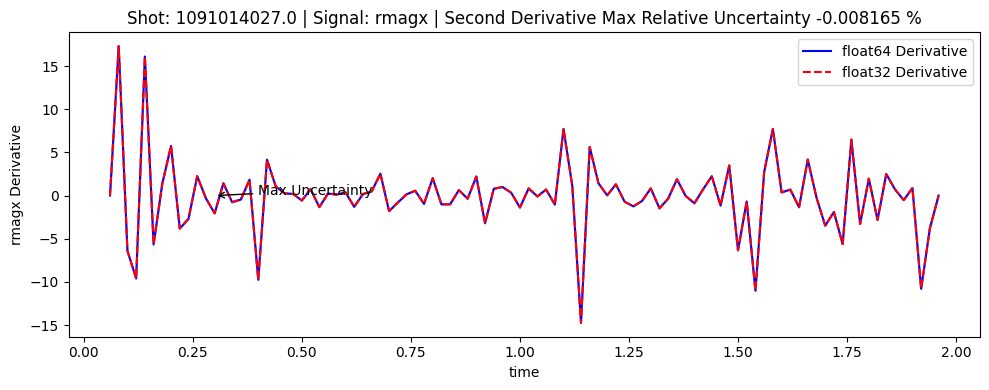

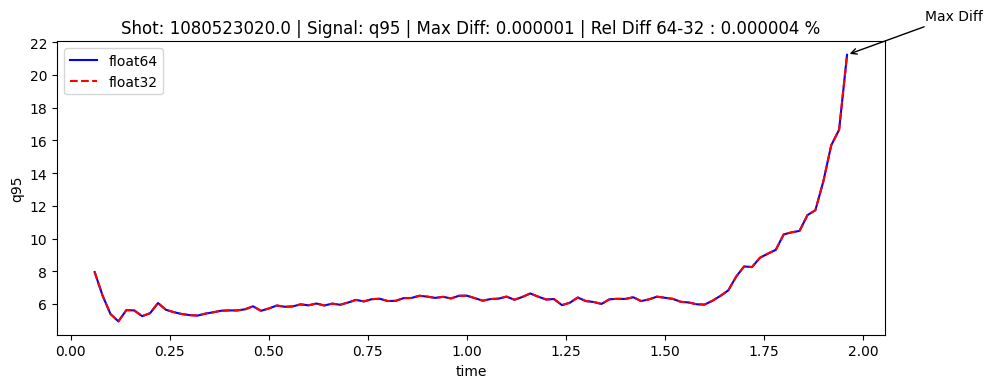

Max Uncertainty at time 1.9399999380111692 for shot 1080523020.0 with values: float32=0.0028093331832231678, float64=0.0


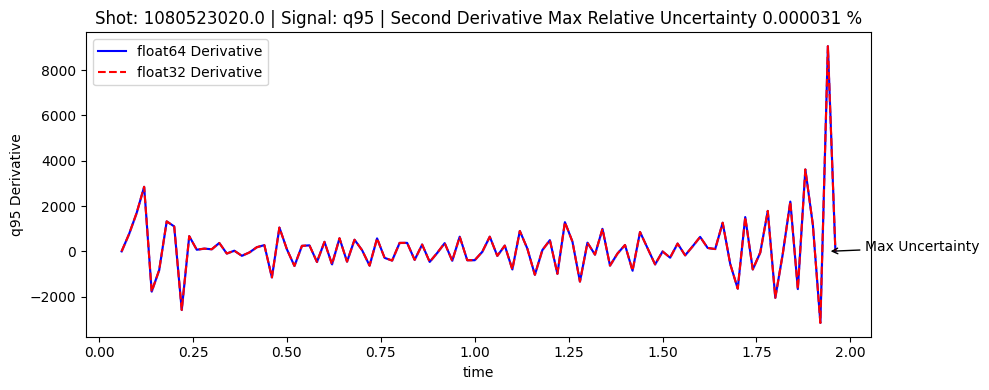

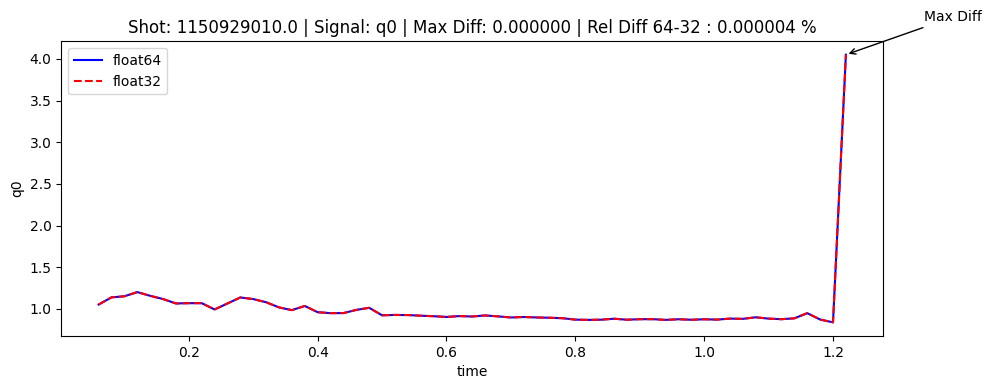

Max Uncertainty at time 1.1999999284744265 for shot 1150929010.0 with values: float32=0.00043069498409102896, float64=0.0


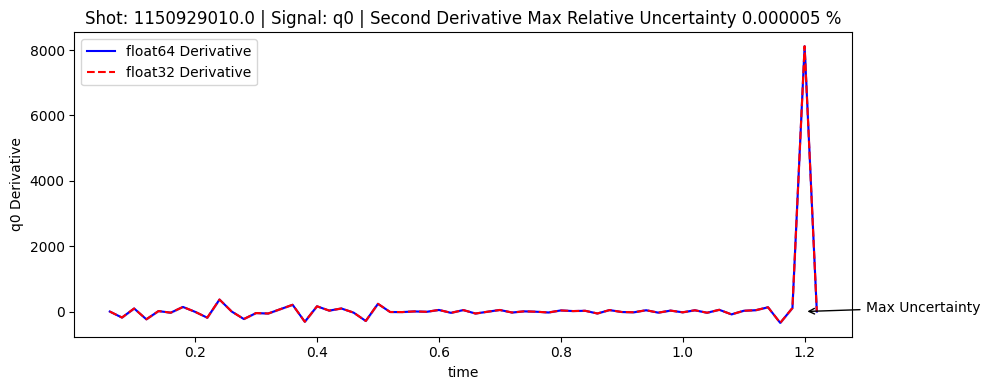

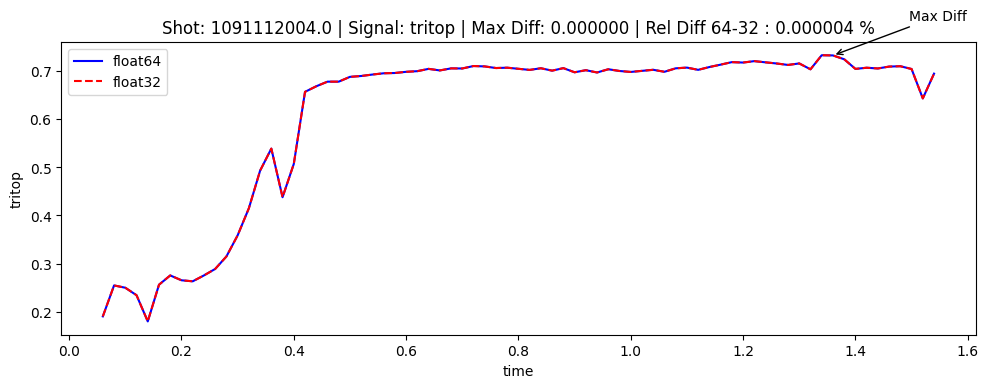

Max Uncertainty at time 1.3599998950958252 for shot 1091112004.0 with values: float32=0.00015688624044348998, float64=0.0


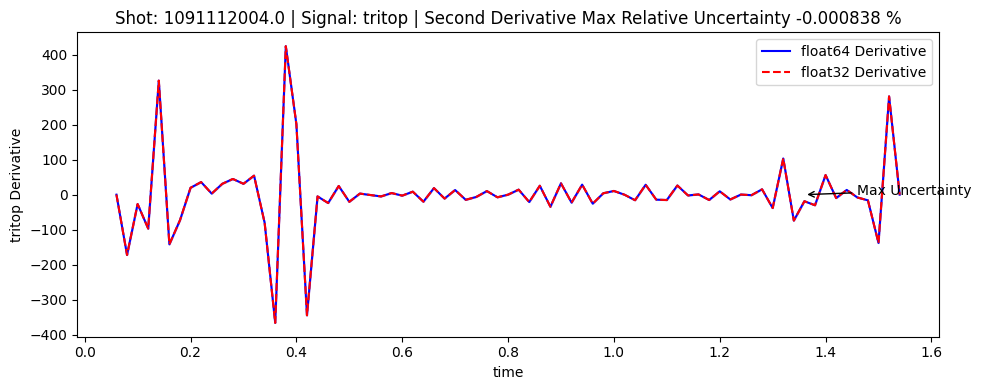

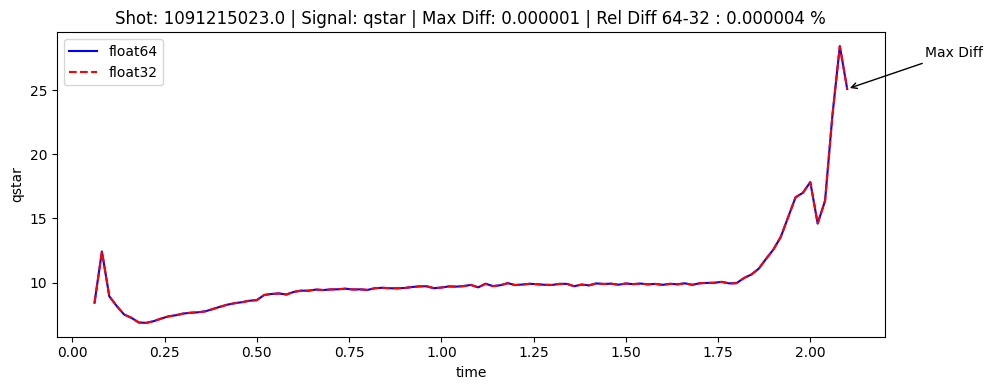

Max Uncertainty at time 1.8199999332427976 for shot 1091215023.0 with values: float32=0.0026504168310345503, float64=0.0


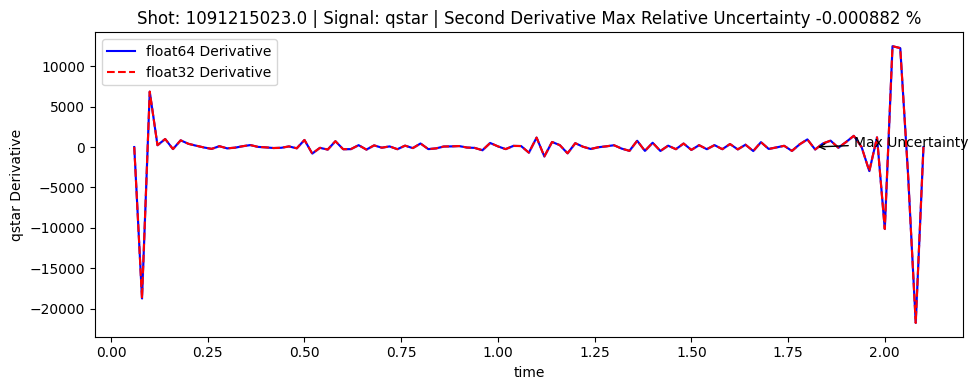

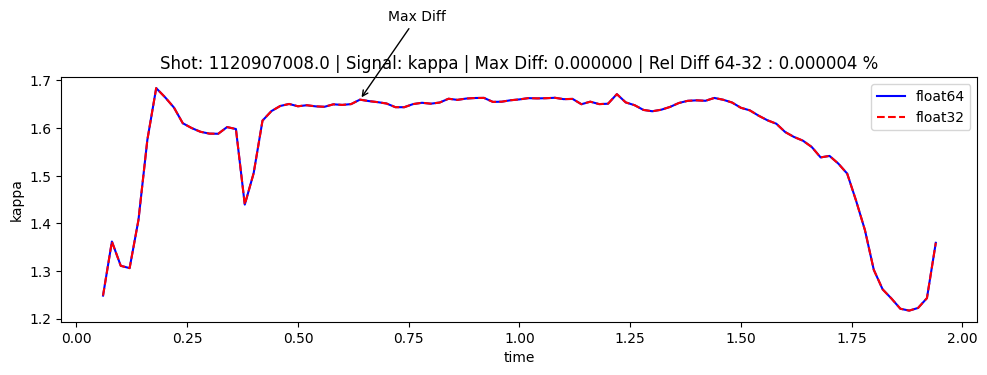

Max Uncertainty at time 0.6399999856948853 for shot 1120907008.0 with values: float32=0.00031653696263093706, float64=0.0


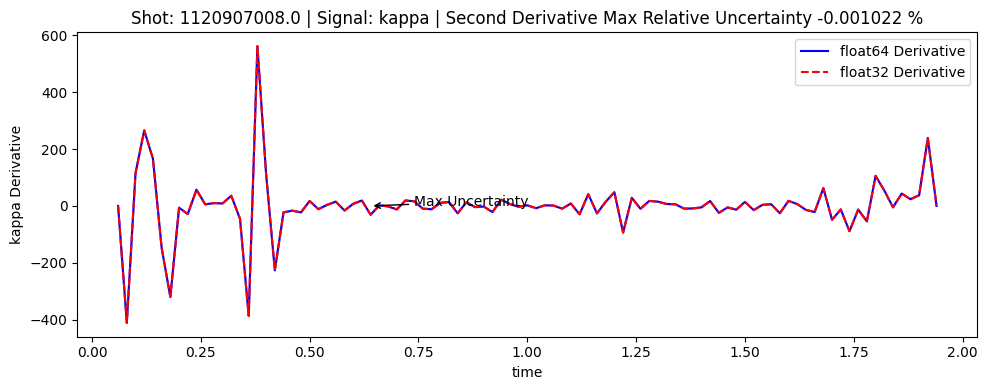

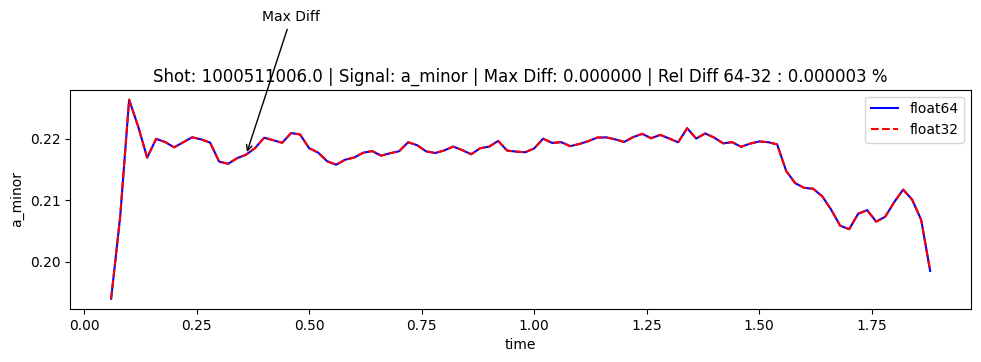

Max Uncertainty at time 0.3599999845027923 for shot 1000511006.0 with values: float32=4.156424622143282e-05, float64=0.0


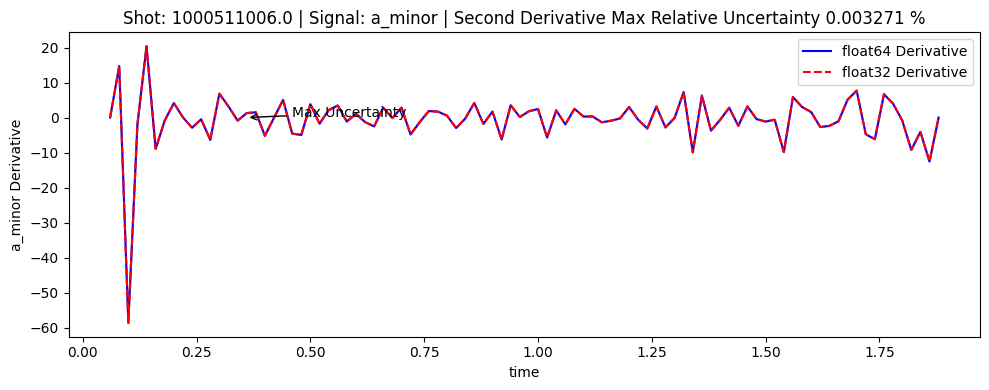

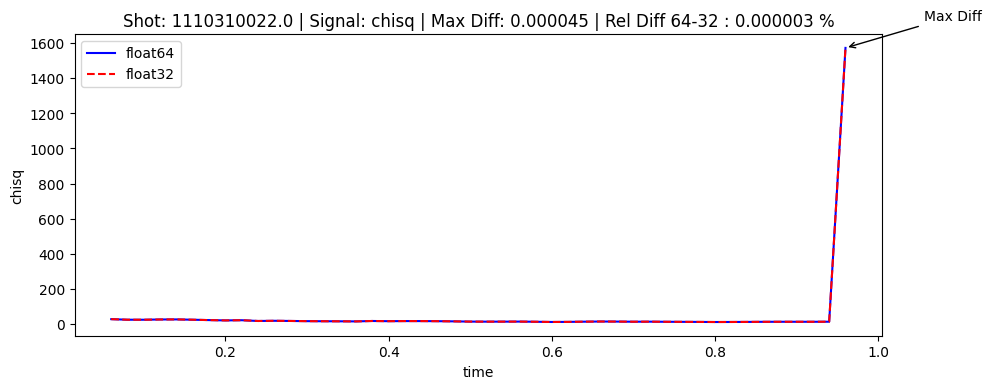

Max Uncertainty at time 0.9399999976158142 for shot 1110310022.0 with values: float32=0.11182246821984627, float64=0.0


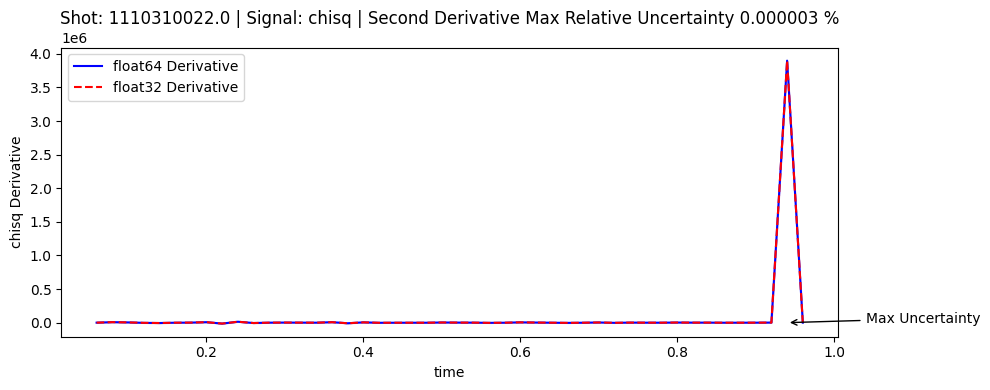

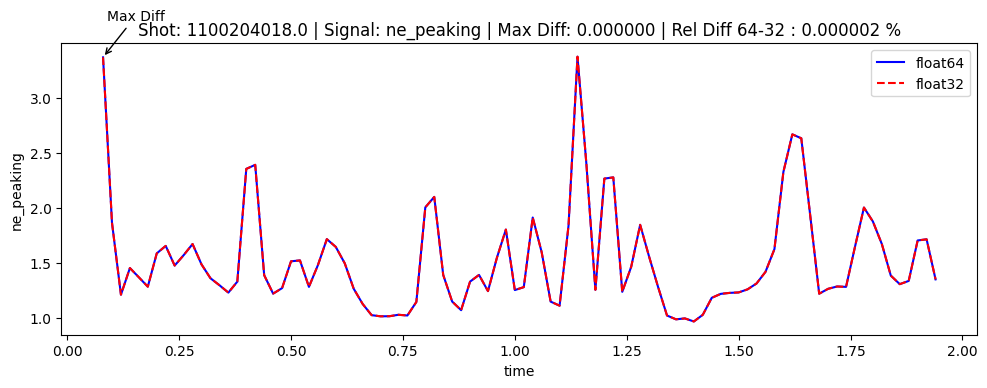

Max Uncertainty at time 0.0999999940395355 for shot 1100204018.0 with values: float32=0.00021510612735428503, float64=0.0


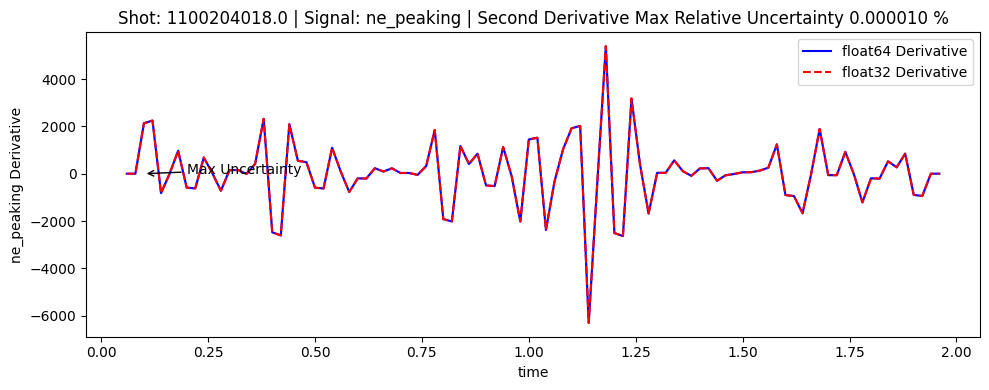

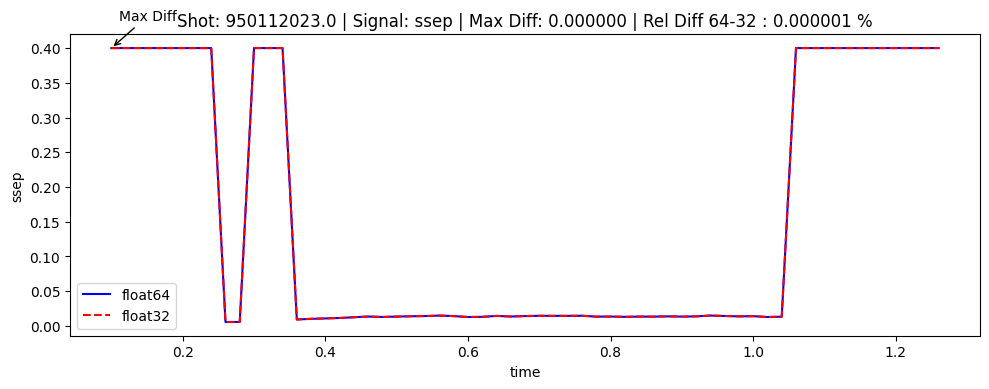

Max Uncertainty at time 1.2000004053115845 for shot 950112023.0 with values: float32=3.650031098270044e-05, float64=0.0


/tmp/ipykernel_833284/403621890.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  plt.title(f"Shot: {shot} | Signal: {signal} | Second Derivative Max Relative Uncertainty {100*np.abs(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")


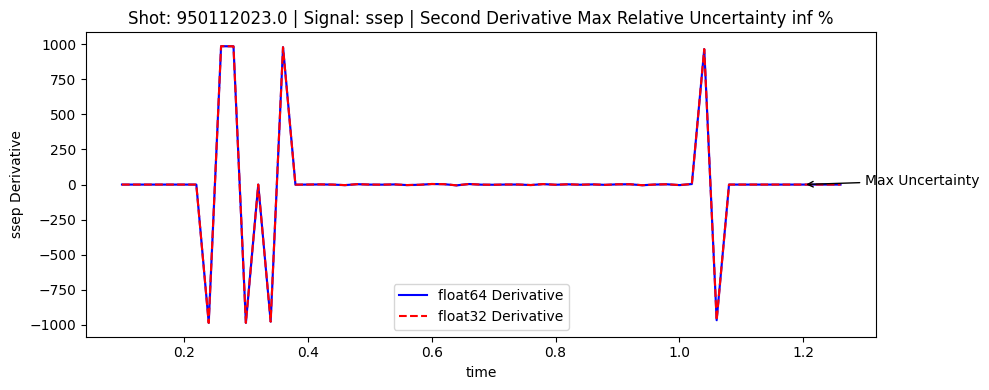

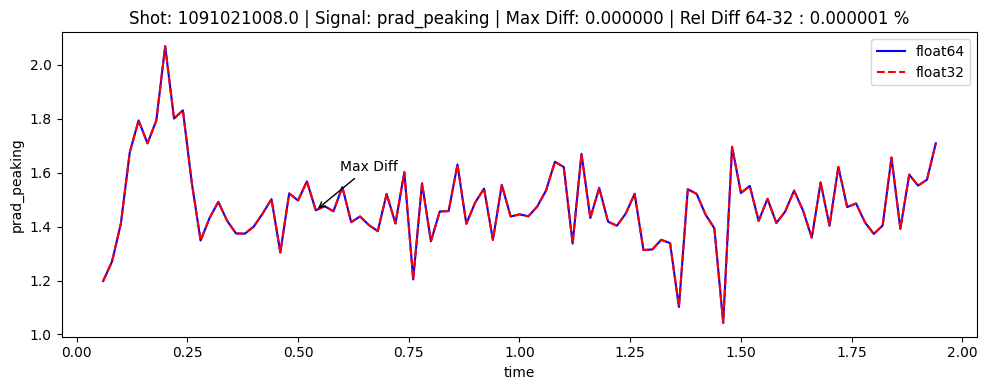

Max Uncertainty at time 0.5399999618530273 for shot 1091021008.0 with values: float32=5.317637071633392e-05, float64=0.0


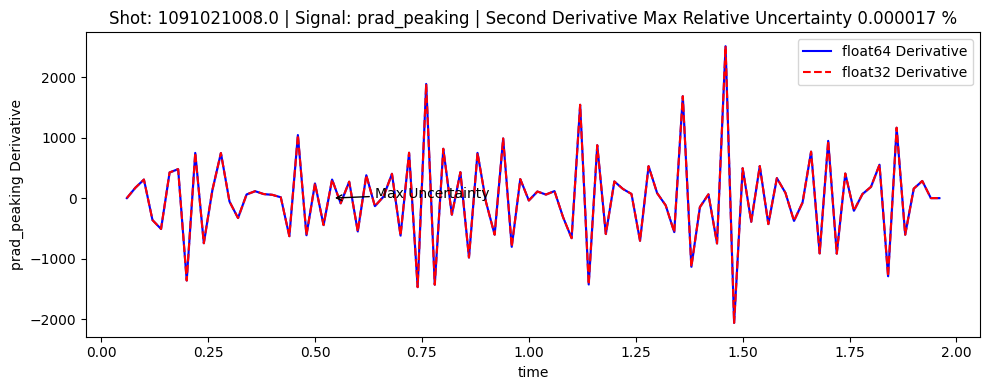

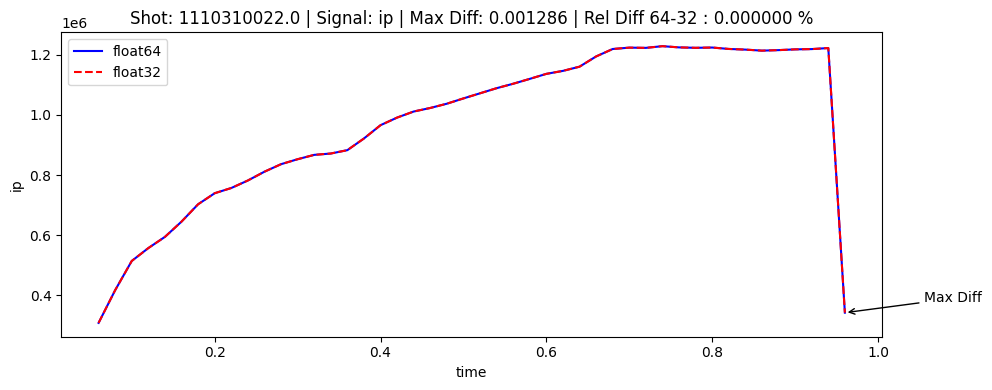

Max Uncertainty at time 0.9399999976158142 for shot 1110310022.0 with values: float32=3.2140103981704167, float64=0.0


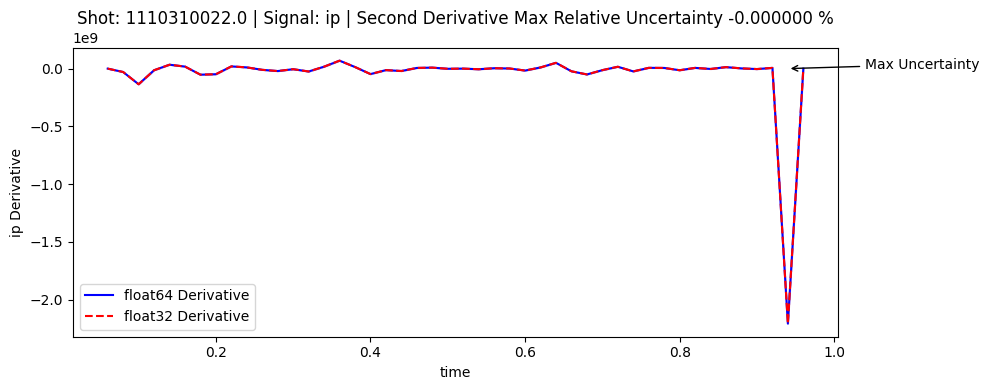

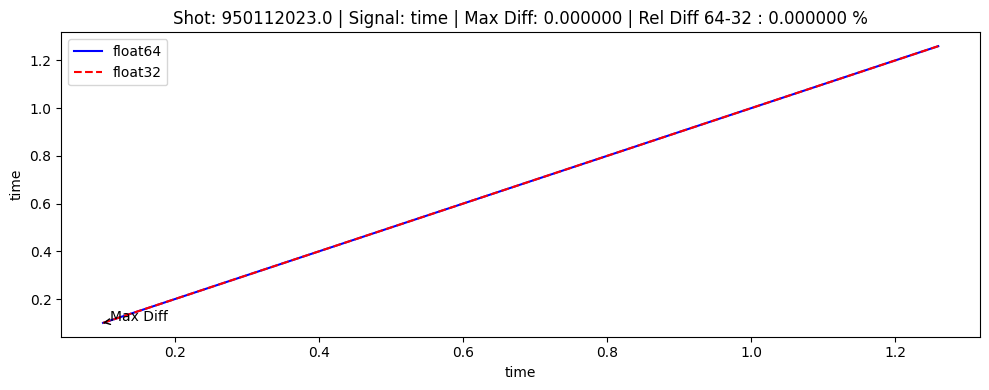

Max Uncertainty at time 0.1000000014901161 for shot 950112023.0 with values: float32=0.0, float64=0.0


/tmp/ipykernel_833284/403621890.py:64: RuntimeWarning: invalid value encountered in scalar divide
  plt.title(f"Shot: {shot} | Signal: {signal} | Second Derivative Max Relative Uncertainty {100*np.abs(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")
/tmp/ipykernel_833284/403621890.py:68: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


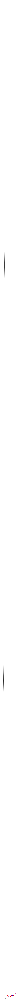

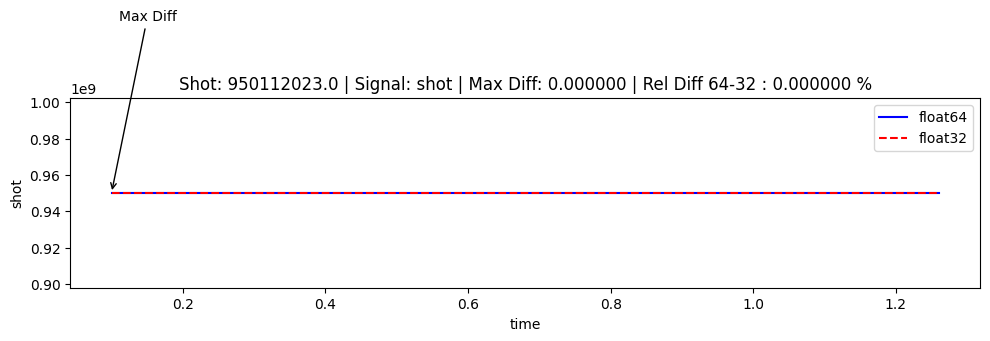

Max Uncertainty at time 0.1000000014901161 for shot 950112023.0 with values: float32=0.0, float64=0.0


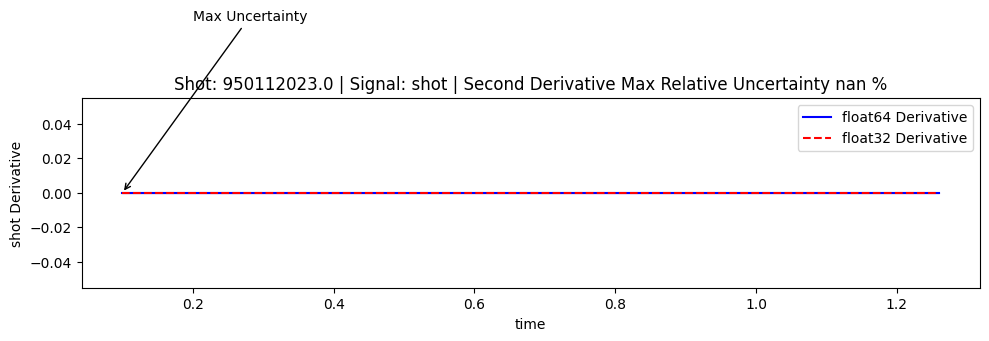

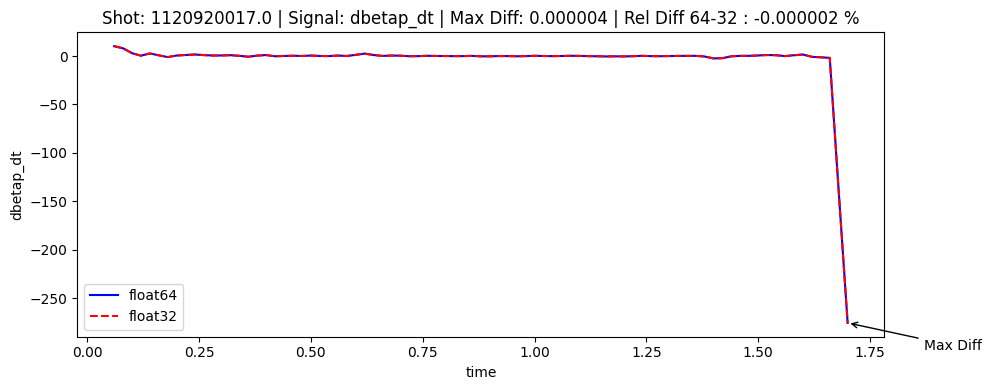

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=0.014729275495054088, float64=0.0


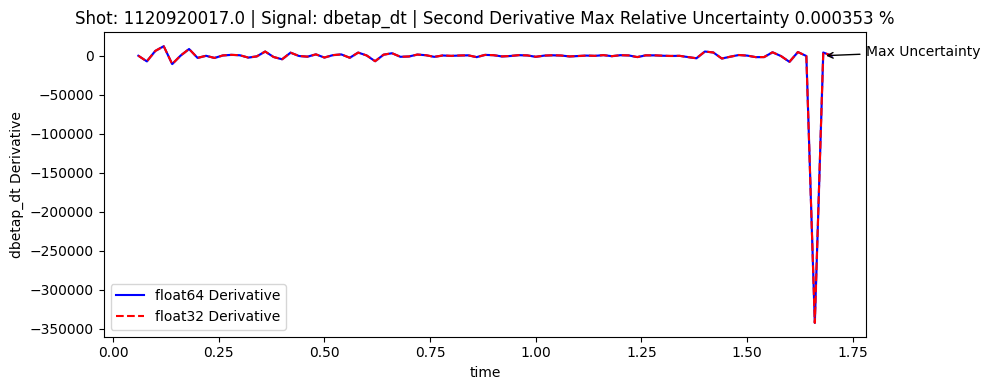

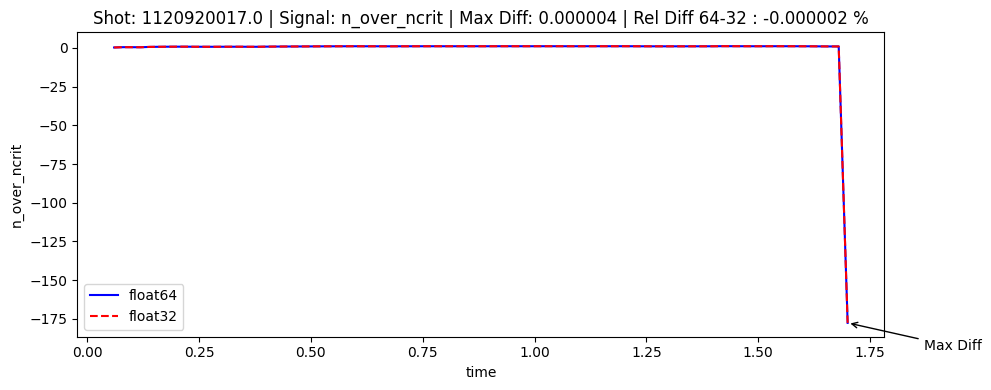

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=0.009925157781102846, float64=0.0


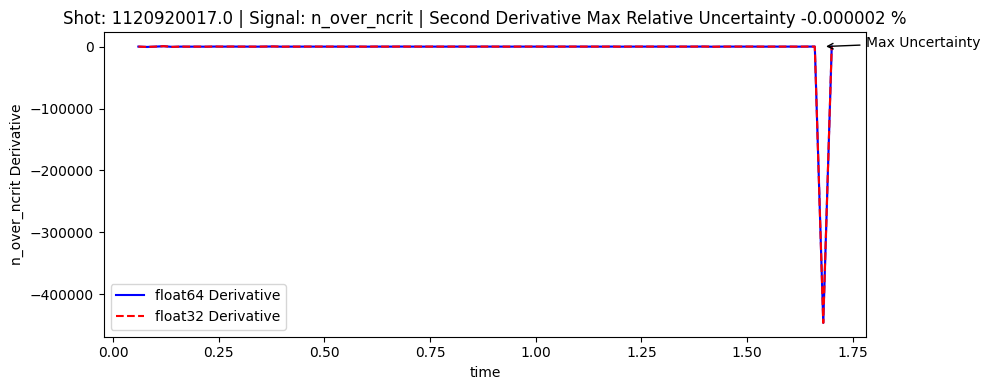

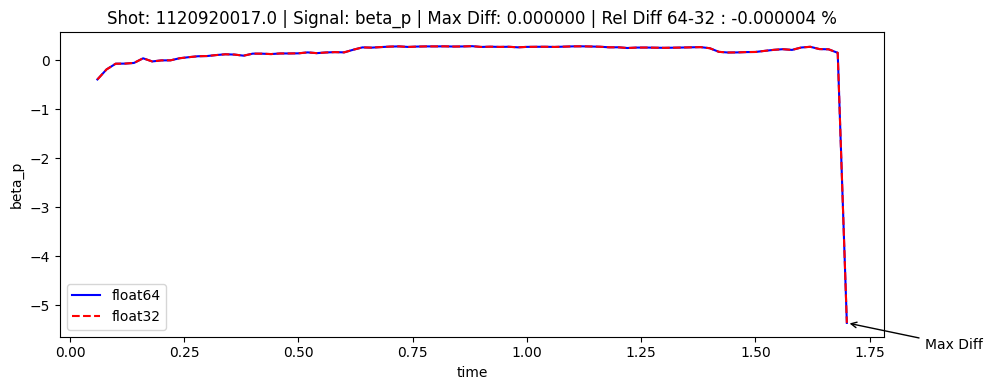

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=0.0005339083805582479, float64=0.0


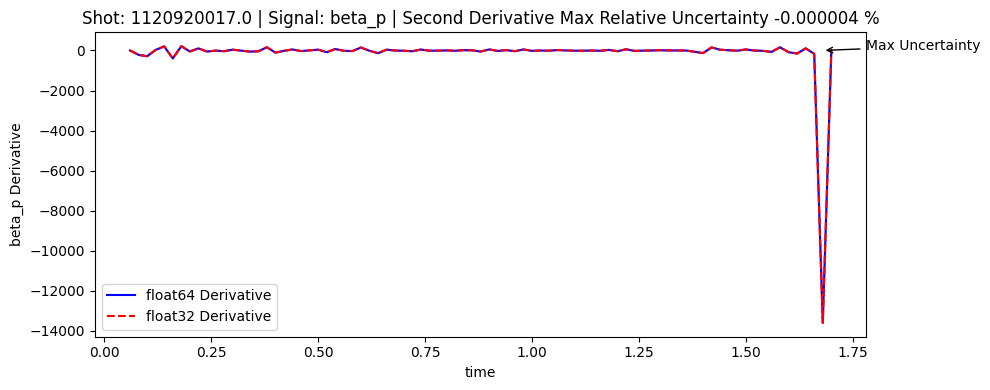

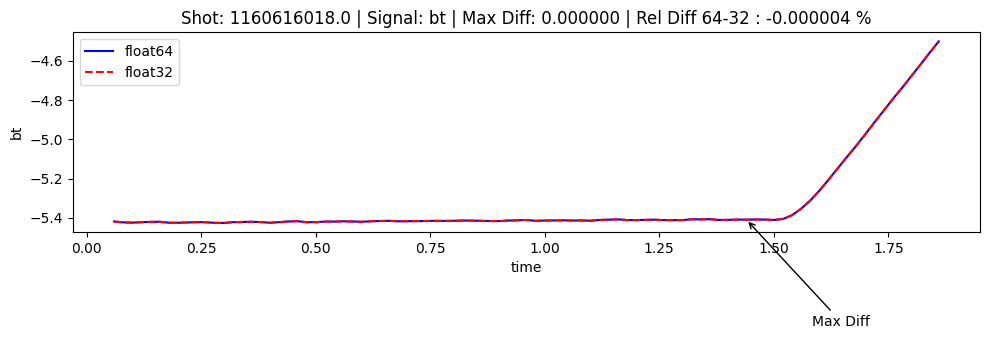

Max Uncertainty at time 1.4399999380111694 for shot 1160616018.0 with values: float32=0.0014341773474101976, float64=0.0


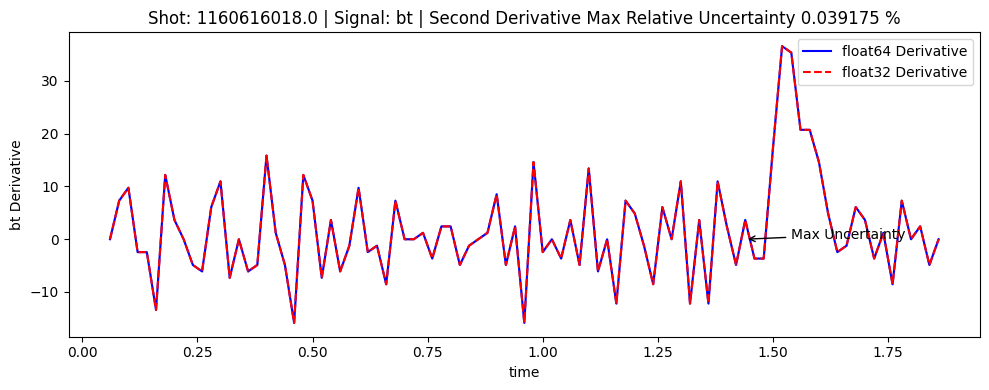

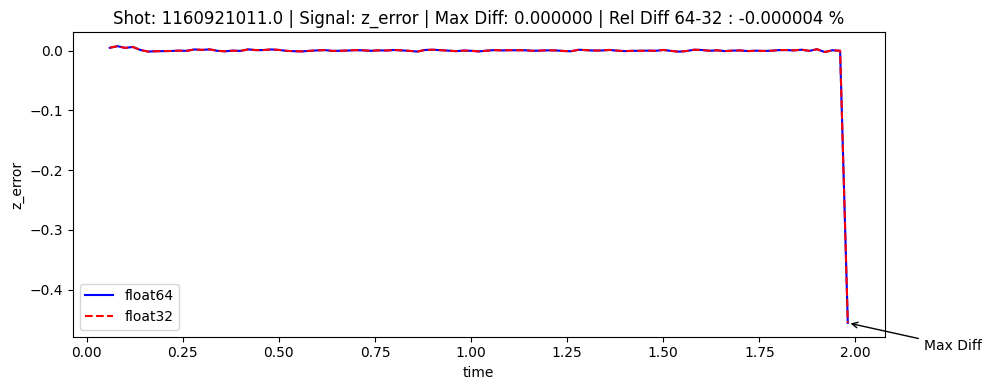

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=4.992832273255242e-05, float64=0.0


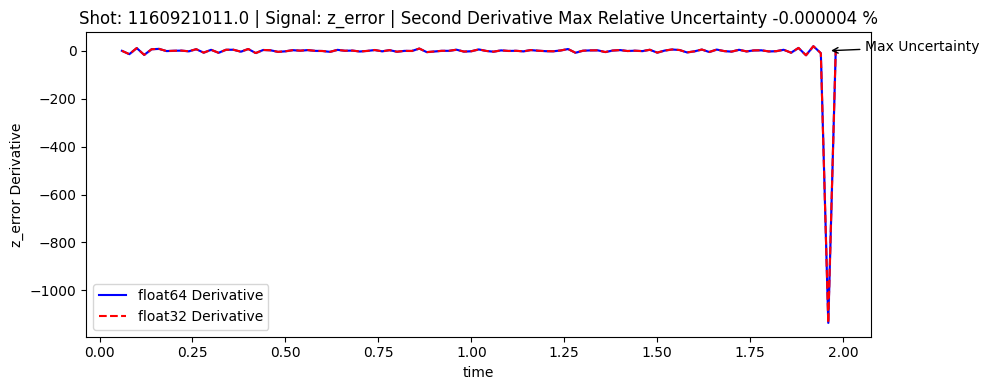

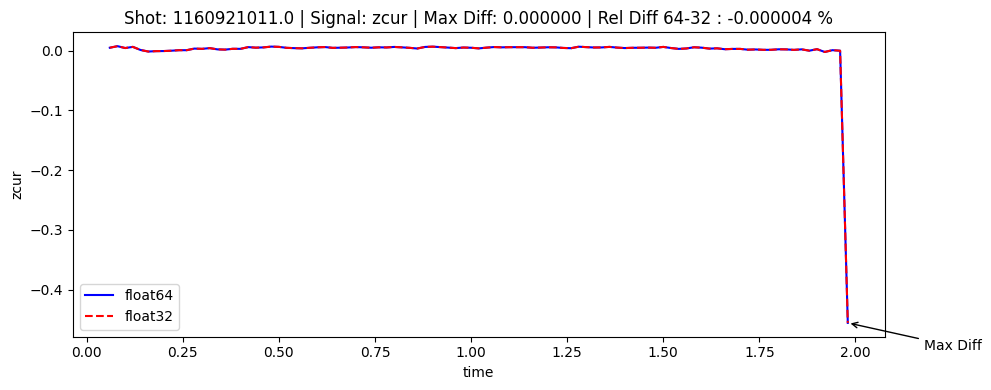

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=4.992816660768801e-05, float64=0.0


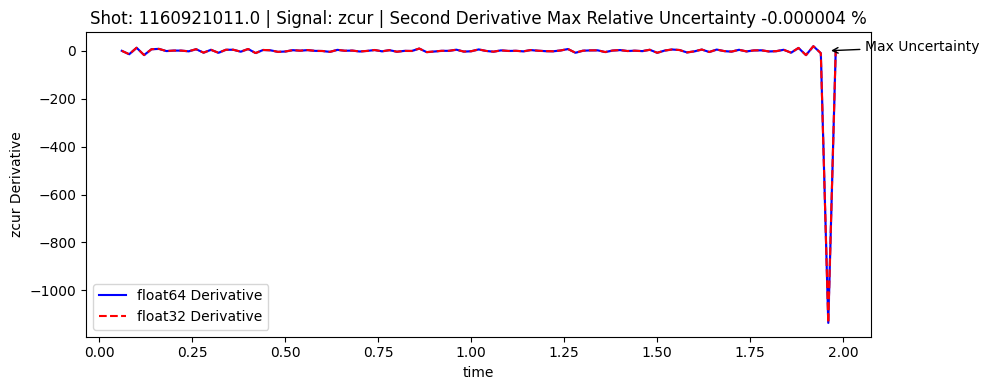

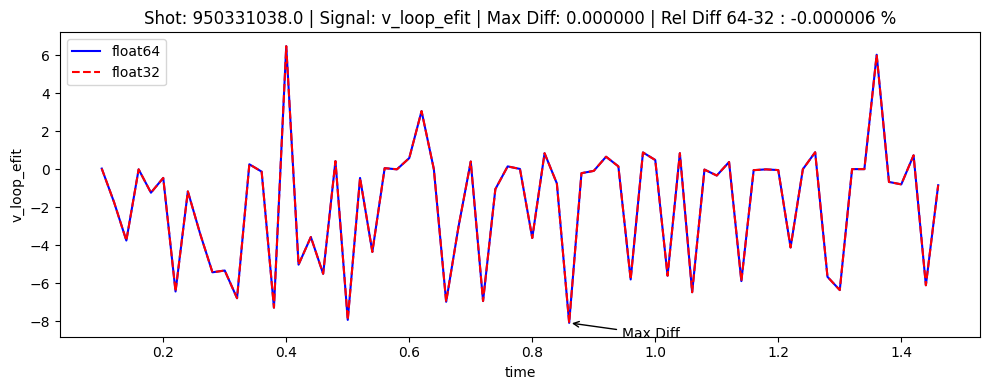

Max Uncertainty at time 0.8600003123283386 for shot 950331038.0 with values: float32=0.002373991403366546, float64=0.0


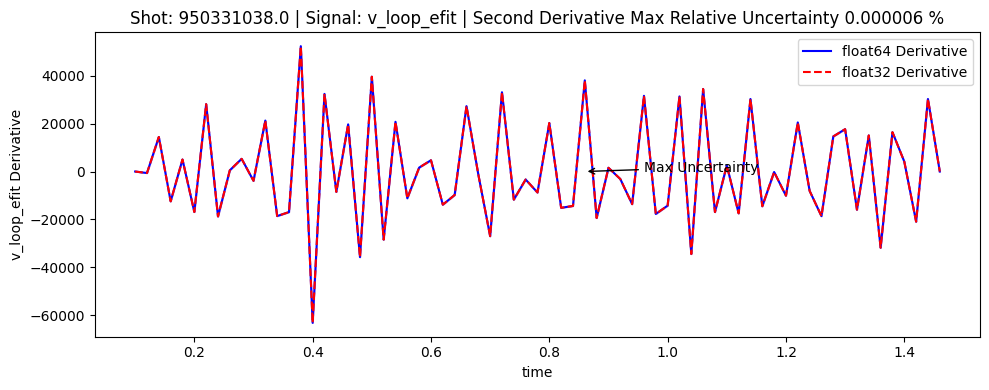

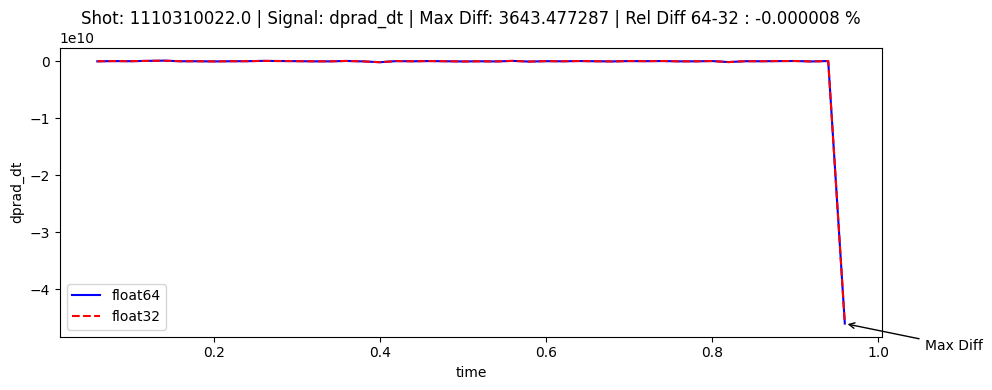

Max Uncertainty at time 0.9399999976158142 for shot 1110310022.0 with values: float32=9111089.306692477, float64=0.0


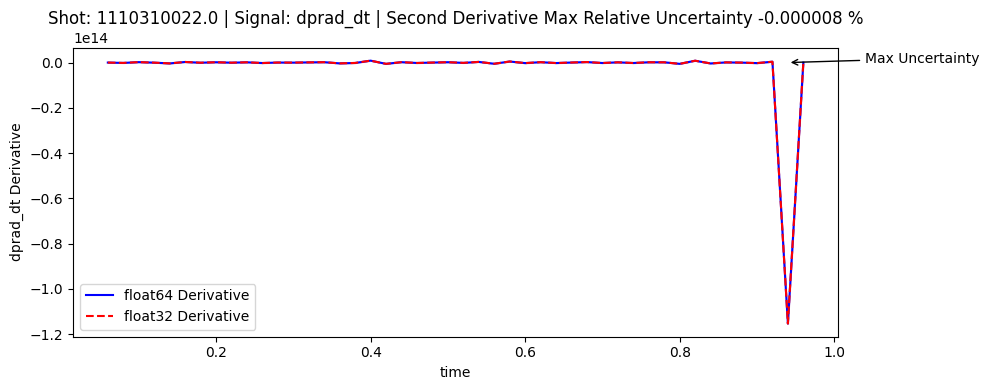

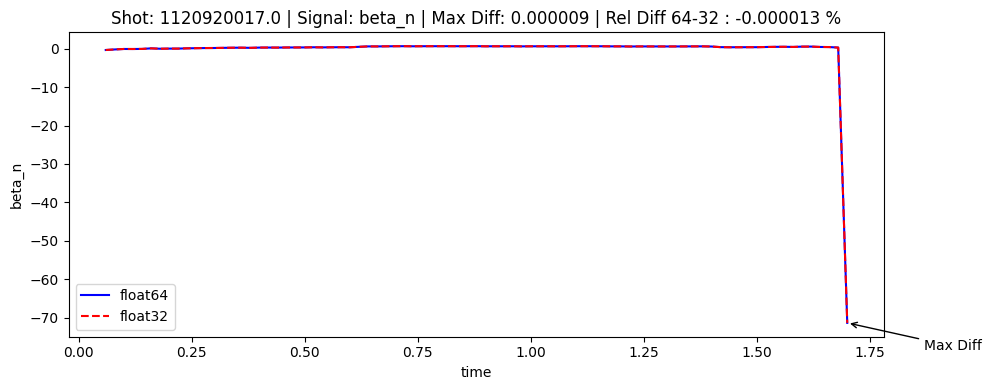

Max Uncertainty at time 1.6799999475479126 for shot 1120920017.0 with values: float32=0.023313536780918524, float64=0.0


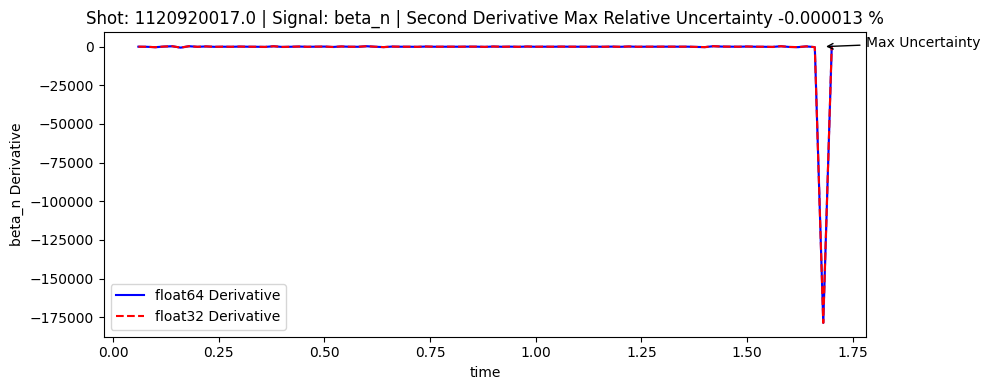

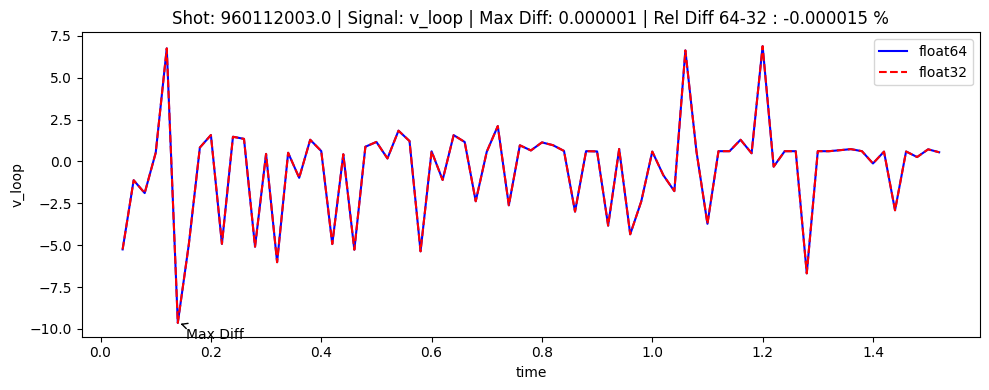

Max Uncertainty at time 0.1399999856948852 for shot 960112003.0 with values: float32=0.007463742757936872, float64=0.0


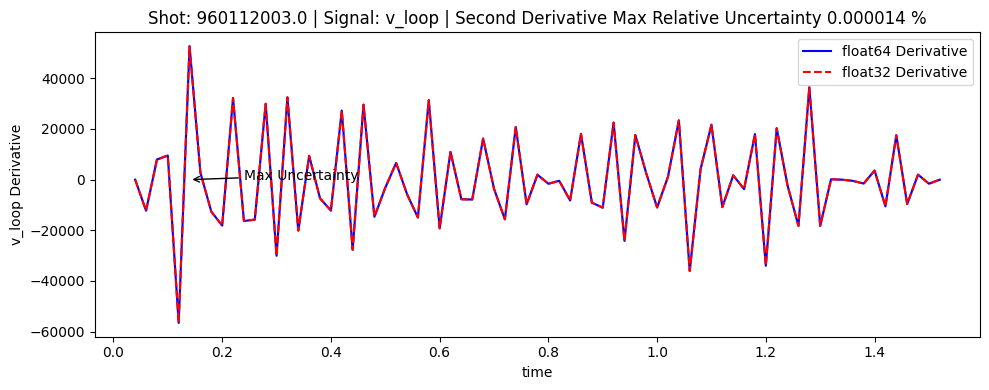

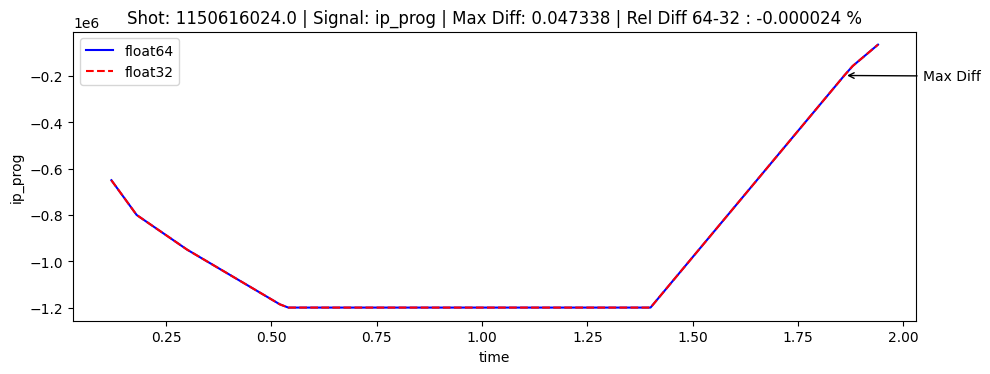

Max Uncertainty at time 1.8399999141693115 for shot 1150616024.0 with values: float32=277.3771858676557, float64=0.0


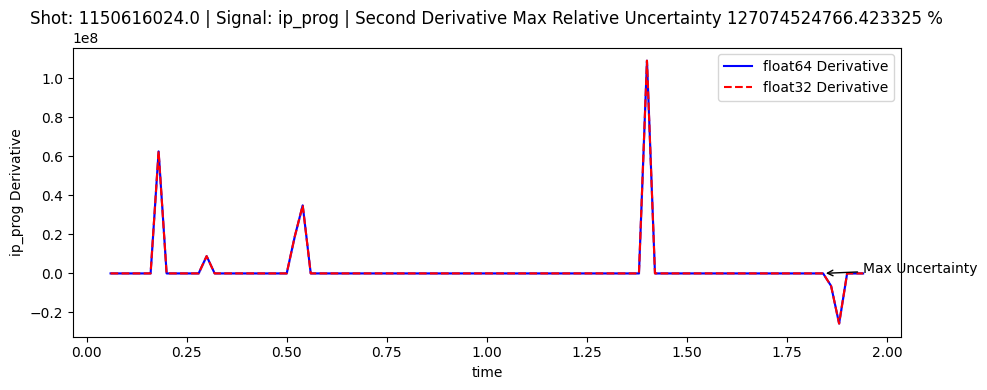

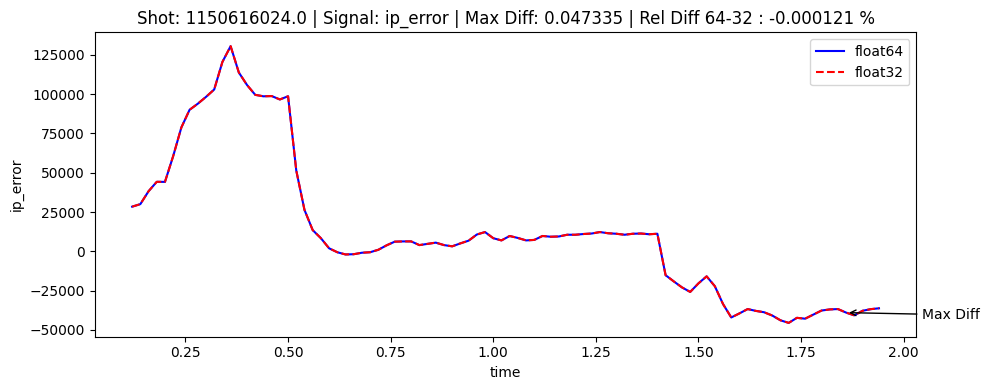

Max Uncertainty at time 1.8399999141693115 for shot 1150616024.0 with values: float32=277.36948051199033, float64=0.0


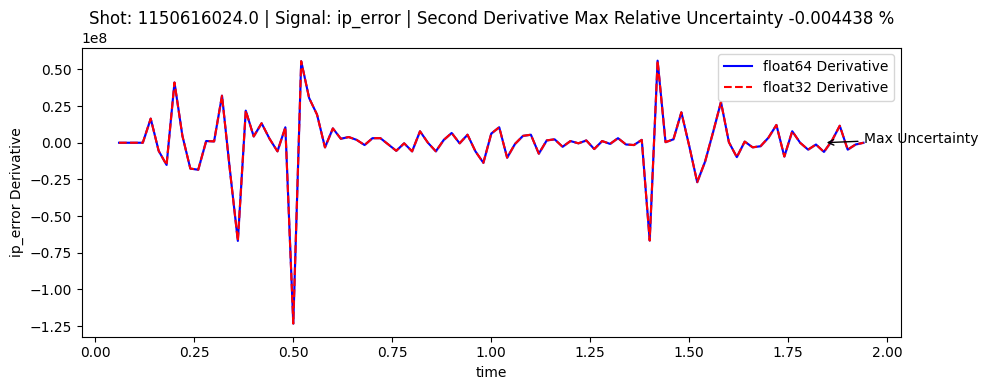

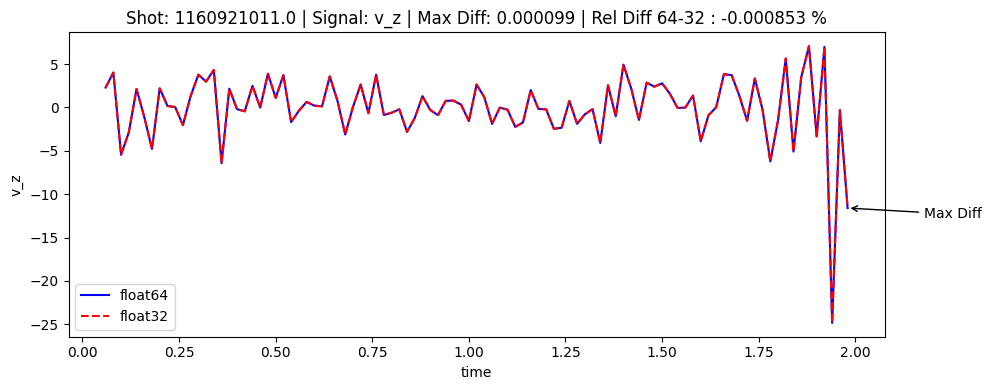

Max Uncertainty at time 1.959999918937683 for shot 1160921011.0 with values: float32=0.24726907774457185, float64=0.0


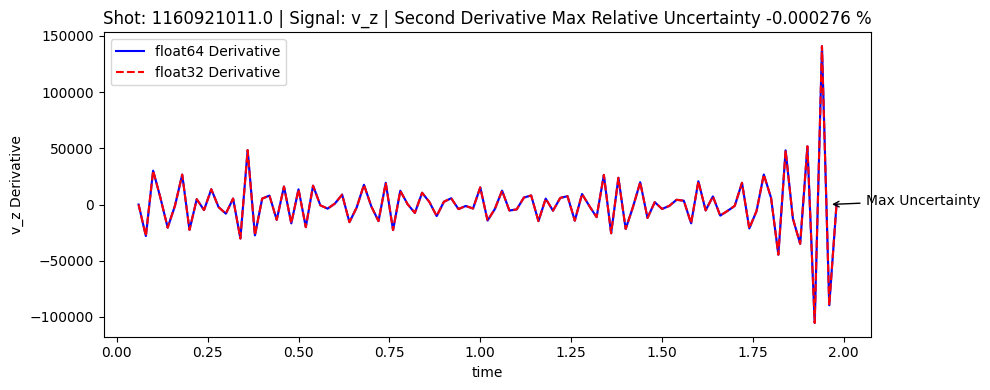

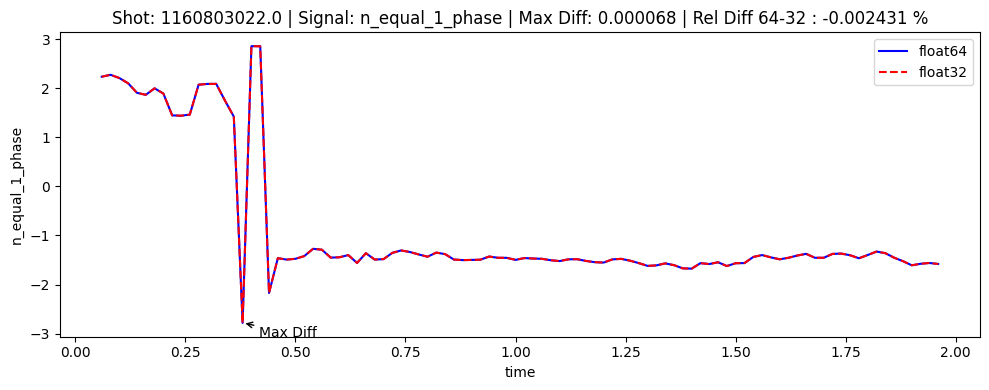

Max Uncertainty at time 0.3799999952316284 for shot 1160803022.0 with values: float32=0.3393460304743673, float64=0.0


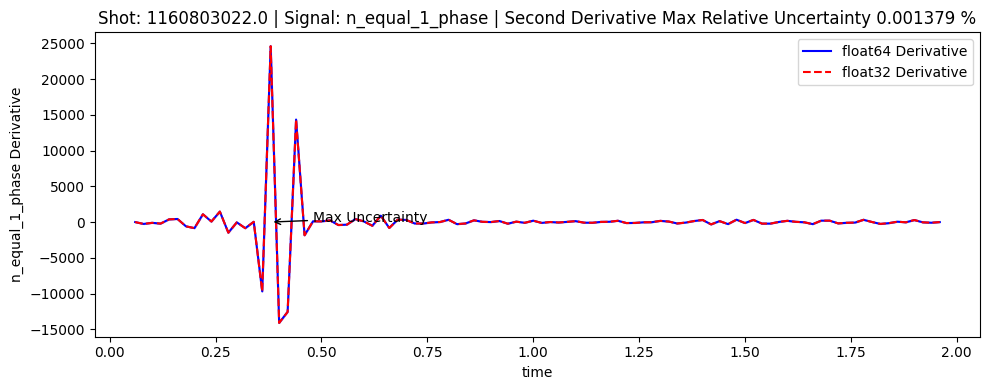

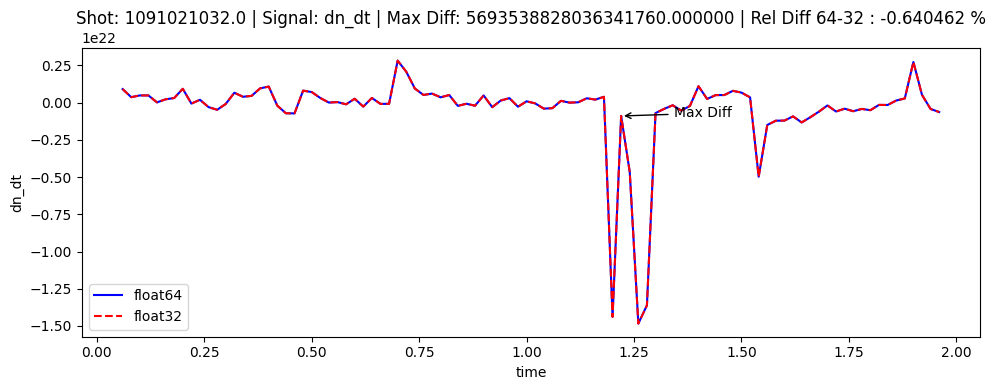

Max Uncertainty at time 1.21999990940094 for shot 1091021032.0 with values: float32=3.0656128884032234e+22, float64=0.0


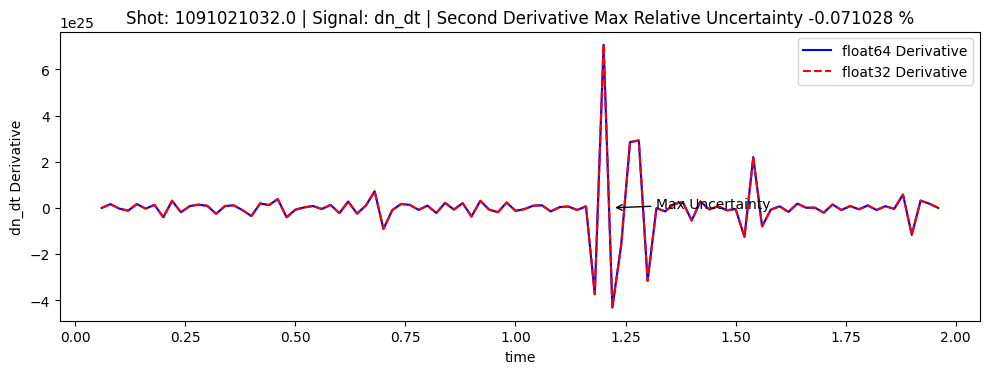

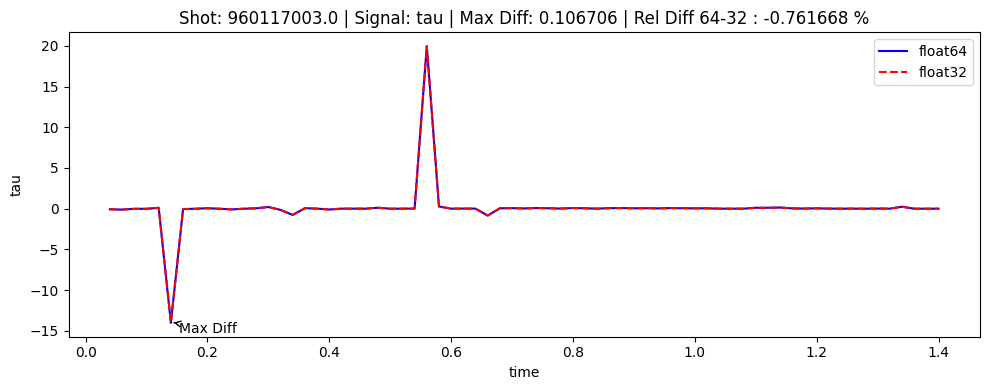

Max Uncertainty at time 0.1399999856948852 for shot 960117003.0 with values: float32=533.5301234226749, float64=0.0


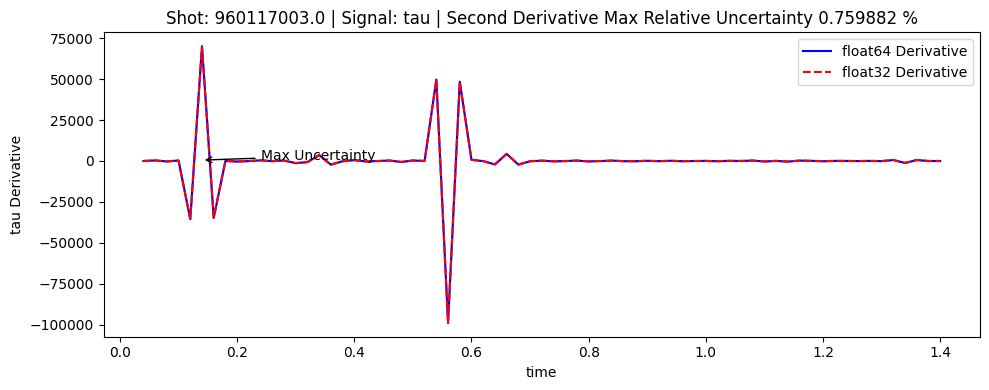

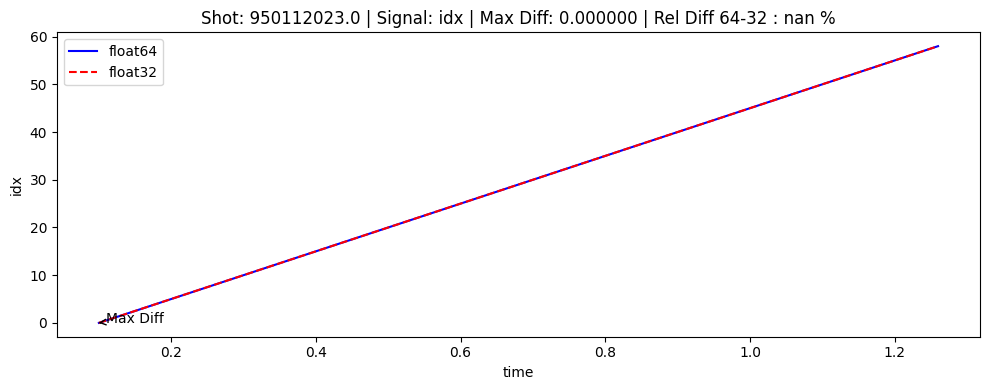

Max Uncertainty at time 0.1000000014901161 for shot 950112023.0 with values: float32=0.0, float64=0.0


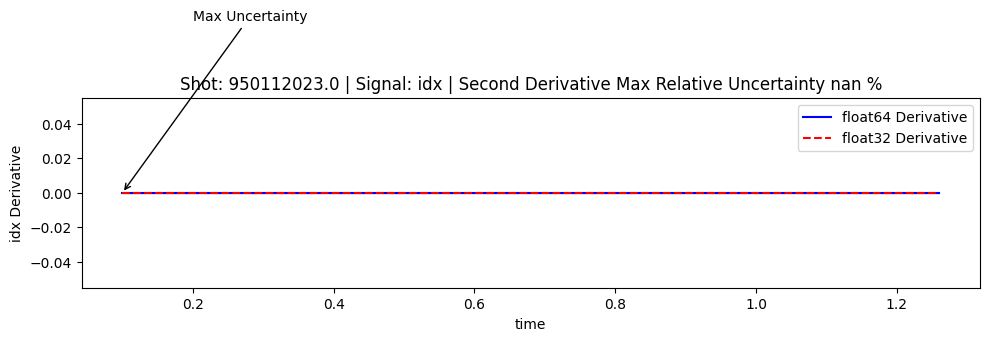

In [15]:
import matplotlib.pyplot as plt

for idx, row in max_diff_df_sorted.iterrows():
    shot = row['shot']
    signal = row['column']
    # Filter for the current shot
    df32_shot = df32[df32['shot'] == shot]
    df64_shot = df64[df64['shot'] == shot]
    if signal not in df32_shot.columns or signal not in df64_shot.columns:
        continue
    plt.figure(figsize=(10, 4))
    plt.plot(df64_shot['time'], df64_shot[signal], label='float64', color='b')
    plt.plot(df32_shot['time'], df32_shot[signal], label='float32', color='r', linestyle='--')
    # add an arrow to the plot indicating the maximum difference time
    max_time = df32_shot.loc[row['row_index'], 'time']
    max_value_32 = df32_shot.loc[row['row_index'], signal]
    max_value_64 = df64_shot.loc[row['row_index'], signal]
    plt.annotate('Max Diff', xy=(max_time, max_value_32), xytext=(max_time + 0.1*max_time, max_value_32 + 0.1*max_value_32),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.title(f"Shot: {shot} | Signal: {signal} | Max Diff: {row['absolute_difference']:.6f} | Rel Diff 64-32 : {row['relative_difference_64_percent']:.6f} %")
    plt.xlabel('time')
    plt.ylabel(signal)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # workout first_derivative_with_error
    t = df32_shot['time'].values
    f32 = df32_shot[signal].values
    f64 = df64_shot[signal].values
    # sigma_f32 = np.zeros_like(f32)  # Assuming no uncertainty for simplicity
    sigma_f32 = np.abs(f64)-np.abs(f32)  # Assuming no uncertainty for simplicity
    sigma_f64 = np.zeros_like(f64)  # Assuming no uncertainty for simplicity

    df32_derivative, sigma_df32 = second_derivative_with_error(t, f32, sigma_f32)
    df64_derivative, sigma_df64 = second_derivative_with_error(t, f64, sigma_f64)

    # replace NaNs with zeros for plotting
    df32_derivative = np.nan_to_num(df32_derivative)
    df64_derivative = np.nan_to_num(df64_derivative)
    sigma_df32 = np.nan_to_num(sigma_df32)
    sigma_df64 = np.nan_to_num(sigma_df64)

    plt.figure(figsize=(10, 4))
    plt.plot(t, df64_derivative, label='float64 Derivative', color='b')
    plt.plot(t, df32_derivative, label='float32 Derivative', color='r', linestyle='--')
    # plt.plot(t, sigma_df64, label='float64 Uncertainty', color='b', linestyle=':')
    # plt.plot(t, sigma_df32, label='float32 Uncertainty', color='r', linestyle=':')
    # use shaded area to represent uncertainty
    plt.fill_between(t, df64_derivative - sigma_df64, df64_derivative + sigma_df64, color='b', alpha=0.1)
    plt.fill_between(t, df32_derivative - sigma_df32, df32_derivative + sigma_df32, color='r', alpha=0.1)
    # max uncertainty time
    max_uncertainty_idx = np.abs(sigma_df32).argmax()
    max_uncertainty_value_32 = sigma_df32[max_uncertainty_idx]
    max_uncertainty_value_64 = sigma_df64[max_uncertainty_idx]
    max_uncertainty_derivative_32 = df32_derivative[max_uncertainty_idx]
    max_uncertainty_derivative_64 = df64_derivative[max_uncertainty_idx]
    max_uncertainty_time = t[max_uncertainty_idx]
    plt.annotate('Max Uncertainty', xy=(max_uncertainty_time, max_uncertainty_value_32), 
                 xytext=(max_uncertainty_time + 0.1, max_uncertainty_value_32 + 0.1),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    print(f"Max Uncertainty at time {max_uncertainty_time} for shot {shot} with values: float32={max_uncertainty_value_32}, float64={max_uncertainty_value_64}")
    
    plt.title(f"Shot: {shot} | Signal: {signal} | Second Derivative Max Relative Uncertainty {100*np.abs(max_uncertainty_value_64-max_uncertainty_value_32)/max_uncertainty_derivative_64:.6f} %")
    plt.xlabel('time')
    plt.ylabel(f"{signal} Derivative")
    plt.legend()
    plt.tight_layout()
    plt.show()

